<a href="https://colab.research.google.com/github/CheilaBaiao/Pantanal/blob/main/3)Impact_TTR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# @title R3-1 — Setup (libs, Drive, paths, config)
%pip -q install numpy pandas geopandas shapely rasterio rioxarray xarray tqdm pyyaml joblib

import os, re, glob, json, time, yaml, math, warnings
from pathlib import Path
import numpy as np, pandas as pd
from tqdm.auto import tqdm
import geopandas as gpd

from joblib import Memory
memory = Memory(location="/content/.joblib_cache", verbose=0)

# Montar Drive
from google.colab import drive
try:
    drive.mount('/content/drive')
except Exception as e:
    print("Aviso ao montar Drive:", e)

# Pastas-base
BASE_DIR   = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR    = BASE_DIR / "outputs"
LOG_DIR    = OUT_DIR / "logs"
QC_DIR     = OUT_DIR / "qc"
CACHE_DIR  = OUT_DIR / "cache_nb3"              # cache de agregações 30m→300m, etc.
TMP_DIR    = OUT_DIR / "tmp_nb3"                # temporários
for d in (OUT_DIR, LOG_DIR, QC_DIR, CACHE_DIR, TMP_DIR): d.mkdir(parents=True, exist_ok=True)

# Config
CONFIG_FP = BASE_DIR / "config.yaml"
assert CONFIG_FP.exists(), f"config.yaml não encontrado em {CONFIG_FP}"
CONFIG = yaml.safe_load(open(CONFIG_FP))

CRS_EPSG      = int(CONFIG.get("crs_epsg", 31983))
BOUNDARY_PATH = CONFIG.get("boundary_path"); assert BOUNDARY_PATH and Path(BOUNDARY_PATH).exists()
OPT_FOLDER    = CONFIG.get("gee_drive_folder_optical", "Pantanal_TippingPoints_optical")

# Fontes de dados
MB30_DIR   = Path("/content/drive/MyDrive/Pantanal_TippingPoints_val_mb_bi_30m")  # (1) sua pasta MB 30m
OPT_ROOTS  = [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]
OPT_DIRS   = [r / OPT_FOLDER for r in OPT_ROOTS]
MERGE_DIRS = [r / f"{OPT_FOLDER}_merged" for r in OPT_ROOTS]

# Onde salvar os agregados MB 300m (cache)
MB300_DIR  = OUT_DIR / "mb_bi_300m_cache"
MB300_DIR.mkdir(parents=True, exist_ok=True)

print("✔ Config carregada | EPSG:", CRS_EPSG)
print("✔ MB 30m:", MB30_DIR)
print("✔ MB 300m (cache):", MB300_DIR)




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 1.8 MB/s eta 0:00:00
Mounted at /content/drive
✔ Config carregada | EPSG: 31983
✔ MB 30m: /content/drive/MyDrive/Pantanal_TippingPoints_val_mb_bi_30m
✔ MB 300m (cache): /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/mb_bi_300m_cache


In [ ]:
# @title === PATCH — apontar para as pastas *opticos* corretas e checar disponibilidade ===
from pathlib import Path
import re, glob, rasterio as rio

# 1) Forçar o nome da pasta de ópticos no CONFIG (sem precisar editar o YAML no disco)
CONFIG["gee_drive_folder_optical"] = "Pantanal_TippingPoints_optical"

# 2) Reconstruir diretórios com base no novo OPT_FOLDER
OPT_FOLDER  = CONFIG.get("gee_drive_folder_optical", "Pantanal_TippingPoints_optical")
OPT_ROOTS   = [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]
OPT_DIRS    = [r / OPT_FOLDER for r in OPT_ROOTS]
MERGE_DIRS  = [r / f"{OPT_FOLDER}_merged" for r in OPT_ROOTS]

print("✔ OPT_FOLDER =", OPT_FOLDER)
print("✔ OPT_DIRS   =", [str(p) for p in OPT_DIRS])
print("✔ MERGE_DIRS =", [str(p) for p in MERGE_DIRS])

# 3) Função (re)definida: localizar SINGLE > MERGED por yyyymm
def _opt_path(ym: str) -> str | None:
    for d in OPT_DIRS:
        fp = d / f"opt_{ym}.tif"
        if fp.exists():
            return str(fp)
    for d in MERGE_DIRS:
        fp = d / f"opt_{ym}_merged.tif"
        if fp.exists():
            return str(fp)
    return None

# 4) Checagem rápida: quantos bimestres-alvo têm arquivo óptico?
sample_yms = YMS[:12] if 'YMS' in globals() and YMS else []
hits = [(ym, _opt_path(ym) is not None) for ym in sample_yms]
print(f"Amostra de YMS (até 12) com óptico:", sum(b for _,b in hits), "/", len(hits))
for ym, ok in hits[:6]:
    print(" ", ym, "→", "OK" if ok else "não encontrado")

# 5) Checar bandas de um arquivo (confirma a ordem NDVI,EVI,NBR,MNDWI,dNBR,RdNBR,OBS)
probe_ym = sample_yms[0] if sample_yms else None
if probe_ym:
    fp = _opt_path(probe_ym)
    if fp:
        with rio.open(fp) as ds:
            print(f"Arquivo de prova: {Path(fp).name} | bandas={ds.count} | shape={ds.height}×{ds.width}")
            # opcional: imprimir nomes esperados
            print("Esperado: ['NDVI','EVI','NBR','MNDWI','dNBR','RdNBR','OBS']")
    else:
        print("(!) Não encontrei arquivo de prova para", probe_ym)
else:
    print("(info) Sem YMS definidos ainda para amostragem.")


✔ OPT_FOLDER = Pantanal_TippingPoints_optical
✔ OPT_DIRS   = ['/content/drive/MyDrive/Pantanal_TippingPoints_optical', '/content/drive/My Drive/Pantanal_TippingPoints_optical']
✔ MERGE_DIRS = ['/content/drive/MyDrive/Pantanal_TippingPoints_optical_merged', '/content/drive/My Drive/Pantanal_TippingPoints_optical_merged']
Amostra de YMS (até 12) com óptico: 0 / 0
(info) Sem YMS definidos ainda para amostragem.


In [ ]:
# @title === R3-1b — Definir REF_FP (grade canônica 300 m) a partir de um óptico ===
import glob, re
from pathlib import Path
import rasterio as rio

# Garante que OPT_DIRS/MERGE_DIRS já existem (se você rodou o patch, já existem)
try:
    OPT_DIRS, MERGE_DIRS
except NameError:
    OPT_FOLDER  = CONFIG.get("gee_drive_folder_optical", "Pantanal_TippingPoints_opticos")
    OPT_ROOTS   = [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]
    OPT_DIRS    = [r / OPT_FOLDER for r in OPT_ROOTS]
    MERGE_DIRS  = [r / f"{OPT_FOLDER}_merged" for r in OPT_ROOTS]

EPSG_WANT = int(CONFIG.get("crs_epsg", 31983))

def _scan_opt_any():
    pats = []
    for d in OPT_DIRS:
        pats += glob.glob(str(d / "opt_??????.tif"))
    for d in MERGE_DIRS:
        pats += glob.glob(str(d / "opt_??????_merged.tif"))
    # ordena para estabilidade
    return sorted(set(pats))

candidates = _scan_opt_any()
assert candidates, (
    "Não achei nenhum raster óptico (opt_YYYYMM*.tif) nas pastas "
    f"{[str(p) for p in OPT_DIRS + MERGE_DIRS]}. Verifique os caminhos."
)

# escolhe o primeiro com CRS compatível; se não houver, cai no primeiro mesmo
def _pick_ref(cands):
    chosen = None
    for fp in cands:
        try:
            with rio.open(fp) as ds:
                if ds.crs and (str(ds.crs).endswith(str(EPSG_WANT)) or ds.crs.to_epsg()==EPSG_WANT):
                    chosen = fp
                    break
        except Exception:
            pass
    return chosen or cands[0]

REF_FP = _pick_ref(candidates)

with rio.open(REF_FP) as ref:
    REF_META = ref.meta.copy()
    res_x = abs(ref.transform.a)
    res_y = abs(ref.transform.e)
    crs   = ref.crs
    shape = (ref.height, ref.width)

print("✔ REF_FP =", Path(REF_FP).name)
print("  → CRS:", crs, "| EPSG esperado:", EPSG_WANT)
print("  → resolução (m):", (res_x, res_y), "| shape (H×W):", shape)

# guard-rails: avisa se CRS não bate e se resolução não é ~300m
try:
    epsg_ref = crs.to_epsg()
except Exception:
    epsg_ref = None

if epsg_ref and (epsg_ref != EPSG_WANT):
    print(f"⚠ Aviso: EPSG do REF ({epsg_ref}) difere do config ({EPSG_WANT}). "
          "Posso reprojetar os demais para o REF; se quiser, ajuste o config.yaml.")

if not (250 <= res_x <= 350 and 250 <= res_y <= 350):
    print("⚠ Aviso: resolução do REF não está por volta de 300 m. "
          "Confirme se este é mesmo o raster de referência desejado.")


✔ REF_FP = opt_198509.tif
  → CRS: EPSG:31983 | EPSG esperado: 31983
  → resolução (m): (300.0, 300.0) | shape (H×W): (2448, 1612)


In [ ]:
# @title R3-2b — Bimestres alvo (1987-09 .. 2021-11) + disponibilidade MB30 e VOD bimestral
from pathlib import Path
import re

START_YM = "198709"   # começa em set/1987
END_YM   = "202111"   # termina em nov/2021
BISTART  = ("01","03","05","07","09","11")

def seq_bi(start_ym, end_ym):
    y = int(start_ym[:4]); m = int(start_ym[4:6])
    ye = int(end_ym[:4]);  me = int(end_ym[4:6])
    out=[]
    while (y < ye) or (y==ye and m<=me):
        out.append(f"{y}{m:02d}")
        # avança 2 meses
        m += 2
        if m>12: y += 1; m -= 12
    return out

TARGET_YYYYMM = seq_bi(START_YM, END_YM)

# --- MapBiomas 30 m existentes ---
def _mb30_path(ym: str) -> Path|None:
    for name in (f"mb_bi_{ym}_30m.tif", f"mb_bi_{ym}.tif"):
        p = MB30_DIR / name
        if p.exists(): return p
    return None

YMS_MB = [ym for ym in TARGET_YYYYMM if _mb30_path(ym)]
print("MB 30m disponíveis no período:", len(YMS_MB), "| amostra:", YMS_MB[:6])

# --- VOD bimestral existente (arquivos 'vodca_YYYYMM.tif') ---
VOD_BI_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/interim/vodca")
assert VOD_BI_DIR.exists(), f"Pasta VOD bimestral não encontrada: {VOD_BI_DIR}"
re_ym = re.compile(r"(19|20)\d{2}(0[1-9]|1[0-2])")

def _vod_bi_path(ym: str) -> Path|None:
    p = VOD_BI_DIR / f"vodca_{ym}.tif"
    return p if p.exists() else None

YMS_VOD = [ym for ym in TARGET_YYYYMM if _vod_bi_path(ym)]
print("VOD bimestrais disponíveis no período:", len(YMS_VOD), "| amostra:", YMS_VOD[:6])

# --- Universo final: interseção (somente meses com MB e VOD) ---
YMS = sorted(set(YMS_MB) & set(YMS_VOD))
print("Bimestres efetivos (MB ∩ VOD):", len(YMS), "| primeiros:", YMS[:6], "| últimos:", YMS[-6:])




MB 30m disponíveis no período: 206 | amostra: ['198709', '198711', '198801', '198803', '198805', '198807']
VOD bimestrais disponíveis no período: 206 | amostra: ['198709', '198711', '198801', '198803', '198805', '198807']
Bimestres efetivos (MB ∩ VOD): 206 | primeiros: ['198709', '198711', '198801', '198803', '198805', '198807'] | últimos: ['202101', '202103', '202105', '202107', '202109', '202111']


In [ ]:
# @title R3-3 — Cache de MB 300 m (frac e mode) a partir do 30 m
import rasterio as rio
from rasterio.warp import reproject, Resampling

with rio.open(REF_FP) as ref:
    ref_meta_float = ref.meta.copy()
    ref_meta_float.update(count=1, dtype='float32', nodata=0.0, compress='lzw',
                          tiled=True, blockxsize=512, blockysize=512, BIGTIFF='IF_SAFER')
    ref_meta_byte = ref.meta.copy()
    ref_meta_byte.update(count=1, dtype='uint8', nodata=0, compress='lzw',
                         tiled=True, blockxsize=512, blockysize=512, BIGTIFF='IF_SAFER')

def mb300_frac_path(ym): return MB300_DIR / f"mb_bi_{ym}_300m_frac.tif"
def mb300_mode_path(ym): return MB300_DIR / f"mb_bi_{ym}_300m_mode.tif"

def build_mb300_from_30m(ym: str, force=False):
    """Agrega 30m→300m (frac e mode) e salva em cache; retorna paths."""
    p_frac = mb300_frac_path(ym); p_mode = mb300_mode_path(ym)
    if (not force) and p_frac.exists() and p_mode.exists():
        return p_frac, p_mode

    src_fp = _mb30_path(ym)
    assert src_fp and src_fp.exists(), f"MB 30m não encontrado para {ym}"
    with rio.open(src_fp) as src:
        arr30 = src.read(1).astype("float32")  # 0/1
        src_meta = src.meta

    # FRAÇÃO (média dos 0/1) → rápido e estável
    frac = np.zeros((ref_meta_float["height"], ref_meta_float["width"]), dtype="float32")
    reproject(
        source=arr30, destination=frac,
        src_transform=src_meta['transform'], src_crs=src_meta['crs'],
        dst_transform=ref_meta_float['transform'], dst_crs=ref_meta_float['crs'],
        src_nodata=None, dst_nodata=0.0,   # << não trate 0 como NoData
        resampling=Resampling.average
    )

    # MODE (maioria estrita): empate (0.5) vira 0 (conservador)
    mode = (frac > 0.5).astype("uint8")

    if not p_frac.exists():
        with rio.open(p_frac, "w", **ref_meta_float) as dst: dst.write(frac, 1)
    if not p_mode.exists():
        with rio.open(p_mode, "w", **ref_meta_byte)  as dst: dst.write(mode, 1)
    return p_frac, p_mode

# Pré-gerar apenas metadados do que falta (lazy real ocorre na leitura tile)
PENDING_MB = [ym for ym in YMS_MB if not (mb300_frac_path(ym).exists() and mb300_mode_path(ym).exists())]
print(f"MB 300m pendentes no cache (gerados sob demanda): {len(PENDING_MB)}")


MB 300m pendentes no cache (gerados sob demanda): 0


In [ ]:
# @title VODCA mensal → bimestral 300 m (com cache e retomada)
%pip -q install rioxarray xarray

import re, glob
import rasterio as rio
import numpy as np
import xarray as xr
import rioxarray as rxr
from pathlib import Path
from rasterio.warp import reproject, Resampling

# === Fonte VODCA (mensal) ===
VOD_SRC_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/interim/vodca")  # << seu caminho
assert VOD_SRC_DIR.exists(), f"Pasta VODCA não encontrada: {VOD_SRC_DIR}"

# Cache de saída bimestral (já em 300 m, alinhado à grade canônica)
VOD_BI_300_DIR = OUT_DIR / "vod_bi_300m_cache"
VOD_BI_300_DIR.mkdir(parents=True, exist_ok=True)

# --- util: extrair yyyymm de um nome ---
_date_pat = re.compile(r"(19|20)\d{2}(0[1-9]|1[0-2])")

def _yyyymm_from_name(fp: Path):
    m = _date_pat.search(fp.name.replace("-", "").replace("_", ""))
    return m.group(0) if m else None

# --- varrer arquivos mensais (GeoTIFF .tif ou NetCDF .nc) ---
VOD_MONTHLY = []
for ext in ("*.tif", "*.tiff", "*.nc", "*.nc4"):
    for p in sorted(VOD_SRC_DIR.rglob(ext)):
        ym = _yyyymm_from_name(p)
        if ym: VOD_MONTHLY.append((ym, p))
vod_map = {}
for ym, p in VOD_MONTHLY:
    # mantém o primeiro por ordem (ajuste se quiser priorizar .tif)
    vod_map.setdefault(ym, p)

print(f"VOD mensais encontrados: {len(vod_map)} ex.:", list(vod_map.items())[:3])

# --- leitor mensal genérico ---
def _read_vod_month_to_300m(ym: str) -> np.ndarray:
    """
    Lê o VOD mensal (tif ou nc), reprojeta/agrega para a grade 300 m (bilinear/average) e devolve array float32.
    """
    fp = vod_map.get(ym, None)
    if fp is None:
        # sem VOD para esse mês
        return None

    # ler em lat/lon nativa (~0.25°)
    if fp.suffix.lower() in (".tif", ".tiff"):
        with rio.open(fp) as src:
            src_arr  = src.read(1).astype("float32")
            src_meta = {"transform": src.transform, "crs": src.crs}
    else:
        # NetCDF: tentar variáveis comuns: 'vod', 'VOD', 'vod_x', etc.
        ds = xr.open_dataset(fp)
        # heurística: pegar a 1ª variável 2D com dims lat/lon
        vname = None
        for k, da in ds.data_vars.items():
            if da.ndim >= 2:
                vname = k; break
        assert vname is not None, f"Não encontrei variável 2D no {fp}"
        da = ds[vname]
        # se tiver dimensão 'time', selecionar única ou a primeira
        if "time" in da.dims:
            da = da.isel(time=0)
        # garantir CRS geográfico
        # rioxarray: definir CRS se não existir (assumir EPSG:4326)
        if not da.rio.crs:
            da = da.rio.write_crs("EPSG:4326")
        # reamostrar para a grade 300 m (via rasterio depois)
        # exportar para array + transform/crs via rioxarray
        da = da.rio.reproject("EPSG:4326")  # mantém geográfico
        src_arr = da.values.astype("float32")
        transform = da.rio.transform()
        crs       = da.rio.crs
        src_meta  = {"transform": transform, "crs": crs}

    # reprojetar para a grade canônica 300 m (bilinear/média)
    with rio.open(REF_FP) as ref:
        ref_crs = ref.crs; ref_tfm = ref.transform
        H, W = ref.height, ref.width

    dst = np.full((H, W), np.nan, dtype="float32")
    reproject(
        source=src_arr,
        destination=dst,
        src_transform=src_meta["transform"], src_crs=src_meta["crs"],
        dst_transform=ref_tfm,                dst_crs=ref_crs,
        src_nodata=None, dst_nodata=np.nan,
        resampling=Resampling.bilinear
    )
    return dst

# --- bimestralizar (média de 2 meses consecutivos) com cache em disco ---
def _ym_plus2(ym: str) -> str:
    y = int(ym[:4]); m = int(ym[4:6])
    m2 = m + 1
    y2 = y + (m2-1)//12
    mm = ((m2-1)%12)+1
    return f"{y2}{mm:02d}"

def vod_bi_300_path(ym_bi: str) -> Path:
    return VOD_BI_300_DIR / f"vod_{ym_bi}_300m.tif"

def ensure_vod_bi_300(ym_bi: str) -> Path | None:
    """
    Gera (se necessário) o VOD bimestral 300m alinhado ao REF_FP para o bimestre 'ym_bi' (MM em {01,03,05,07,09,11}).
    Regra: VOD_bi = média(VOD_month[MM], VOD_month[MM+1]) em 300 m.
    """
    out_fp = vod_bi_300_path(ym_bi)
    if out_fp.exists():
        return out_fp

    ym1 = ym_bi
    ym2 = _ym_plus2(ym_bi)
    a1 = _read_vod_month_to_300m(ym1)
    a2 = _read_vod_month_to_300m(ym2)
    if a1 is None and a2 is None:
        return None
    if a1 is None: a1 = a2.copy()
    if a2 is None: a2 = a1.copy()
    bi = np.nanmean(np.stack([a1, a2], axis=0), axis=0).astype("float32")

    # gravar alinhado
    with rio.open(REF_FP) as ref:
        profile = ref.meta.copy()
        profile.update(count=1, dtype="float32", nodata=np.nan,
                       compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
        with rio.open(out_fp, "w", **profile) as dst:
            dst.write(bi, 1)
    return out_fp

print("✔ VODCA bimestral (300 m) pronto para ser usado com cache automático.")



VOD mensais encontrados: 207 ex.: [('198707', PosixPath('/content/drive/MyDrive/Pantanal_TippingPoints/index/interim/vodca/vodca_198707.tif')), ('198709', PosixPath('/content/drive/MyDrive/Pantanal_TippingPoints/index/interim/vodca/vodca_198709.tif')), ('198711', PosixPath('/content/drive/MyDrive/Pantanal_TippingPoints/index/interim/vodca/vodca_198711.tif'))]
✔ VODCA bimestral (300 m) pronto para ser usado com cache automático.


In [ ]:
# @title R3-4 — Tiles baseados na grade 300 m (em pixels) + checkpoint por tile
import rasterio as rio
from math import ceil

# Parâmetros de tile (ajuste conforme sua RAM): 1024x1024 costuma ir bem
TILE_PX = 1024

with rio.open(REF_FP) as ref:
    H, W = ref.height, ref.width
    tfm  = ref.transform
NTY = ceil(H / TILE_PX)
NTX = ceil(W / TILE_PX)
print(f"Grade de tiles: {NTX} (x) × {NTY} (y)")

# Lista de tiles (ix,iy) → window (row_off, col_off, height, width)
tiles = []
for iy in range(NTY):
    for ix in range(NTX):
        row_off = iy * TILE_PX
        col_off = ix * TILE_PX
        h = min(TILE_PX, H - row_off)
        w = min(TILE_PX, W - col_off)
        tiles.append((ix, iy, row_off, col_off, h, w))
print("Total de tiles:", len(tiles))

# Checkpoint: cada tile gera arquivos de saída (por métrica). Nome padronizado:
REC_DIR = OUT_DIR / "recovery_nb3"
REC_DIR.mkdir(parents=True, exist_ok=True)

def tile_tag(ix, iy): return f"x{ix:03d}_y{iy:03d}"
def out_fp(metric, ix, iy): return REC_DIR / f"rec_{metric}_{tile_tag(ix,iy)}.tif"
def out_log_path(): return LOG_DIR / "nb3_recovery_progress.json"

# progress log para retomar
if (out_log_path()).exists():
    PROG = json.load(open(out_log_path()))
else:
    PROG = {"done": [], "params": {}}

def mark_done(metric, ix, iy):
    key = f"{metric}:{tile_tag(ix,iy)}"
    if key not in PROG["done"]:
        PROG["done"].append(key)
        with open(out_log_path(), "w") as f: json.dump(PROG, f, indent=2)




Grade de tiles: 2 (x) × 3 (y)
Total de tiles: 6


In [ ]:
# @title R3-5 — Funções utilitárias: carregar séries e avaliar recuperação (com PATCH)

import numpy as np
import rasterio as rio
from rasterio.windows import Window

# ---------------------------------------------------------------------
# Parâmetros globais (ajuste na R3-6 se quiser)
# ---------------------------------------------------------------------
N_PRE     = 6       # bimestres de baseline (12 meses)
REC_RATIO = 0.90    # alvo de recuperação = REC_RATIO * baseline
MAX_POST  = 18      # busca recuperação até 36 meses após o fogo
EPS       = 1e-6    # tolerância p/ baseline ~0

# ---------------------------------------------------------------------
# Ópticos 300 m — leitura por banda
# Seu stack óptico tem as bandas nesta ordem:
# ['NDVI','EVI','NBR','MNDWI','dNBR','RdNBR','OBS']
# ---------------------------------------------------------------------
OPT_BANDS = ['NDVI','EVI','NBR','MNDWI','dNBR','RdNBR','OBS']

# Espera que OPT_DIRS e MERGE_DIRS já venham da R3-1
def _opt_path(ym: str) -> str | None:
    """Retorna caminho do raster óptico 300 m para yyyymm (SINGLE > MERGED)."""
    for d in OPT_DIRS:
        fp = d / f"opt_{ym}.tif"
        if fp.exists():
            return str(fp)
    for d in MERGE_DIRS:
        fp = d / f"opt_{ym}_merged.tif"
        if fp.exists():
            return str(fp)
    return None

def read_opt_band(ym: str, band_idx: int, window: Window | None = None) -> np.ndarray:
    """
    Lê uma banda (0-based) do raster óptico 300 m do bimestre 'ym'.
    Retorna float32 (com NaN conforme o arquivo).
    """
    fp = _opt_path(ym)
    assert fp, f"Óptico 300 m não encontrado para {ym}"
    with rio.open(fp) as ds:
        arr = ds.read(band_idx + 1, window=window).astype("float32")
    return arr

# ---------------------------------------------------------------------
# VOD bimestral 300 m (alinhado)
# A célula R3-5b define ensure_vod_bi_aligned(ym).
# Aqui fornecemos um leitor que a utiliza, com fallback para None.
# ---------------------------------------------------------------------
def read_vod(ym: str, window: Window | None = None) -> np.ndarray | None:
    """
    Lê o VOD bimestral 300 m alinhado ao raster de referência.
    Requer ensure_vod_bi_aligned(ym) definido na R3-5b.
    Se R3-5b não tiver sido executada, retorna None.
    """
    try:
        fp = ensure_vod_bi_aligned(ym)  # definida na R3-5b
    except NameError:
        return None
    if fp is None:
        return None
    with rio.open(fp) as ds:
        return ds.read(1, window=window).astype("float32")

# ---------------------------------------------------------------------
# Utilitário temporal (bimestres)
# ---------------------------------------------------------------------
def months_after(ym: str, n: int) -> str:
    """
    Avança 'n' bimestres a partir de YYYYMM (onde MM ∈ {01,03,05,07,09,11}).
    """
    y, m = int(ym[:4]), int(ym[4:6])
    m2 = m + 2*n
    y2 = y + (m2 - 1) // 12
    mm = ((m2 - 1) % 12) + 1
    return f"{y2}{mm:02d}"

# ---------------------------------------------------------------------
# PATCH — Função de recuperação aceitando baseline NEGATIVO
# Apenas baseline ~0 é rejeitado.
# ---------------------------------------------------------------------
def recovery_time(series_prepost: np.ndarray, fire_idx: int) -> float:
    """
    Dada uma série temporal (float) e o índice 'fire_idx' (bimestre do fogo),
    retorna o número de bimestres até 'recuperar' (>= REC_RATIO * baseline),
    ou NaN se não recuperar dentro de MAX_POST.

    Notas:
      - baseline = mediana dos N_PRE bimestres anteriores ao fogo;
      - aceita baseline NEGATIVO (ex.: anomalias). Só rejeita baseline ~0;
      - a condição 'val >= target' funciona para baseline positivo ou negativo:
        se base < 0 → target também é negativo, porém mais próximo de 0.
    """
    # precisa ter histórico suficiente
    if fire_idx < N_PRE:
        return np.nan

    pre = series_prepost[fire_idx - N_PRE : fire_idx]
    if not np.isfinite(pre).any():
        return np.nan

    base = np.nanmedian(pre)

    # aceita baseline negativo; rejeita apenas baseline "praticamente zero"
    if (not np.isfinite(base)) or (abs(base) <= EPS):
        return np.nan

    target = REC_RATIO * base  # se base<0, alvo é menos negativo (mais perto de 0)

    end  = min(len(series_prepost), fire_idx + 1 + MAX_POST)
    post = series_prepost[fire_idx + 1 : end]

    for i, val in enumerate(post, start=1):
        if np.isfinite(val) and (val >= target):
            return float(i)

    return np.nan



✔ Salvo: first_fire_yyyymm.tif | first_fire_year.tif | first_fire_fraction.tif
✔ CSV: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/first_fire_quick_stats.csv


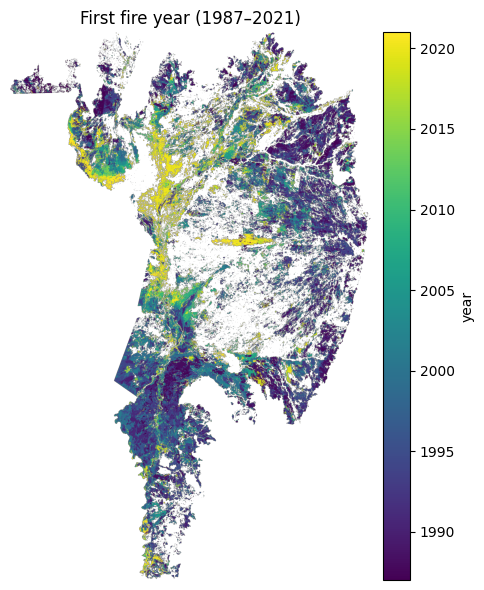

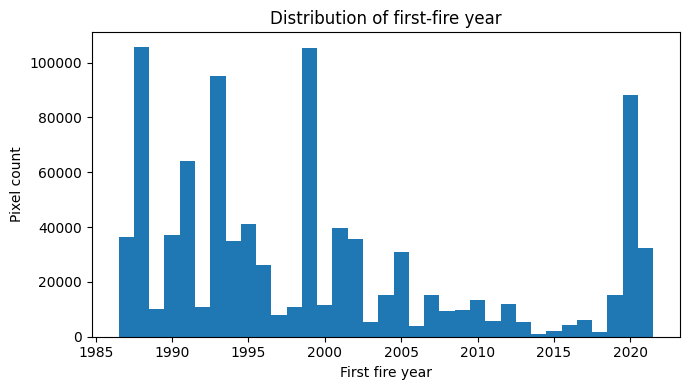

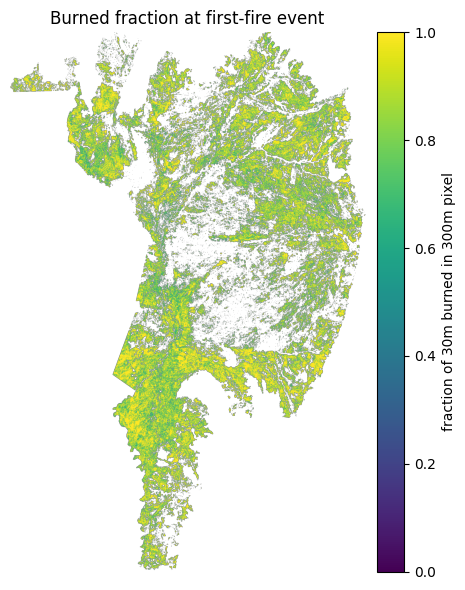

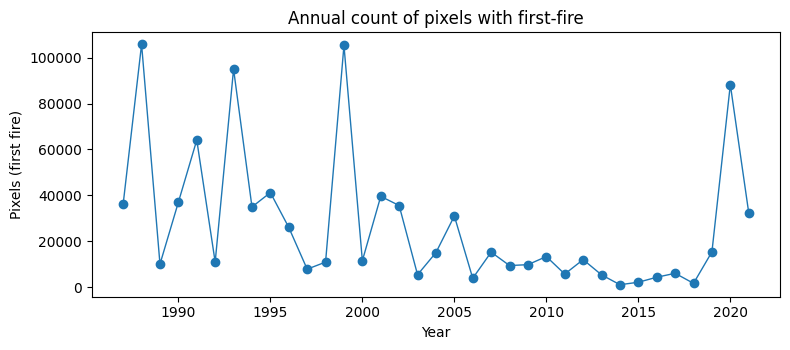

In [ ]:
# @title P2-EVT-export — Primeiro evento de fogo (ano/yyyymm + fração do 1º evento) + mapas/figuras
import numpy as np, pandas as pd, geopandas as gpd, rasterio as rio
from rasterio.windows import Window
from rasterio.features import rasterize
import matplotlib.pyplot as plt
from pathlib import Path
from math import ceil

assert 'YMS' in globals(), "Defina YMS (R3-2b)."
assert 'build_mb300_from_30m' in globals(), "R3-3 precisa estar definida."
REC_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# Parâmetros (ajuste se quiser)
# -----------------------------
FRACTION_TH = 0.25   # limiar de fração queimada na célula 300 m
USE_MODE    = True   # exige majority (mode==1)
N_PRE       = 6      # baseline = mediana dos 6 bimestres anteriores ao fogo
EARLY_WIN   = 2      # early = média dos 2 bimestres imediatamente após o fogo
LATE_WIN    = 6      # late  = média dos 6 bimestres subsequentes (do 3º ao 8º pós-fogo)
EPS         = 1e-6   # proteção contra divisão por ~0
# --- Perfil/grade e máscara Pantanal ---
with rio.open(REF_FP) as ref:
    H,W   = ref.height, ref.width
    tfm   = ref.transform
    crs   = ref.crs
    profile_int = ref.meta.copy();  profile_int.update(count=1, dtype="int32",   nodata=-9999, compress="lzw", tiled=True, BIGTIFF="IF_SAFER")
    profile_f32 = ref.meta.copy();  profile_f32.update(count=1, dtype="float32", nodata=np.nan,  compress="lzw", tiled=True, BIGTIFF="IF_SAFER")

gdf  = gpd.read_file(BOUNDARY_PATH).to_crs(crs)
MASK = rasterize([(g,1) for g in gdf.geometry if g and not g.is_empty],
                 out_shape=(H,W), transform=tfm, fill=0, dtype="uint8").astype(bool)

# --- Acúmulo do primeiro evento e fração daquele bimestre ---
first_t   = np.full((H,W), -1,    dtype="int32")   # índice t do 1º fogo (no vetor YMS)
first_ym  = np.full((H,W), -9999, dtype="int32")   # yyyymm do 1º fogo
first_frac= np.full((H,W), np.nan, dtype="float32")# fração (0..1) no 1º fogo

# Varre bimestres até achar o 1º evento por pixel (FRACTION_TH + USE_MODE)
for t, ym in enumerate(YMS):
    p_frac, p_mode = build_mb300_from_30m(ym, force=False)
    with rio.open(p_frac) as df: FR = df.read(1).astype("float32")
    with rio.open(p_mode) as dm: MD = dm.read(1).astype("uint8")
    fire = (FR >= float(FRACTION_TH))
    if bool(USE_MODE): fire &= (MD == 1)
    need = (first_t < 0) & fire & MASK
    if not np.any(need):
        continue
    first_t[need]    = t
    first_ym[need]   = int(ym)
    first_frac[need] = FR[need]

# Fora do Pantanal / sem evento → NoData
first_ym[~MASK | (first_t < 0)]    = -9999
first_frac[~MASK | (first_t < 0)]  = np.nan

# --- Salva rasters finais ---
evt_ym_fp   = REC_DIR / "first_fire_yyyymm.tif"
evt_year_fp = REC_DIR / "first_fire_year.tif"
evt_frac_fp = REC_DIR / "first_fire_fraction.tif"

with rio.open(evt_ym_fp,   "w", **profile_int) as dst: dst.write(first_ym, 1)
with rio.open(evt_year_fp, "w", **profile_int) as dst:
    years = np.where(first_ym>0, first_ym//100, -9999).astype("int32")
    dst.write(years, 1)
with rio.open(evt_frac_fp, "w", **profile_f32) as dst: dst.write(first_frac, 1)

print("✔ Salvo:", evt_ym_fp.name, "|", evt_year_fp.name, "|", evt_frac_fp.name)

# --- Tabelas rápidas para artigo ---
vals_year = years[(years>0)]
vals_frac = first_frac[np.isfinite(first_frac)]
pd.DataFrame({
    "n_pixels_com_fogo":[int(vals_year.size)],
    "ano_min":[int(vals_year.min()) if vals_year.size else None],
    "ano_mediana":[int(np.median(vals_year)) if vals_year.size else None],
    "ano_max":[int(vals_year.max()) if vals_year.size else None],
    "frac_p25":[float(np.percentile(vals_frac,25)) if vals_frac.size else None],
    "frac_mediana":[float(np.median(vals_frac)) if vals_frac.size else None],
    "frac_p75":[float(np.percentile(vals_frac,75)) if vals_frac.size else None],
}).to_csv(REC_DIR/"first_fire_quick_stats.csv", index=False)
print("✔ CSV:", REC_DIR/"first_fire_quick_stats.csv")

# --- FIGURAS (prontas para artigo) ---
# (A) Mapa do ano do 1º fogo (sem colorbar numérica, rótulo discreto ajuda no layout)
plt.figure(figsize=(7,6))
A = np.where(years>0, years, np.nan)
vmin, vmax = np.nanpercentile(A, 2), np.nanpercentile(A, 98)
im = plt.imshow(A, vmin=vmin, vmax=vmax)
plt.title("First fire year (1987–2021)")
plt.axis("off")
cb = plt.colorbar(im, fraction=0.046, pad=0.02)
cb.set_label("year")
plt.tight_layout()
plt.savefig(REC_DIR/"fig_first_fire_year_map.png", dpi=300)
plt.show()

# (B) Histograma de anos do 1º fogo
plt.figure(figsize=(7,4))
bins = np.arange(int(vmin)-0.5, int(vmax)+1.5, 1)
plt.hist(vals_year, bins=bins)
plt.xlabel("First fire year")
plt.ylabel("Pixel count")
plt.title("Distribution of first-fire year")
plt.tight_layout()
plt.savefig(REC_DIR/"fig_first_fire_year_hist.png", dpi=300)
plt.show()

# (C) Mapa da fração (quão “forte” foi o 1º fogo no pixel)
plt.figure(figsize=(7,6))
im = plt.imshow(first_frac, vmin=0, vmax=1)
plt.title("Burned fraction at first-fire event")
plt.axis("off")
cb = plt.colorbar(im, fraction=0.046, pad=0.02); cb.set_label("fraction of 30m burned in 300m pixel")
plt.tight_layout()
plt.savefig(REC_DIR/"fig_first_fire_fraction_map.png", dpi=300)
plt.show()

# (D) Série de área queimada por ano (a partir do 1º fogo)
#     (conta quantos pixels tiveram 1º fogo naquele ano)
if vals_year.size:
    u, c = np.unique(vals_year, return_counts=True)
    df_year = pd.DataFrame({"year":u, "pixels_first_fire":c}).sort_values("year")
    df_year.to_csv(REC_DIR/"first_fire_by_year.csv", index=False)
    plt.figure(figsize=(8,3.6))
    plt.plot(df_year["year"], df_year["pixels_first_fire"], marker='o', linewidth=1)
    plt.xlabel("Year"); plt.ylabel("Pixels (first fire)")
    plt.title("Annual count of pixels with first-fire")
    plt.tight_layout()
    plt.savefig(REC_DIR/"fig_first_fire_by_year_line.png", dpi=300)
    plt.show()


✔ Figura salva em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/first_fire_2x2.png


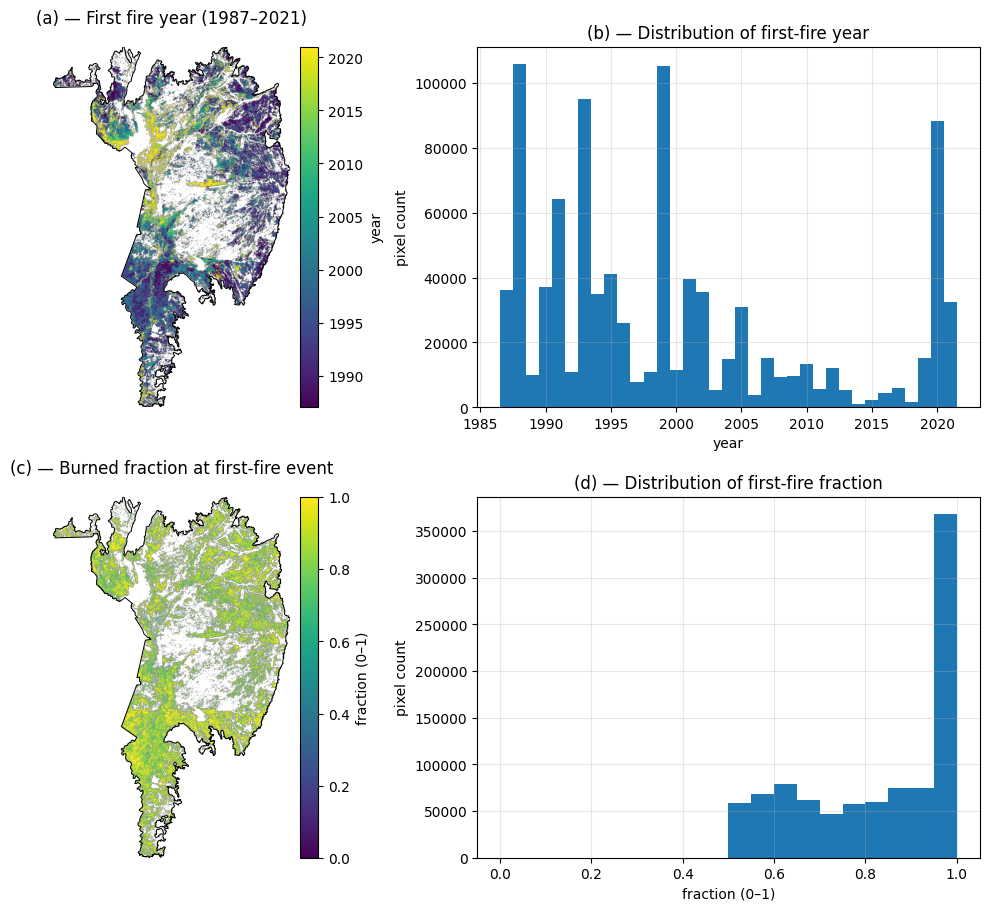

In [ ]:
# @title P2-FIG-2x2 — First-fire year (A,B) + First-fire fraction (C,D) com rótulos A–D
import numpy as np, geopandas as gpd, rasterio as rio, matplotlib.pyplot as plt

from rasterio.features import rasterize

# --- abrir grade/extent e máscara do Pantanal ---
with rio.open(REF_FP) as ref:
    H, W  = ref.height, ref.width
    tfm   = ref.transform
    crs   = ref.crs
    xmin, ymax = tfm.c, tfm.f
    xmax = xmin + W * tfm.a
    ymin = ymax + H * tfm.e  # (e < 0)
extent = (xmin, xmax, ymin, ymax)

gdf = gpd.read_file(BOUNDARY_PATH).to_crs(crs)

# arrays esperados da célula P2-EVT-export:
#  - years     (int; -9999 = NoData)   → ano do primeiro fogo
#  - first_frac(float; NaN = NoData)   → fração no 1º evento
A_year = np.where(years > 0, years, np.nan).astype("float32")
A_frac = first_frac.astype("float32")

# máscaras válidas
M_year = np.isfinite(A_year)
M_frac = np.isfinite(A_frac)

# escalas (robustas) para mapas
if M_year.any():
    vminY, vmaxY = np.nanpercentile(A_year[M_year], [2, 98])
else:
    vminY, vmaxY = 1987, 2021
vminF, vmaxF = 0.0, 1.0

# --- figura 2×2 ---
fig, axs = plt.subplots(2, 2, figsize=(12, 9), constrained_layout=True)

# helper para contorno
def plot_outline(ax):
    try:
        gdf.boundary.plot(ax=ax, edgecolor="black", linewidth=0.7)
    except Exception:
        pass

# === (A) mapa — ano do 1º fogo ===
ax = axs[0,0]
imA = ax.imshow(A_year, vmin=vminY, vmax=vmaxY, extent=extent, origin="upper")
plot_outline(ax)
ax.set_title("(a) — First fire year (1987–2021)")
ax.axis("off")
cbA = fig.colorbar(imA, ax=ax, fraction=0.046, pad=0.02)
cbA.set_label("year")

# === (B) histograma — distribuição de anos ===
ax = axs[0,1]
valsY = A_year[M_year]
if valsY.size:
    binsY = np.arange(int(valsY.min())-0.5, int(valsY.max())+1.5, 1)
    ax.hist(valsY, bins=binsY)
ax.set_title("(b) — Distribution of first-fire year")
ax.set_xlabel("year"); ax.set_ylabel("pixel count")
ax.grid(True, alpha=0.3)

# === (C) mapa — fração no 1º evento ===
ax = axs[1,0]
imC = ax.imshow(A_frac, vmin=vminF, vmax=vmaxF, extent=extent, origin="upper")
plot_outline(ax)
ax.set_title("(c) — Burned fraction at first-fire event")
ax.axis("off")
cbC = fig.colorbar(imC, ax=ax, fraction=0.046, pad=0.02)
cbC.set_label("fraction (0–1)")

# === (D) histograma — fração no 1º evento ===
ax = axs[1,1]
valsF = A_frac[M_frac]
if valsF.size:
    binsF = np.linspace(0, 1, 21)  # de 0 a 1 a cada 0.05
    ax.hist(valsF, bins=binsF)
ax.set_title("(d) — Distribution of first-fire fraction")
ax.set_xlabel("fraction (0–1)"); ax.set_ylabel("pixel count")
ax.grid(True, alpha=0.3)

# salvar
OUT_FIG = OUT_DIR / "first_fire_2x2.png"
fig.savefig(OUT_FIG, dpi=300)
print("✔ Figura salva em:", OUT_FIG)
plt.show()


→ NDVI
→ EVI
→ NBR
→ VOD
✔ TIFs salvos em /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3
✔ Figura: /content/p2_delta_2x4.png
Criados: ['/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_NDVI.tif', '/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_rel_NDVI.tif', '/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_EVI.tif', '/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_rel_EVI.tif', '/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_NBR.tif', '/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_rel_NBR.tif', '/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_VOD.tif', '/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/p2_delta_rel_VOD.tif']
Faltando: — nenhum —


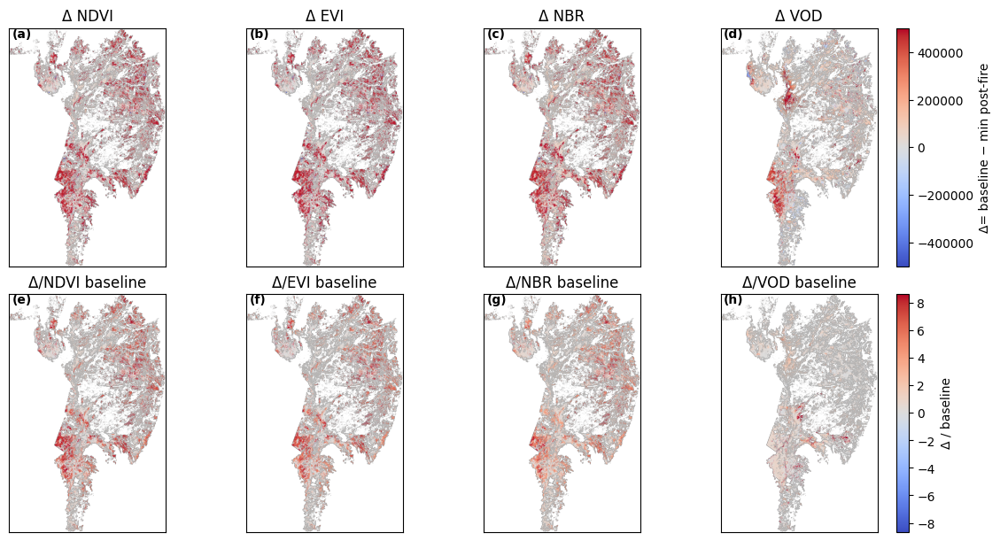

In [ ]:
# @title === Δ — Impacto absoluto (Δ = baseline - min pos-fire) e relativo (Δ/baseline) — SUBSTITUIÇÃO
# Mantém o mesmo layout/figura; apenas redefine D_all (impacto absoluto) e DR_all (impacto relativo)
# Definição: impacto_abs = baseline_pre − min(pós-fogo); impacto_rel = impacto_abs / (|baseline_pre|+EPS)
import numpy as np, yaml
import rasterio as rio
from rasterio.windows import Window
from rasterio.features import rasterize
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from pathlib import Path

# ---------- Parâmetros ----------
FRACTION_TH = 0.25
USE_MODE    = True
N_PRE       = 6
EARLY_WIN   = 2
MAX_POST    = 6
LATE_WIN    = 6
EPS         = 1e-6
METRICS     = ["NDVI","EVI","NBR","VOD"]

# ---------- Pastas ----------
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR/"outputs"
REC_DIR  = OUT_DIR/"recovery_nb3"
REC_DIR.mkdir(parents=True, exist_ok=True)

CONFIG   = yaml.safe_load(open(BASE_DIR/"config.yaml"))
BOUNDARY = Path(CONFIG["boundary_path"])

# Grade de referência (usa qualquer raster da recuperação só pelo shape/transform)
REF_FP = (REC_DIR/"recovery_time_VOD_bimestres.tif")
assert REF_FP.exists(), "Rode NB3 antes: não encontrei recovery_time_VOD_bimestres.tif"
with rio.open(REF_FP) as ref:
    H,W   = ref.height, ref.width
    TF,CRS= ref.transform, ref.crs
    PROFILE_F32 = ref.meta.copy()
PROFILE_F32.update(count=1, dtype="float32", nodata=np.nan,
                   compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

# Máscara Pantanal
gdf = gpd.read_file(BOUNDARY).to_crs(CRS)
MASK = rasterize([(g,1) for g in gdf.geometry if g is not None and not g.is_empty],
                 out_shape=(H,W), transform=TF, fill=0, dtype="uint8").astype(bool)

# ---------- Busca de arquivos ----------
OPT_SB_DIR = OUT_DIR/"opt_singleband_300m_cache"               # ndvi_YYYYMM_300m.tif etc.
VOD_DIR    = OUT_DIR/"vod_bi_300m_aligned_cache"               # vod_YYYYMM_300m_aligned.tif
MB_DIR     = OUT_DIR/"mb_bi_300m_cache"                        # frac/mode

def _opt_path(ym: str)->Path|None:
    # 1) single-band cache
    for met in ("ndvi","evi","nbr"):
        p = OPT_SB_DIR/f"{met}_{ym}_300m.tif"
        if p.exists(): return p  # voltaremos com banda por met abaixo
    # 2) stacks (se precisar)
    for root in [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]:
        for folder in ("Pantanal_TippingPoints_optical","Pantanal_TippingPoints_optical_merged"):
            a = root/folder/f"opt_{ym}.tif"
            b = root/folder/f"opt_{ym}_merged.tif"
            if a.exists(): return a
            if b.exists(): return b
    return None

BAND_IDX = {"NDVI":1,"EVI":2,"NBR":3}  # se cair no stack

def _read_opt(metric:str, ym:str, window=None):
    p = OPT_SB_DIR/f"{metric.lower()}_{ym}_300m.tif"
    if p.exists():
        with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")
    # fallback: stack
    src = _opt_path(ym); assert src, f"Óptico não encontrado para {ym}"
    with rio.open(src) as ds: return ds.read(BAND_IDX[metric], window=window).astype("float32")

def _read_vod(ym:str, window=None):
    p = VOD_DIR/f"vod_{ym}_300m_aligned.tif"
    assert p.exists(), f"VOD alinhado não encontrado: {p}"
    with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")

def _read_metric(metric, ym, window=None):
    return _read_vod(ym, window) if metric=="VOD" else _read_opt(metric, ym, window)

# Sequência bimestral
try:
    YMS
except NameError:
    def seq_bi(a,b):
        y,m=int(a[:4]),int(a[4:6]); ye,me=int(b[:4]),int(b[4:6])
        out=[]
        while (y<ye) or (y==ye and m<=me):
            out.append(f"{y}{m:02d}"); m+=2
            if m>12: y+=1; m-=12
        return out
    YMS = seq_bi("198709","202111")

def mb_frac(ym): return MB_DIR/f"mb_bi_{ym}_300m_frac.tif"
def mb_mode(ym): return MB_DIR/f"mb_bi_{ym}_300m_mode.tif"

# ---------- 1) Primeiro fogo ----------
first_fire = np.full((H,W), -1, dtype=np.int32)
for t, ym in enumerate(YMS):
    with rio.open(mb_frac(ym)) as df, rio.open(mb_mode(ym)) as dm:
        FR = df.read(1).astype("float32")
        MD = dm.read(1).astype("uint8")
    fire = (FR>=FRACTION_TH) & (MD==1 if USE_MODE else True)
    newly = (first_fire<0) & fire
    first_fire[newly] = t
first_fire[~MASK] = -1

def _calc_impact(metric:str):
    D  = np.full((H,W), np.nan, "f4")   # impacto absoluto
    DR = np.full((H,W), np.nan, "f4")   # impacto relativo (normalizado)
    TILE=1024
    for r0 in range(0,H,TILE):
        for c0 in range(0,W,TILE):
            h=min(TILE,H-r0); w=min(TILE,W-c0); win=rio.windows.Window(c0,r0,w,h)
            # pilha temporal da métrica
            X=[_read_metric(metric, ym, window=win) for ym in YMS]   # T×h×w
            X=np.stack(X,0).astype("f4")
            FF=first_fire[r0:r0+h, c0:c0+w]  # índices do primeiro fogo
            rr,cc=np.where(FF>=0)
            for r,c in zip(rr,cc):
                t0=int(FF[r,c])
                if t0 < N_PRE:
                    continue
                t1 = t0 + 1
                t2 = min(X.shape[0], t0 + 1 + MAX_POST)  # até MAX_POST bimestres após o fogo
                if t1 >= t2:
                    continue
                s = X[:,r,c]
                pre = s[t0-N_PRE:t0]           # janela pré-fogo
                post = s[t1:t2]                # janela pós-fogo
                if not np.isfinite(pre).any() or not np.isfinite(post).any():
                    continue
                baseline = float(np.nanmedian(pre))
                min_post = float(np.nanmin(post))
                if not (np.isfinite(baseline) and np.isfinite(min_post)):
                    continue
                impact_abs = baseline - min_post
                impact_rel = impact_abs / (abs(baseline) + EPS)
                D[r0+r, c0+c]  = impact_abs
                DR[r0+r, c0+c] = impact_rel
    return D, DR

D_all, DR_all = {}, {}
for MET in METRICS:
    print("→", MET)
    D_all[MET], DR_all[MET] = _calc_impact(MET)

# (o resto da célula permanece igual: salvamento + plot 2x4)
# ---------- 3) Salvar ----------
def _save_float32(fp, arr):
    with rio.open(fp, "w", **PROFILE_F32) as dst:
        dst.write(arr.astype("float32"), 1)
for MET in METRICS:
    _save_float32(REC_DIR / f"p2_delta_{MET}.tif",     np.where(MASK, D_all[MET],  np.nan))
    _save_float32(REC_DIR / f"p2_delta_rel_{MET}.tif", np.where(MASK, DR_all[MET], np.nan))
print("✔ TIFs salvos em", REC_DIR)

# ---------- 4) Plot 2×4 (robusto por métrica) ----------
def sym_limits(A, q=98, floor=1e-6):
    v=np.abs(A[np.isfinite(A)])
    if v.size==0: return (-1,1)
    vmax=max(floor, float(np.percentile(v,q)))
    return (-vmax, vmax)

fig, axes = plt.subplots(2,4, figsize=(12,6), constrained_layout=True)
# labels (lowercase, in parentheses)
letters = [f"({c})" for c in "abcdefgh"]

# linha Δ
for j,M in enumerate(METRICS):
    A=D_all[M]
    vmin,vmax=sym_limits(A)
    ax=axes[0,j]
    im=ax.imshow(A, norm=TwoSlopeNorm(vcenter=0,vmin=vmin,vmax=vmax), cmap="coolwarm")
    ax.set_title(f"Δ {M}"); ax.set_xticks([]); ax.set_yticks([])
    ax.text(0.02,0.96,letters[j], transform=ax.transAxes, fontweight="bold")
cb1=fig.colorbar(im, ax=axes[0,:].ravel().tolist(), fraction=0.046, pad=0.02)
cb1.set_label("Δ= baseline − min post-fire")

# linha Δ/baseline
for j,M in enumerate(METRICS):
    A=DR_all[M]
    vmin,vmax=sym_limits(A)
    ax=axes[1,j]
    im=ax.imshow(A, norm=TwoSlopeNorm(vcenter=0,vmin=vmin,vmax=vmax), cmap="coolwarm")
    ax.set_title(f"Δ/{M} baseline"); ax.set_xticks([]); ax.set_yticks([])
    ax.text(0.02,0.96,letters[4+j], transform=ax.transAxes, fontweight="bold")
cb2=fig.colorbar(im, ax=axes[1,:].ravel().tolist(), fraction=0.046, pad=0.02)
cb2.set_label("Δ / baseline")

fig.savefig("/content/p2_delta_2x4.png", dpi=300)
print("✔ Figura: /content/p2_delta_2x4.png")


# Verificação rápida
missing = []
created = []
for m in METRICS:
    for name in (f"p2_delta_{m}.tif", f"p2_delta_rel_{m}.tif"):
        fp = REC_DIR / name
        (created if fp.exists() else missing).append(str(fp))
print("Criados:", created if created else "— nenhum —")
print("Faltando:", missing if missing else "— nenhum —")


In [ ]:
# @title  P2-Δ — Impacto absoluto (Δ = late − early) e relativo (Δ/baseline) — SEM dividir por 10000
import numpy as np, yaml
import rasterio as rio
from rasterio.windows import Window
from rasterio.features import rasterize
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from pathlib import Path

# ---------- Parâmetros ----------
FRACTION_TH = 0.25
USE_MODE    = True
N_PRE       = 6
EARLY_WIN   = 2
LATE_WIN    = 6
EPS         = 1e-6
METRICS     = ["NDVI","EVI","NBR","VOD"]

# ---------- Pastas ----------
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR/"outputs"
REC_DIR  = OUT_DIR/"recovery_nb3"
REC_DIR.mkdir(parents=True, exist_ok=True)

CONFIG   = yaml.safe_load(open(BASE_DIR/"config.yaml"))
BOUNDARY = Path(CONFIG["boundary_path"])

# Grade de referência (usa qualquer raster da recuperação só pelo shape/transform)
REF_FP = (REC_DIR/"recovery_time_VOD_bimestres.tif")
assert REF_FP.exists(), "Rode NB3 antes: não encontrei recovery_time_VOD_bimestres.tif"
with rio.open(REF_FP) as ref:
    H,W   = ref.height, ref.width
    TF,CRS= ref.transform, ref.crs
    PROFILE_F32 = ref.meta.copy()
PROFILE_F32.update(count=1, dtype="float32", nodata=np.nan,
                   compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

# Máscara Pantanal
gdf = gpd.read_file(BOUNDARY).to_crs(CRS)
MASK = rasterize([(g,1) for g in gdf.geometry if g is not None and not g.is_empty],
                 out_shape=(H,W), transform=TF, fill=0, dtype="uint8").astype(bool)

# ---------- Busca de arquivos ----------
OPT_SB_DIR = OUT_DIR/"opt_singleband_300m_cache"               # ndvi_YYYYMM_300m.tif etc.
VOD_DIR    = OUT_DIR/"vod_bi_300m_aligned_cache"               # vod_YYYYMM_300m_aligned.tif
MB_DIR     = OUT_DIR/"mb_bi_300m_cache"                        # frac/mode

def _opt_path(ym: str)->Path|None:
    # 1) single-band cache
    for met in ("ndvi","evi","nbr"):
        p = OPT_SB_DIR/f"{met}_{ym}_300m.tif"
        if p.exists(): return p  # voltaremos com banda por met abaixo
    # 2) stacks (se precisar)
    for root in [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]:
        for folder in ("Pantanal_TippingPoints_optical","Pantanal_TippingPoints_optical_merged"):
            a = root/folder/f"opt_{ym}.tif"
            b = root/folder/f"opt_{ym}_merged.tif"
            if a.exists(): return a
            if b.exists(): return b
    return None

BAND_IDX = {"NDVI":1,"EVI":2,"NBR":3}  # se cair no stack

def _read_opt(metric:str, ym:str, window=None):
    p = OPT_SB_DIR/f"{metric.lower()}_{ym}_300m.tif"
    if p.exists():
        with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")
    # fallback: stack
    src = _opt_path(ym); assert src, f"Óptico não encontrado para {ym}"
    with rio.open(src) as ds: return ds.read(BAND_IDX[metric], window=window).astype("float32")

def _read_vod(ym:str, window=None):
    p = VOD_DIR/f"vod_{ym}_300m_aligned.tif"
    assert p.exists(), f"VOD alinhado não encontrado: {p}"
    with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")

def _read_metric(metric, ym, window=None):
    return _read_vod(ym, window) if metric=="VOD" else _read_opt(metric, ym, window)

# Sequência bimestral
try:
    YMS
except NameError:
    def seq_bi(a,b):
        y,m=int(a[:4]),int(a[4:6]); ye,me=int(b[:4]),int(b[4:6])
        out=[]
        while (y<ye) or (y==ye and m<=me):
            out.append(f"{y}{m:02d}"); m+=2
            if m>12: y+=1; m-=12
        return out
    YMS = seq_bi("198709","202111")

def mb_frac(ym): return MB_DIR/f"mb_bi_{ym}_300m_frac.tif"
def mb_mode(ym): return MB_DIR/f"mb_bi_{ym}_300m_mode.tif"

# ---------- 1) Primeiro fogo ----------
first_fire = np.full((H,W), -1, dtype=np.int32)
for t, ym in enumerate(YMS):
    with rio.open(mb_frac(ym)) as df, rio.open(mb_mode(ym)) as dm:
        FR = df.read(1).astype("float32")
        MD = dm.read(1).astype("uint8")
    fire = (FR>=FRACTION_TH) & (MD==1 if USE_MODE else True)
    newly = (first_fire<0) & fire
    first_fire[newly] = t
first_fire[~MASK] = -1

# ---------- 2) Δ e Δ/baseline por métrica (sem reescala) ----------
def _calc_D_DR(metric:str):
    D  = np.full((H,W), np.nan, "f4")
    DR = np.full((H,W), np.nan, "f4")
    TILE=1024
    for r0 in range(0,H,TILE):
        for c0 in range(0,W,TILE):
            h=min(TILE,H-r0); w=min(TILE,W-c0); win=Window(c0,r0,w,h)
            X=[_read_metric(metric, ym, window=win) for ym in YMS]   # T×h×w
            X=np.stack(X,0).astype("f4")
            FF=first_fire[r0:r0+h, c0:c0+w]
            rr,cc=np.where(FF>=0)
            for r,c in zip(rr,cc):
                t0=int(FF[r,c])
                if t0<N_PRE: continue
                t1=t0+1; tE=t1+EARLY_WIN; tL1=tE+1; tL2=tL1+LATE_WIN
                if tL2>X.shape[0]: continue
                s=X[:,r,c]
                pre =s[t0-N_PRE:t0]
                early=s[t1:tE]
                late =s[tL1:tL2]
                if not np.isfinite(pre).any(): continue
                base=float(np.nanmedian(pre))
                e=float(np.nanmean(early)); l=float(np.nanmean(late))
                if not (np.isfinite(base) and np.isfinite(e) and np.isfinite(l)): continue
                d=l-e
                D[r0+r,c0+c]=d
                DR[r0+r,c0+c]=d/(abs(base)+EPS)
    return D,DR

D_all, DR_all = {}, {}
for MET in METRICS:
    print("→", MET)
    D_all[MET], DR_all[MET] = _calc_D_DR(MET)

# ---------- 3) Salvar ----------
def _save_float32(fp, arr):
    with rio.open(fp, "w", **PROFILE_F32) as dst:
        dst.write(arr.astype("float32"), 1)
for MET in METRICS:
    _save_float32(REC_DIR / f"p2_delta_{MET}.tif",     np.where(MASK, D_all[MET],  np.nan))
    _save_float32(REC_DIR / f"p2_delta_rel_{MET}.tif", np.where(MASK, DR_all[MET], np.nan))
print("✔ TIFs salvos em", REC_DIR)

# ---------- 4) Plot 2×4 (robusto por métrica) ----------
def sym_limits(A, q=98, floor=1e-6):
    v=np.abs(A[np.isfinite(A)])
    if v.size==0: return (-1,1)
    vmax=max(floor, float(np.percentile(v,q)))
    return (-vmax, vmax)

fig, axes = plt.subplots(2,4, figsize=(12,6), constrained_layout=True)
# labels (lowercase, in parentheses)
letters = [f"({c})" for c in "abcdefgh"]

# linha Δ
for j,M in enumerate(METRICS):
    A=D_all[M]
    vmin,vmax=sym_limits(A)
    ax=axes[0,j]
    im=ax.imshow(A, norm=TwoSlopeNorm(vcenter=0,vmin=vmin,vmax=vmax), cmap="coolwarm")
    ax.set_title(f"Δ {M}"); ax.set_xticks([]); ax.set_yticks([])
    ax.text(0.02,0.96,letters[j], transform=ax.transAxes, fontweight="bold")
cb1=fig.colorbar(im, ax=axes[0,:].ravel().tolist(), fraction=0.046, pad=0.02)
cb1.set_label("Δ (late − early)")

# linha Δ/baseline
for j,M in enumerate(METRICS):
    A=DR_all[M]
    vmin,vmax=sym_limits(A)
    ax=axes[1,j]
    im=ax.imshow(A, norm=TwoSlopeNorm(vcenter=0,vmin=vmin,vmax=vmax), cmap="coolwarm")
    ax.set_title(f"Δ/{M} baseline"); ax.set_xticks([]); ax.set_yticks([])
    ax.text(0.02,0.96,letters[4+j], transform=ax.transAxes, fontweight="bold")
cb2=fig.colorbar(im, ax=axes[1,:].ravel().tolist(), fraction=0.046, pad=0.02)
cb2.set_label("Δ / baseline")

fig.savefig("/content/p2_delta_2x4.png", dpi=300)
print("✔ Figura: /content/p2_delta_2x4.png")


# Verificação rápida
missing = []
created = []
for m in METRICS:
    for name in (f"p2_delta_{m}.tif", f"p2_delta_rel_{m}.tif"):
        fp = REC_DIR / name
        (created if fp.exists() else missing).append(str(fp))
print("Criados:", created if created else "— nenhum —")
print("Faltando:", missing if missing else "— nenhum —")


In [ ]:
from pathlib import Path
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
REC_DIR  = BASE_DIR / "outputs" / "recovery_nb3"
for nm in ["NDVI","EVI","NBR","VOD"]:
    print((REC_DIR / f"p2_delta_{nm}.tif").exists(),
          (REC_DIR / f"p2_delta_rel_{nm}.tif").exists(), nm)


True True NDVI
True True EVI
True True NBR
True True VOD


Nenhuma cópia necessária. p2_* já existem (ou ainda faltam arquivos).
✔ Figura salva em: /content/p2_delta_hist_2x4.png
Status por métrica (p2_delta / p2_delta_rel):
  NDVI: Δ=OK | Δ/baseline=OK
  EVI: Δ=OK | Δ/baseline=OK
  NBR: Δ=OK | Δ/baseline=OK
  VOD: Δ=OK | Δ/baseline=OK


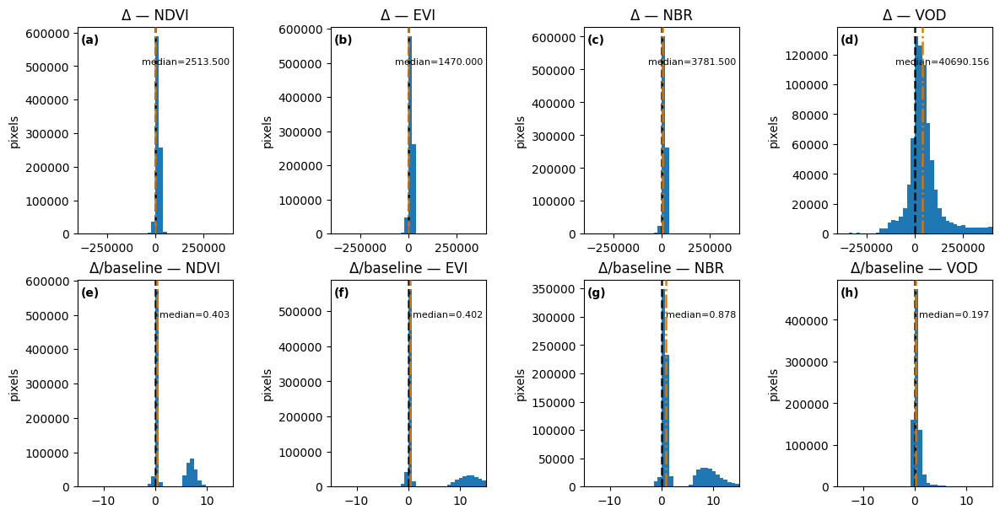

In [ ]:
# @title INVENTÁRIO + CORREÇÃO DE NOMES  →  HISTOGRAMAS (Δ e Δ/baseline) 2×4

import numpy as np, rasterio as rio, matplotlib.pyplot as plt
from pathlib import Path
import shutil, glob, warnings

BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
REC_DIR  = BASE_DIR / "outputs" / "recovery_nb3"
METRICS  = ["NDVI","EVI","NBR","VOD"]

def ensure_p2_files(metric: str):
    """Garante p2_delta_{M}.tif e p2_delta_rel_{M}.tif.
       Se não existirem, tenta copiar de impact_* equivalentes."""
    made = []
    p2D  = REC_DIR / f"p2_delta_{metric}.tif"
    p2DR = REC_DIR / f"p2_delta_rel_{metric}.tif"

    # se já existem, ok
    if not p2D.exists():
        # tente impact_delta_{M}.tif (ou variantes via glob)
        cand = REC_DIR / f"impact_delta_{metric}.tif"
        if not cand.exists():
            hits = glob.glob(str(REC_DIR / f"*impact*_{metric}.tif"))
            hits = [h for h in hits if "deltaRel" not in h and "rel" not in h.lower()]
            cand = Path(hits[0]) if hits else None
        if cand and cand.exists():
            shutil.copy2(cand, p2D)
            made.append(("Δ", cand.name, p2D.name))

    if not p2DR.exists():
        # tente impact_deltaRel_{M}.tif (ou variantes)
        cand = REC_DIR / f"impact_deltaRel_{metric}.tif"
        if not cand.exists():
            hits = glob.glob(str(REC_DIR / f"*impact*{metric}*rel*.tif"))
            cand = Path(hits[0]) if hits else None
        if cand and cand.exists():
            shutil.copy2(cand, p2DR)
            made.append(("Δ/baseline", cand.name, p2DR.name))
    return p2D.exists(), p2DR.exists(), made

created = []
for m in METRICS:
    okD, okDR, made = ensure_p2_files(m)
    created.extend([(m,)+t for t in made])
    if not okD or not okDR:
        warnings.warn(f"[{m}] ainda falta arquivo: "
                      f"{'Δ ' if not okD else ''}{'Δ/baseline' if not okDR else ''}")

if created:
    print("Arquivos criados (copiados de impact_* → p2_*):")
    for m, kind, src, dst in created:
        print(f"  {m}  {kind}: {src}  →  {dst}")
else:
    print("Nenhuma cópia necessária. p2_* já existem (ou ainda faltam arquivos).")

# ---------- Histogramas (usa apenas p2_* agora) ----------
def read_vals(fp: Path) -> np.ndarray:
    with rio.open(fp) as ds:
        a = ds.read(1).astype("float32")
        nod = ds.nodata
    if nod is not None:
        a = np.where(a == nod, np.nan, a)
    return a[np.isfinite(a)]

vals_D, vals_DR, used = {}, {}, []
for m in METRICS:
    fpD  = REC_DIR / f"p2_delta_{m}.tif"
    fpDR = REC_DIR / f"p2_delta_rel_{m}.tif"
    used.append((m, fpD.exists(), fpDR.exists()))
    vals_D[m]  = read_vals(fpD)  if fpD.exists()  else np.array([])
    vals_DR[m] = read_vals(fpDR) if fpDR.exists() else np.array([])

# limites robustos
all_abs_D  = np.concatenate([np.abs(vals_D[m])  for m in METRICS if vals_D[m].size]) if any(vals_D[m].size for m in METRICS) else np.array([])
all_abs_DR = np.concatenate([np.abs(vals_DR[m]) for m in METRICS if vals_DR[m].size]) if any(vals_DR[m].size for m in METRICS) else np.array([])

vmax_D  = float(np.percentile(all_abs_D,  98)) if all_abs_D.size  else 1.0
vmax_DR = float(np.percentile(all_abs_DR, 98)) if all_abs_DR.size else 1.0
vmax_D  = max(vmax_D,  1e-3)
vmax_DR = max(vmax_DR, 0.05)

D_range  = (-vmax_D,  vmax_D)
DR_range = (-vmax_DR, vmax_DR)
D_bins   = np.linspace(*D_range,  41)
DR_bins  = np.linspace(*DR_range, 41)

fig, axes = plt.subplots(2, 4, figsize=(12, 6), constrained_layout=True)
letters = [f"({c})" for c in "abcdefgh"]

# Δ
for j, m in enumerate(METRICS):
    ax, v = axes[0,j], vals_D[m]
    if v.size:
        ax.hist(v, bins=D_bins)
        med = float(np.median(v))
        ax.axvline(0, linestyle="--", linewidth=1.8, color="k", alpha=0.9, zorder=5)
        ax.axvline(med, linestyle="-.", linewidth=1.8, color="#d97706", alpha=0.95, zorder=6)
        ax.set_xlim(*D_range); ax.set_ylabel("pixels"); ax.set_title(f"Δ — {m}")
        ax.annotate(f"median={med:.3f}", xy=(0.98,0.85), xycoords="axes fraction", ha="right", va="top", fontsize=8)
    else:
        ax.text(0.5,0.5,"sem dados", ha="center", va="center")
    ax.text(0.02,0.92, letters[j], transform=ax.transAxes, fontweight="bold"); ax.set_xlabel("")

# Δ/baseline
for j, m in enumerate(METRICS):
    ax, v = axes[1,j], vals_DR[m]
    if v.size:
        med = float(np.median(v))
        ax.hist(v, bins=DR_bins)
        ax.axvline(0, linestyle="--", linewidth=1.8, color="k", alpha=0.9, zorder=5)
        ax.axvline(med, linestyle="-.", linewidth=1.8, color="#d97706", alpha=0.95, zorder=6)
        ax.set_xlim(*DR_range); ax.set_ylabel("pixels"); ax.set_title(f"Δ/baseline — {m}")
        ax.annotate(f"median={med:.3f}", xy=(0.98,0.85), xycoords="axes fraction", ha="right", va="top", fontsize=8)
    else:
        ax.text(0.5,0.5,"sem dados", ha="center", va="center")
    ax.text(0.02,0.92, letters[4+j], transform=ax.transAxes, fontweight="bold"); #ax.set_xlabel("valor")

out_png = "/content/p2_delta_hist_2x4.png"
fig.savefig(out_png, dpi=300)
print("✔ Figura salva em:", out_png)
print("Status por métrica (p2_delta / p2_delta_rel):")
for m, okD, okDR in used:
    print(f"  {m}: Δ={'OK' if okD else 'faltando'} | Δ/baseline={'OK' if okDR else 'faltando'}")




In [ ]:
# @title === CHECK — escala e bandas de um GeoTIFF (single-band OU stack óptico) ===
from pathlib import Path
import numpy as np, rasterio as rio

# a) aponte para UM raster single-band de NDVI/EVI/NBR (os que você gerou em opt_singleband_300m_cache)
fp = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/opt_singleband_300m_cache/ndvi_201909_300m.tif")

# OU (b) aponte para um stack 'opt_YYYYMM(.tif)' e defina a banda (1=NDVI,2=EVI,3=NBR)
# fp = Path("/content/drive/MyDrive/Pantanal_TippingPoints_optical/opt_201909.tif"); BAND = 1

with rio.open(fp) as ds:
    a = ds.read(1).astype("float32")
    nod = ds.nodata
    if nod is not None:
        a = np.where(a==nod, np.nan, a)

p = lambda q: float(np.nanpercentile(a, q))
stats = dict(n=int(np.isfinite(a).sum()), p1=p(1), p50=p(50), p95=p(95), min=float(np.nanmin(a)), max=float(np.nanmax(a)))
print("RAW:", stats)

# heurística de escala: se p95>1.5 → sugere dividir por 10k
scale = 1/10000.0 if abs(stats["p95"])>1.5 else 1.0
a_sc = a*scale
ps = lambda q: float(np.nanpercentile(a_sc, q))
stats_sc = dict(p1=ps(1), p50=ps(50), p95=ps(95), min=float(np.nanmin(a_sc)), max=float(np.nanmax(a_sc)))
print("SCALED(÷10000):", stats_sc)


RAW: {'n': 3946176, 'p1': 1897.0, 'p50': 4737.0, 'p95': 7077.0, 'min': -32768.0, 'max': 8877.0}
SCALED(÷10000): {'p1': 0.18969999253749847, 'p50': 0.47369998693466187, 'p95': 0.7076999545097351, 'min': -3.2767999172210693, 'max': 0.8876999616622925}


In [ ]:
# @title R3-5b — Leitor VOD bimestral (alinha/snap à grade e faz cache)
import numpy as np
import rasterio as rio
from rasterio.warp import reproject, Resampling
from pathlib import Path

# Pasta com VOD bimestral já pronto (vodca_YYYYMM.tif) — da sua R3-2b
VOD_BI_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/interim/vodca")
assert VOD_BI_DIR.exists(), f"Pasta VOD bimestral não encontrada: {VOD_BI_DIR}"

def _vod_bi_path(ym: str) -> Path | None:
    p = VOD_BI_DIR / f"vodca_{ym}.tif"
    return p if p.exists() else None

# Cache de VOD alinhado à grade 300 m
VOD_ALIGN_CACHE = OUT_DIR / "vod_bi_300m_aligned_cache"
VOD_ALIGN_CACHE.mkdir(parents=True, exist_ok=True)

def _aligned_vod_path(ym: str) -> Path:
    return VOD_ALIGN_CACHE / f"vod_{ym}_300m_aligned.tif"

def ensure_vod_bi_aligned(ym: str) -> Path | None:
    """Alinha vodca_YYYYMM.tif para a grade 300 m (REF_FP). Cacheia e retorna o caminho."""
    src_fp = _vod_bi_path(ym)
    if src_fp is None:
        return None
    out_fp = _aligned_vod_path(ym)
    if out_fp.exists():
        return out_fp

    with rio.open(src_fp) as src, rio.open(REF_FP) as ref:
        arr = src.read(1).astype("float32")
        nod = src.nodata

        # Tratamento robusto de NoData (0 ou valores muito negativos) → vira NaN
        if nod is not None:
            arr = np.where(arr == nod, np.nan, arr)
        else:
            if np.isfinite(arr).sum() and (arr == 0).mean() > 0.80:
                arr = np.where(arr == 0, np.nan, arr)
            if np.nanmin(arr) <= -1e4:
                arr = np.where(arr <= -1e4, np.nan, arr)

        # reprojetar/alinha para a grade 300 m
        dst = np.full((ref.height, ref.width), np.nan, dtype="float32")
        reproject(
            source=arr, destination=dst,
            src_transform=src.transform, src_crs=src.crs,
            dst_transform=ref.transform, dst_crs=ref.crs,
            src_nodata=np.nan, dst_nodata=np.nan,
            resampling=Resampling.bilinear
        )

        profile = ref.meta.copy()
        profile.update(count=1, dtype="float32", nodata=np.nan,
                       compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
        with rio.open(out_fp, "w", **profile) as dst_ds:
            dst_ds.write(dst, 1)
    return out_fp

def read_vod(ym: str, window=None):
    """Leitor prático do VOD bimestral já alinhado."""
    fp = ensure_vod_bi_aligned(ym)
    if fp is None or not fp.exists():
        return None
    with rio.open(fp) as ds:
        return ds.read(1, window=window).astype("float32")






In [ ]:
# @title === A) Cache single-band (NDVI/EVI/NBR) 300 m + listas temporais por métrica ===
import rasterio as rio, numpy as np
from pathlib import Path

# --- segurança: garantir REF_FP/transform disponíveis ---
try:
    _ = REF_FP
except NameError:
    # pegue um raster-âncora da sua grade 300 m (óptico do 1º YMS_MB disponível)
    assert len(YMS_MB) > 0, "YMS_MB vazio — rode R3-2b antes."
    _probe = None
    for ym in YMS_MB:
        for d in OPT_DIRS + MERGE_DIRS:
            p = d / f"opt_{ym}.tif"
            if p.exists(): _probe = p; break
            p = d / f"opt_{ym}_merged.tif"
            if p.exists(): _probe = p; break
        if _probe: break
    assert _probe is not None, "Não encontrei um raster óptico para inferir REF_FP."
    REF_FP = _probe
    with rio.open(REF_FP) as ref:
        REF_META = ref.meta.copy()
        tfm = ref.transform  # usado em tiles → salvar global
        CRS_EPSG = int(REF_META["crs"].to_epsg() or CRS_EPSG)

# --- helpers do stack óptico (se ainda não existirem no escopo) ---
def _opt_path(ym: str) -> str | None:
    for d in OPT_DIRS:
        fp = d / f"opt_{ym}.tif"
        if fp.exists(): return str(fp)
    for d in MERGE_DIRS:
        fp = d / f"opt_{ym}_merged.tif"
        if fp.exists(): return str(fp)
    return None

# --- cache single-band (alinhado à grade canônica) ---
OPT_SB_DIR = OUT_DIR / "opt_singleband_300m_cache"
OPT_SB_DIR.mkdir(parents=True, exist_ok=True)

# índices 1-based no arquivo óptico (ordem: NDVI,EVI,NBR,MNDWI,dNBR,RdNBR,OBS)
BAND_IDX = {"NDVI": 1, "EVI": 2, "NBR": 3}

def _sb_path(metric: str, ym: str) -> Path:
    return OPT_SB_DIR / f"{metric.lower()}_{ym}_300m.tif"

def ensure_opt_singleband(metric: str, ym: str) -> Path | None:
    out_fp = _sb_path(metric, ym)
    if out_fp.exists():
        return out_fp
    src_fp = _opt_path(ym)
    if not src_fp:
        return None
    with rio.open(src_fp) as src, rio.open(REF_FP) as ref:
        band = BAND_IDX[metric]  # 1-based
        arr  = src.read(band).astype("float32")
        profile = ref.meta.copy()
        profile.update(count=1, dtype="float32", nodata=np.nan,
                       compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
        with rio.open(out_fp, "w", **profile) as dst:
            dst.write(arr, 1)
    return out_fp

# --- disponibilidade de ópticos por bimestre ---
YMS_OPT = [ym for ym in YMS_MB if _opt_path(ym)]  # só os que têm arquivo óptico

print(f"Ópticos disponíveis (MB ∩ Óptico) : {len(YMS_OPT)}  (ex.: {YMS_OPT[:8]})")
print(f"VOD disponíveis (MB ∩ VOD)       : {len(YMS)}      (ex.: {YMS[:8]})")

# --- pré-gerar (preguiçosamente) cache SB para NDVI/EVI/NBR nos YMS_OPT ---
missing = {"NDVI":0,"EVI":0,"NBR":0}
for metric in ("NDVI","EVI","NBR"):
    for ym in YMS_OPT:
        p = ensure_opt_singleband(metric, ym)
        if p is None: missing[metric] += 1
print("✔ Cache single-band 300 m:")
print("  NDVI faltantes no óptico:", missing["NDVI"])
print("  EVI  faltantes no óptico:", missing["EVI"])
print("  NBR  faltantes no óptico:", missing["NBR"])

# --- listas temporais por métrica (usadas no processamento) ---
METRICS = ["VOD", "NDVI", "EVI", "NBR"]
YMS_BY_METRIC = {
    "VOD":  YMS[:],       # interseção MB ∩ VOD, criada em R3-2b
    "NDVI": YMS_OPT[:],
    "EVI":  YMS_OPT[:],
    "NBR":  YMS_OPT[:],
}
print({k: len(v) for k,v in YMS_BY_METRIC.items()})


Ópticos disponíveis (MB ∩ Óptico) : 206  (ex.: ['198709', '198711', '198801', '198803', '198805', '198807', '198809', '198811'])
VOD disponíveis (MB ∩ VOD)       : 206      (ex.: ['198709', '198711', '198801', '198803', '198805', '198807', '198809', '198811'])
✔ Cache single-band 300 m:
  NDVI faltantes no óptico: 0
  EVI  faltantes no óptico: 0
  NBR  faltantes no óptico: 0
{'VOD': 206, 'NDVI': 206, 'EVI': 206, 'NBR': 206}


In [ ]:
# @title === B) Recuperação por tiles para TODAS as métricas (retomável) ===
import numpy as np, json
import rasterio as rio
from rasterio.windows import Window
from tqdm.auto import tqdm
from pathlib import Path

# parâmetros de detecção/recuperação (você pode ajustar livremente)
FRACTION_TH = 0.25   # % mínimo queimado no 300 m para considerar evento
USE_MODE    = True   # exige majority (mode==1)
# baseline/target já definidos em R3-5: N_PRE, REC_RATIO, MAX_POST, recovery_time(...)

# utilidades de checkpoint
def tile_has_finite(fp) -> bool:
    p = Path(fp)
    if not p.exists(): return False
    try:
        with rio.open(p) as ds:
            a = ds.read(1)
        return np.isfinite(a).any()
    except Exception:
        return False

# leitor por métrica (usa single-band para ópticos; VOD usa ensure_vod_bi_aligned)
def _read_metric_window(metric: str, ym: str, window):
    if metric == "VOD":
        x = read_vod(ym, window=window)
        if x is None:
            # mantemos NaN se não houver VOD
            return np.full((int(window.height), int(window.width)), np.nan, dtype="float32")
        return x.astype("float32")
    # Ópticos: usar a função escalada
    if metric in ("NDVI","EVI","NBR"):
        return read_opt_metric_scaled(ym, metric, window=window)
    raise ValueError("Métrica inválida")

def load_series_for_window(metric: str, yms_list, window):
    series = []
    for ym in yms_list:
        p_frac, p_mode = build_mb300_from_30m(ym, force=False)
        with rio.open(p_frac) as df:
            frac = df.read(1, window=window).astype("float32")
        with rio.open(p_mode) as dm:
            mode = dm.read(1, window=window).astype("uint8")
        X = _read_metric_window(metric, ym, window)
        if X is None:
            X = np.full(frac.shape, np.nan, dtype="float32")
        series.append((ym, X, frac, mode))
    return series

# perfil base (grade canônica)
with rio.open(REF_FP) as ref:
    ref_profile = ref.meta.copy()
    ref_profile.update(count=1, dtype="float32", nodata=np.nan,
                       compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

# loop — TODAS as métricas
for METRIC in METRICS:
    yms_list = YMS_BY_METRIC[METRIC]
    print(f"\n=== MÉTRICA: {METRIC} | bimestres: {len(yms_list)} ===")
    done_keys = set(PROG.get("done", []))
    processed_now = 0

    for ix, iy, r0, c0, h, w in tqdm(tiles, desc=f"Tiles ({METRIC})"):
        key = f"{METRIC}:{tile_tag(ix,iy)}"
        ofp = out_fp(METRIC, ix, iy)

        # pular se já existe e contém valores finitos
        if key in done_keys and tile_has_finite(ofp):
            continue

        window = Window(col_off=c0, row_off=r0, width=w, height=h)
        series = load_series_for_window(METRIC, yms_list, window)

        out_arr = np.full((h, w), np.nan, dtype="float32")

        # busca primeiro evento e calcula tempo de recuperação
        T = len(series)
        for t in range(T):
            ym, X, FR, MD = series[t]
            fire = (FR >= FRACTION_TH)
            if USE_MODE:
                fire &= (MD == 1)
            if not fire.any():
                continue
            need = np.isnan(out_arr) & fire
            if not need.any():
                continue

            # empilha apenas a métrica no tempo
            stack = [series[k][1] for k in range(T)]
            for rr, cc in np.argwhere(need):
                s = np.array([stack[k][rr, cc] for k in range(T)], dtype="float32")
                rt = recovery_time(s, fire_idx=t)
                if np.isfinite(rt):
                    out_arr[rr, cc] = rt

        # salvar tile
        profile = ref_profile.copy()
        profile.update(height=h, width=w, transform=rio.windows.transform(window, tfm))
        with rio.open(ofp, "w", **profile) as dst:
            dst.write(out_arr, 1)

        mark_done(METRIC, ix, iy)
        processed_now += 1

    print(f"✔ {METRIC}: tiles processados nesta execução:", processed_now)



=== MÉTRICA: VOD | bimestres: 206 ===


Tiles (VOD):   0%|          | 0/6 [00:00<?, ?it/s]

✔ VOD: tiles processados nesta execução: 0

=== MÉTRICA: NDVI | bimestres: 206 ===


Tiles (NDVI):   0%|          | 0/6 [00:00<?, ?it/s]

✔ NDVI: tiles processados nesta execução: 0

=== MÉTRICA: EVI | bimestres: 206 ===


Tiles (EVI):   0%|          | 0/6 [00:00<?, ?it/s]

✔ EVI: tiles processados nesta execução: 0

=== MÉTRICA: NBR | bimestres: 206 ===


Tiles (NBR):   0%|          | 0/6 [00:00<?, ?it/s]

✔ NBR: tiles processados nesta execução: 0


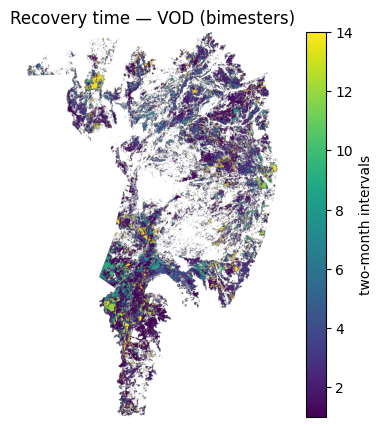

✔ [VOD] tiles usados: 6 | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/recovery_time_VOD_bimestres.tif
✔ [NDVI] tiles usados: 6 | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/recovery_time_NDVI_bimestres.tif
✔ [EVI] tiles usados: 6 | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/recovery_time_EVI_bimestres.tif
✔ [NBR] tiles usados: 6 | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/recovery_time_NBR_bimestres.tif
Arquivos finais: {'VOD': PosixPath('/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/recovery_time_VOD_bimestres.tif'), 'NDVI': PosixPath('/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/recovery_time_NDVI_bimestres.tif'), 'EVI': PosixPath('/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/recovery_time_EVI_bimestres.tif'), 'NBR': PosixPath('/content/drive/MyDrive/Pantana

In [ ]:
# @title C-MOSAIC-ROBUST — mosaico por reproject (imune a desalinhamento) + clip + stats
import numpy as np, pandas as pd, geopandas as gpd
from pathlib import Path
import rasterio as rio
from rasterio.warp import reproject, Resampling
from rasterio.features import rasterize
import matplotlib.pyplot as plt

BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR / "outputs"
REC_DIR  = OUT_DIR / "recovery_nb3"
CONFIG_FP= BASE_DIR / "config.yaml"

assert REC_DIR.exists(), f"Pasta não encontrada: {REC_DIR}"
assert CONFIG_FP.exists(), f"config.yaml não encontrado: {CONFIG_FP}"

import yaml
CONFIG   = yaml.safe_load(open(CONFIG_FP))
BOUNDARY = Path(CONFIG["boundary_path"])

# === 1) Grade de referência (usar o mesmo REF_FP que você indicou) ===
REF_FP = "/content/drive/My Drive/Pantanal_TippingPoints_optical/opt_198509.tif"
assert Path(REF_FP).exists(), f"REF_FP não encontrado: {REF_FP}"
with rio.open(REF_FP) as ref:
    H, W    = ref.height, ref.width
    REF_TFM = ref.transform
    REF_CRS = ref.crs
    REF_PROF = ref.meta.copy()
REF_PROF.update(count=1, dtype="float32", nodata=np.nan,
                compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

# === 2) Máscara do Pantanal na grade REF ===
gdf = gpd.read_file(BOUNDARY).to_crs(REF_CRS)
MASK = rasterize([(geom,1) for geom in gdf.geometry if geom and not geom.is_empty],
                 out_shape=(H,W), transform=REF_TFM, fill=0, dtype="uint8").astype(bool)

def robust_mosaic(metric: str, out_name: str, plot_quick=True):
    """
    Cola TODOS os tiles rec_{metric}_x###_y###.tif usando reproject → canvas REF.
    Imune a diferenças de shape/transform nos tiles.
    """
    # canvas destino
    mosaic = np.full((H, W), np.nan, dtype="float32")

    tiles = sorted(REC_DIR.glob(f"rec_{metric}_x???_y???.tif"))
    if not tiles:
        raise FileNotFoundError(f"Nenhum tile encontrado para {metric} em {REC_DIR}")

    used = 0
    for fp in tiles:
        with rio.open(fp) as src:
            src_arr = src.read(1).astype("float32")
            src_tfm = src.transform
            src_crs = src.crs
            src_nod = src.nodata

        # destino temporário (mesmo tamanho do canvas) para “colar” com máscara
        dst = np.full((H, W), np.nan, dtype="float32")

        reproject(
            source=src_arr,
            destination=dst,
            src_transform=src_tfm, src_crs=src_crs,
            dst_transform=REF_TFM,  dst_crs=REF_CRS,
            src_nodata=src_nod if src_nod is not None else np.nan,
            dst_nodata=np.nan,
            resampling=Resampling.nearest  # é categórico/tempos discretos; evitar média
        )

        # cola apenas onde o tile trouxe valor finito (preserva o que já está no mosaic)
        m = np.isfinite(dst)
        if m.any():
            mosaic[m] = dst[m]
            used += 1

    # clip Pantanal
    mosaic = np.where(MASK, mosaic, np.nan).astype("float32")

    # salvar GeoTIFF
    out_fp = REC_DIR / out_name
    with rio.open(out_fp, "w", **REF_PROF) as dst_ds:
        dst_ds.write(mosaic, 1)

    # stats e gráfico rápido
    vals = mosaic[np.isfinite(mosaic)]
    nval = int(vals.size)
    med  = float(np.median(vals)) if nval else np.nan

    # hist 1..18 bimestres
    bins = np.arange(0.5, 18.5+1e-9, 1.0)
    hist, _ = np.histogram(vals, bins=bins) if nval else (np.zeros(18, dtype=int), bins)
    pd.DataFrame({"bimestre": np.arange(1,19), "contagem": hist}).to_csv(
        REC_DIR / f"hist_recovery_time_{metric}_bimestres.csv", index=False
    )

    pd.DataFrame([{
        "metric": metric, "N_validos": nval, "mediana_bimestres": med,
        "p25": float(np.percentile(vals,25)) if nval else np.nan,
        "p75": float(np.percentile(vals,75)) if nval else np.nan,
        "mean": float(np.mean(vals)) if nval else np.nan,
        "std": float(np.std(vals)) if nval else np.nan,
        "min": float(np.min(vals)) if nval else np.nan,
        "max": float(np.max(vals)) if nval else np.nan,
    }]).to_csv(REC_DIR / f"summary_recovery_time_{metric}_bimestres.csv", index=False)

    if plot_quick and nval:
        vmax = float(np.nanpercentile(mosaic, 95))
        plt.figure(figsize=(7,5))
        im = plt.imshow(mosaic, vmin=1, vmax=max(3.0, vmax))
        plt.title(f"Recovery time — {metric} (bimesters)")
        plt.axis("off"); plt.colorbar(im, label="two-month intervals")
        plt.show()

    print(f"✔ [{metric}] tiles usados: {used} | salvo: {out_fp}")
    return out_fp

# Rode para todas as métricas que você já tem tiles:
outputs = {}
for m in ["VOD","NDVI","EVI","NBR"]:
    try:
        outputs[m] = robust_mosaic(m, f"recovery_time_{m}_bimestres.tif", plot_quick=(m=="VOD"))
    except Exception as e:
        print(f"(!) Falha em {m}: {e}")

print("Arquivos finais:", outputs)


✔ Gravados em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3
✔ Figura salva em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/fig_ttr_NDVI_1x3.png
NDVI — válidos=897573 | full=877482 (97.8%) | partial=11991 (1.3%) | no-rec=8100 (0.9%)


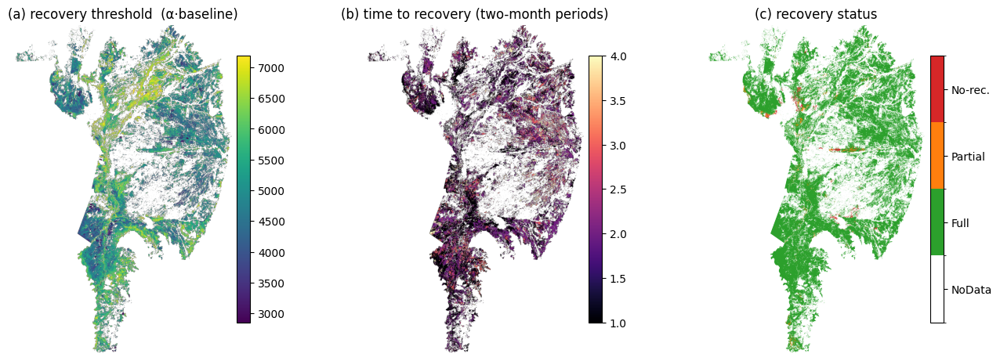

In [ ]:
# @title === P2 — TTR (α·baseline, TTR e status) — figura 1×3 por métrica NDVI===
# Requisitos prévios no ambiente: REF_FP, YMS, MB 300m (frac/mode), leitores de NDVI/EVI/NBR/VOD (sem ÷10000)
# Saídas: ttr_threshold_{MET}.tif | ttr_time_{MET}_bimestres.tif | ttr_status_{MET}.tif | fig_ttr_{MET}_1x3.png

import numpy as np, yaml, warnings
import rasterio as rio
from rasterio.windows import Window
from rasterio.features import rasterize
from rasterio.warp import Resampling, reproject
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm, ListedColormap, BoundaryNorm
from pathlib import Path

# -----------------------------
# Parâmetros
# -----------------------------
METRIC    = "NDVI"     # <- mude para "NDVI", "EVI", "NBR" ou "VOD"
ALPHA     = 0.90      # threshold = ALPHA * baseline
N_PRE     = 6         # baseline = mediana dos 6 bimestres anteriores
MAX_POST  = 18        # janela máx. de busca por recuperação (36 meses)
FRACTION_TH = 0.25
USE_MODE    = True
EPS       = 1e-6

# -----------------------------
# Pastas/arquivos
# -----------------------------
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR / "outputs"
REC_DIR  = OUT_DIR / "recovery_nb3"
MB_DIR   = OUT_DIR  / "mb_bi_300m_cache"
OPT_SB_DIR = OUT_DIR / "opt_singleband_300m_cache"        # ndvi/evi/nbr_{ym}_300m.tif
VOD_DIR    = OUT_DIR / "vod_bi_300m_aligned_cache"        # vod_{ym}_300m_aligned.tif
CONFIG   = yaml.safe_load(open(BASE_DIR/"config.yaml"))
BOUNDARY = Path(CONFIG["boundary_path"])
REC_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# Grade/Perfil + máscara Pantanal
# -----------------------------
# use um raster 300 m conhecido como referência
ref_guess = REC_DIR/"recovery_time_VOD_bimestres.tif"
assert ref_guess.exists(), "Rode os mosaicos de recuperação (NB3) ao menos para VOD."
REF_FP = ref_guess

with rio.open(REF_FP) as ref:
    H, W = ref.height, ref.width
    TF, CRS = ref.transform, ref.crs
    PROFILE_F32 = ref.meta.copy()
PROFILE_F32.update(count=1, dtype="float32", nodata=np.nan,
                   compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

gdf = gpd.read_file(BOUNDARY).to_crs(CRS)
MASK = rasterize([(g,1) for g in gdf.geometry if g is not None and not g.is_empty],
                 out_shape=(H,W), transform=TF, fill=0, dtype="uint8").astype(bool)

# -----------------------------
# Leitores por métrica (sem ÷10000)
# -----------------------------
BAND_IDX = {"NDVI":1, "EVI":2, "NBR":3}

def _opt_stack_path(ym: str) -> Path|None:
    for root in [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]:
        for folder in ("Pantanal_TippingPoints_optical","Pantanal_TippingPoints_optical_merged"):
            a = root/folder/f"opt_{ym}.tif"
            b = root/folder/f"opt_{ym}_merged.tif"
            if a.exists(): return a
            if b.exists(): return b
    return None

def _read_opt(metric: str, ym: str, window=None):
    sb = OPT_SB_DIR / f"{metric.lower()}_{ym}_300m.tif"
    if sb.exists():
        with rio.open(sb) as ds: return ds.read(1, window=window).astype("float32")
    src = _opt_stack_path(ym); assert src, f"Óptico não encontrado para {ym}"
    with rio.open(src) as ds: return ds.read(BAND_IDX[metric], window=window).astype("float32")

def _read_vod(ym: str, window=None):
    p = VOD_DIR / f"vod_{ym}_300m_aligned.tif"
    assert p.exists(), f"VOD alinhado não encontrado: {p}"
    with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")

def _read_metric(metric: str, ym: str, window=None):
    return _read_vod(ym, window) if metric=="VOD" else _read_opt(metric, ym, window)

def mb_frac(ym): return MB_DIR/f"mb_bi_{ym}_300m_frac.tif"
def mb_mode(ym): return MB_DIR/f"mb_bi_{ym}_300m_mode.tif"

# -----------------------------
# Sequência bimestral (fallback, caso YMS não exista no escopo)
# -----------------------------
try:
    YMS
except NameError:
    def seq_bi(a,b):
        y,m=int(a[:4]),int(a[4:6]); ye,me=int(b[:4]),int(b[4:6])
        out=[]
        while (y<ye) or (y==ye and m<=me):
            out.append(f"{y}{m:02d}"); m+=2
            if m>12: y+=1; m-=12
        return out
    YMS = seq_bi("198709","202111")

# -----------------------------
# 1) Primeiro fogo: índice t0 no vetor YMS
# -----------------------------
first_fire = np.full((H,W), -1, dtype=np.int32)
for t, ym in enumerate(YMS):
    with rio.open(mb_frac(ym)) as df, rio.open(mb_mode(ym)) as dm:
        FR = df.read(1).astype("float32")
        MD = dm.read(1).astype("uint8")
    fire = (FR >= FRACTION_TH)
    if USE_MODE: fire &= (MD == 1)
    newly = (first_fire < 0) & fire
    first_fire[newly] = t
first_fire[~MASK] = -1

# -----------------------------
# 2) baseline, threshold, TTR e status
#    status codes: 1=full, 2=partial, 3=no-recovery, 0=NoData/fora
# -----------------------------
baseline = np.full((H,W), np.nan, "f4")
thr      = np.full((H,W), np.nan, "f4")
ttr_map  = np.full((H,W), np.nan, "f4")
status   = np.zeros((H,W), dtype="uint8")

TILE = 1024
for r0 in range(0, H, TILE):
    for c0 in range(0, W, TILE):
        h = min(TILE, H-r0); w = min(TILE, W-c0)
        win = Window(col_off=c0, row_off=r0, width=w, height=h)

        # Carrega séries da métrica na janela
        X = np.stack([_read_metric(METRIC, ym, window=win) for ym in YMS], axis=0)  # T×h×w
        FF = first_fire[r0:r0+h, c0:c0+w]

        rr, cc = np.where(FF >= 0)
        for r, c in zip(rr, cc):
            t0 = int(FF[r,c])
            if t0 < N_PRE:  # sem baseline mínimo
                continue
            s = X[:, r, c].astype("float32")

            pre = s[t0-N_PRE : t0]
            if not np.isfinite(pre).any():
                continue
            base = float(np.nanmedian(pre))
            if not np.isfinite(base) or abs(base) <= EPS:
                continue

            target = ALPHA * base
            baseline[r0+r, c0+c] = base
            thr[r0+r, c0+c]      = target

            end  = min(len(s), t0+1+MAX_POST)
            post = s[t0+1 : end]

            # TTR = 1ª posição do pós-fogo que atinge o limiar
            ttr = np.nan
            hit = False
            for i, val in enumerate(post, start=1):
                if np.isfinite(val) and (val >= target):
                    ttr = float(i); hit = True; break
            if hit:
                ttr_map[r0+r, c0+c] = ttr
                status[r0+r, c0+c]  = 1  # full
            else:
                # Se tem AO MENOS UM valor pós-fogo finito, mas nunca atingiu → partial
                has_post = np.isfinite(post).any()
                status[r0+r, c0+c] = 2 if has_post else 3  # partial ou no-recovery

# Fora do Pantanal -> 0
status[~MASK] = 0

# -----------------------------
# 3) Salvar GeoTIFFs
# -----------------------------
def _save_f32(fp, arr):
    with rio.open(REF_FP, "w", **PROFILE_F32) as dst: dst.write(arr.astype("float32"), 1)

_save_f32(REC_DIR/f"ttr_threshold_{METRIC}.tif", thr)
_save_f32(REC_DIR/f"ttr_time_{METRIC}_bimestres.tif", ttr_map)

# status com paleta categórica
with rio.open(REF_FP) as ref:
    prof = ref.meta.copy()
prof.update(count=1, dtype="uint8", nodata=0, compress="lzw", tiled=True,
            blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
with rio.open(REC_DIR/f"ttr_status_{METRIC}.tif", "w", **prof) as dst:
    dst.write(status, 1)

print("✔ Gravados em:", REC_DIR)

# -----------------------------
# 4) Figura 1×3 (threshold • TTR • status)
# -----------------------------
fig, axs = plt.subplots(1, 3, figsize=(13.5, 4.5), constrained_layout=True)

# (a) threshold (α·baseline)
A = thr
if np.isfinite(A).any():
    vmin, vmax = np.nanpercentile(A, [2, 98])
    im = axs[0].imshow(A, vmin=vmin, vmax=vmax, cmap="viridis")
else:
    im = axs[0].imshow(A, cmap="viridis")
axs[0].set_title("(a) recovery threshold  (α·baseline)")
axs[0].axis("off")
cb0 = fig.colorbar(im, ax=axs[0], fraction=0.046, pad=0.02)

# (b) TTR (bimestres)
B = ttr_map
if np.isfinite(B).any():
    vmax = np.nanpercentile(B, 95)
    vmax = max(3.0, float(vmax))
    im = axs[1].imshow(B, vmin=1.0, vmax=vmax, cmap="magma")
else:
    im = axs[1].imshow(B, cmap="magma")
axs[1].set_title("(b) time to recovery (two-month periods)")
axs[1].axis("off")
cb1 = fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.02)

# (c) status (categórico) — CLIP PANTANAL
C = status.copy()                 # 0=NoData/fora, 1=full, 2=partial, 3=no-recovery
Cm = np.ma.masked_where(~MASK, C) # mascara fora do Pantanal

cmap = ListedColormap(["#ffffff", "#2ca02c", "#ff7f0e", "#d62728"])  # branco, verde, laranja, vermelho
cmap.set_bad((1,1,1,0))  # transparente fora
norm = BoundaryNorm([-0.5,0.5,1.5,2.5,3.5], cmap.N)

im = axs[2].imshow(Cm, cmap=cmap, norm=norm)
axs[2].set_title("(c) recovery status")
axs[2].axis("off")
cb2 = fig.colorbar(im, ax=axs[2], fraction=0.046, pad=0.02, ticks=[0,1,2,3])
cb2.ax.set_yticklabels(["NoData", "Full", "Partial", "No-rec."])


out_png = REC_DIR / f"fig_ttr_{METRIC}_1x3.png"
fig.savefig(out_png, dpi=300)
print("✔ Figura salva em:", out_png)

# Pequenas estatísticas para o texto
n_full    = int(np.sum(status==1))
n_partial = int(np.sum(status==2))
n_norec   = int(np.sum(status==3))
n_valid   = n_full + n_partial + n_norec
print(f"{METRIC} — válidos={n_valid} | full={n_full} ({100*n_full/max(1,n_valid):.1f}%) | "
      f"partial={n_partial} ({100*n_partial/max(1,n_valid):.1f}%) | "
      f"no-rec={n_norec} ({100*n_norec/max(1,n_valid):.1f}%)")


✔ Gravados em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3
✔ Figura salva em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/fig_ttr_EVI_1x3.png
EVI — válidos=897573 | full=873409 (97.3%) | partial=16064 (1.8%) | no-rec=8100 (0.9%)


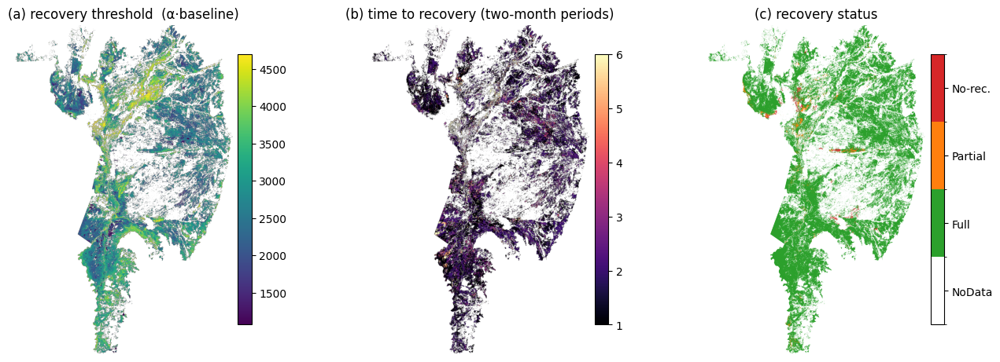

In [ ]:
# @title === P2 — TTR (α·baseline, TTR e status) — figura 1×3 por métrica EVI ===
# Requisitos prévios no ambiente: REF_FP, YMS, MB 300m (frac/mode), leitores de NDVI/EVI/NBR/VOD (sem ÷10000)
# Saídas: ttr_threshold_{MET}.tif | ttr_time_{MET}_bimestres.tif | ttr_status_{MET}.tif | fig_ttr_{MET}_1x3.png

import numpy as np, yaml, warnings
import rasterio as rio
from rasterio.windows import Window
from rasterio.features import rasterize
from rasterio.warp import Resampling, reproject
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm, ListedColormap, BoundaryNorm
from pathlib import Path

# -----------------------------
# Parâmetros
# -----------------------------
METRIC    = "EVI"     # <- mude para "NDVI", "EVI", "NBR" ou "VOD"
ALPHA     = 0.90      # threshold = ALPHA * baseline
N_PRE     = 6         # baseline = mediana dos 6 bimestres anteriores
MAX_POST  = 18        # janela máx. de busca por recuperação (36 meses)
FRACTION_TH = 0.25
USE_MODE    = True
EPS       = 1e-6

# -----------------------------
# Pastas/arquivos
# -----------------------------
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR / "outputs"
REC_DIR  = OUT_DIR / "recovery_nb3"
MB_DIR   = OUT_DIR  / "mb_bi_300m_cache"
OPT_SB_DIR = OUT_DIR / "opt_singleband_300m_cache"        # ndvi/evi/nbr_{ym}_300m.tif
VOD_DIR    = OUT_DIR / "vod_bi_300m_aligned_cache"        # vod_{ym}_300m_aligned.tif
CONFIG   = yaml.safe_load(open(BASE_DIR/"config.yaml"))
BOUNDARY = Path(CONFIG["boundary_path"])
REC_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# Grade/Perfil + máscara Pantanal
# -----------------------------
# use um raster 300 m conhecido como referência
ref_guess = REC_DIR/"recovery_time_VOD_bimestres.tif"
assert ref_guess.exists(), "Rode os mosaicos de recuperação (NB3) ao menos para VOD."
REF_FP = ref_guess

with rio.open(REF_FP) as ref:
    H, W = ref.height, ref.width
    TF, CRS = ref.transform, ref.crs
    PROFILE_F32 = ref.meta.copy()
PROFILE_F32.update(count=1, dtype="float32", nodata=np.nan,
                   compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

gdf = gpd.read_file(BOUNDARY).to_crs(CRS)
MASK = rasterize([(g,1) for g in gdf.geometry if g is not None and not g.is_empty],
                 out_shape=(H,W), transform=TF, fill=0, dtype="uint8").astype(bool)

# -----------------------------
# Leitores por métrica (sem ÷10000)
# -----------------------------
BAND_IDX = {"NDVI":1, "EVI":2, "NBR":3}

def _opt_stack_path(ym: str) -> Path|None:
    for root in [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]:
        for folder in ("Pantanal_TippingPoints_optical","Pantanal_TippingPoints_optical_merged"):
            a = root/folder/f"opt_{ym}.tif"
            b = root/folder/f"opt_{ym}_merged.tif"
            if a.exists(): return a
            if b.exists(): return b
    return None

def _read_opt(metric: str, ym: str, window=None):
    sb = OPT_SB_DIR / f"{metric.lower()}_{ym}_300m.tif"
    if sb.exists():
        with rio.open(sb) as ds: return ds.read(1, window=window).astype("float32")
    src = _opt_stack_path(ym); assert src, f"Óptico não encontrado para {ym}"
    with rio.open(src) as ds: return ds.read(BAND_IDX[metric], window=window).astype("float32")

def _read_vod(ym: str, window=None):
    p = VOD_DIR / f"vod_{ym}_300m_aligned.tif"
    assert p.exists(), f"VOD alinhado não encontrado: {p}"
    with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")

def _read_metric(metric: str, ym: str, window=None):
    return _read_vod(ym, window) if metric=="VOD" else _read_opt(metric, ym, window)

def mb_frac(ym): return MB_DIR/f"mb_bi_{ym}_300m_frac.tif"
def mb_mode(ym): return MB_DIR/f"mb_bi_{ym}_300m_mode.tif"

# -----------------------------
# Sequência bimestral (fallback, caso YMS não exista no escopo)
# -----------------------------
try:
    YMS
except NameError:
    def seq_bi(a,b):
        y,m=int(a[:4]),int(a[4:6]); ye,me=int(b[:4]),int(b[4:6])
        out=[]
        while (y<ye) or (y==ye and m<=me):
            out.append(f"{y}{m:02d}"); m+=2
            if m>12: y+=1; m-=12
        return out
    YMS = seq_bi("198709","202111")

# -----------------------------
# 1) Primeiro fogo: índice t0 no vetor YMS
# -----------------------------
first_fire = np.full((H,W), -1, dtype=np.int32)
for t, ym in enumerate(YMS):
    with rio.open(mb_frac(ym)) as df, rio.open(mb_mode(ym)) as dm:
        FR = df.read(1).astype("float32")
        MD = dm.read(1).astype("uint8")
    fire = (FR >= FRACTION_TH)
    if USE_MODE: fire &= (MD == 1)
    newly = (first_fire < 0) & fire
    first_fire[newly] = t
first_fire[~MASK] = -1

# -----------------------------
# 2) baseline, threshold, TTR e status
#    status codes: 1=full, 2=partial, 3=no-recovery, 0=NoData/fora
# -----------------------------
baseline = np.full((H,W), np.nan, "f4")
thr      = np.full((H,W), np.nan, "f4")
ttr_map  = np.full((H,W), np.nan, "f4")
status   = np.zeros((H,W), dtype="uint8")

TILE = 1024
for r0 in range(0, H, TILE):
    for c0 in range(0, W, TILE):
        h = min(TILE, H-r0); w = min(TILE, W-c0)
        win = Window(col_off=c0, row_off=r0, width=w, height=h)

        # Carrega séries da métrica na janela
        X = np.stack([_read_metric(METRIC, ym, window=win) for ym in YMS], axis=0)  # T×h×w
        FF = first_fire[r0:r0+h, c0:c0+w]

        rr, cc = np.where(FF >= 0)
        for r, c in zip(rr, cc):
            t0 = int(FF[r,c])
            if t0 < N_PRE:  # sem baseline mínimo
                continue
            s = X[:, r, c].astype("float32")

            pre = s[t0-N_PRE : t0]
            if not np.isfinite(pre).any():
                continue
            base = float(np.nanmedian(pre))
            if not np.isfinite(base) or abs(base) <= EPS:
                continue

            target = ALPHA * base
            baseline[r0+r, c0+c] = base
            thr[r0+r, c0+c]      = target

            end  = min(len(s), t0+1+MAX_POST)
            post = s[t0+1 : end]

            # TTR = 1ª posição do pós-fogo que atinge o limiar
            ttr = np.nan
            hit = False
            for i, val in enumerate(post, start=1):
                if np.isfinite(val) and (val >= target):
                    ttr = float(i); hit = True; break
            if hit:
                ttr_map[r0+r, c0+c] = ttr
                status[r0+r, c0+c]  = 1  # full
            else:
                # Se tem AO MENOS UM valor pós-fogo finito, mas nunca atingiu → partial
                has_post = np.isfinite(post).any()
                status[r0+r, c0+c] = 2 if has_post else 3  # partial ou no-recovery

# Fora do Pantanal -> 0
status[~MASK] = 0

# -----------------------------
# 3) Salvar GeoTIFFs
# -----------------------------
def _save_f32(fp, arr):
    with rio.open(REF_FP, "w", **PROFILE_F32) as dst: dst.write(arr.astype("float32"), 1)

_save_f32(REC_DIR/f"ttr_threshold_{METRIC}.tif", thr)
_save_f32(REC_DIR/f"ttr_time_{METRIC}_bimestres.tif", ttr_map)

# status com paleta categórica
with rio.open(REF_FP) as ref:
    prof = ref.meta.copy()
prof.update(count=1, dtype="uint8", nodata=0, compress="lzw", tiled=True,
            blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
with rio.open(REC_DIR/f"ttr_status_{METRIC}.tif", "w", **prof) as dst:
    dst.write(status, 1)

print("✔ Gravados em:", REC_DIR)

# -----------------------------
# 4) Figura 1×3 (threshold • TTR • status)
# -----------------------------
fig, axs = plt.subplots(1, 3, figsize=(13.5, 4.5), constrained_layout=True)

# (a) threshold (α·baseline)
A = thr
if np.isfinite(A).any():
    vmin, vmax = np.nanpercentile(A, [2, 98])
    im = axs[0].imshow(A, vmin=vmin, vmax=vmax, cmap="viridis")
else:
    im = axs[0].imshow(A, cmap="viridis")
axs[0].set_title("(a) recovery threshold  (α·baseline)")
axs[0].axis("off")
cb0 = fig.colorbar(im, ax=axs[0], fraction=0.046, pad=0.02)

# (b) TTR (bimestres)
B = ttr_map
if np.isfinite(B).any():
    vmax = np.nanpercentile(B, 95)
    vmax = max(3.0, float(vmax))
    im = axs[1].imshow(B, vmin=1.0, vmax=vmax, cmap="magma")
else:
    im = axs[1].imshow(B, cmap="magma")
axs[1].set_title("(b) time to recovery (two-month periods)")
axs[1].axis("off")
cb1 = fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.02)

# (c) status (categórico) — CLIP PANTANAL
C = status.copy()                 # 0=NoData/fora, 1=full, 2=partial, 3=no-recovery
Cm = np.ma.masked_where(~MASK, C) # mascara fora do Pantanal

cmap = ListedColormap(["#ffffff", "#2ca02c", "#ff7f0e", "#d62728"])  # branco, verde, laranja, vermelho
cmap.set_bad((1,1,1,0))  # transparente fora
norm = BoundaryNorm([-0.5,0.5,1.5,2.5,3.5], cmap.N)

im = axs[2].imshow(Cm, cmap=cmap, norm=norm)
axs[2].set_title("(c) recovery status")
axs[2].axis("off")
cb2 = fig.colorbar(im, ax=axs[2], fraction=0.046, pad=0.02, ticks=[0,1,2,3])
cb2.ax.set_yticklabels(["NoData", "Full", "Partial", "No-rec."])


out_png = REC_DIR / f"fig_ttr_{METRIC}_1x3.png"
fig.savefig(out_png, dpi=300)
print("✔ Figura salva em:", out_png)

# Pequenas estatísticas para o texto
n_full    = int(np.sum(status==1))
n_partial = int(np.sum(status==2))
n_norec   = int(np.sum(status==3))
n_valid   = n_full + n_partial + n_norec
print(f"{METRIC} — válidos={n_valid} | full={n_full} ({100*n_full/max(1,n_valid):.1f}%) | "
      f"partial={n_partial} ({100*n_partial/max(1,n_valid):.1f}%) | "
      f"no-rec={n_norec} ({100*n_norec/max(1,n_valid):.1f}%)")


✔ Gravados em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3
✔ Figura salva em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/fig_ttr_NBR_1x3.png
NBR — válidos=897570 | full=859840 (95.8%) | partial=29630 (3.3%) | no-rec=8100 (0.9%)


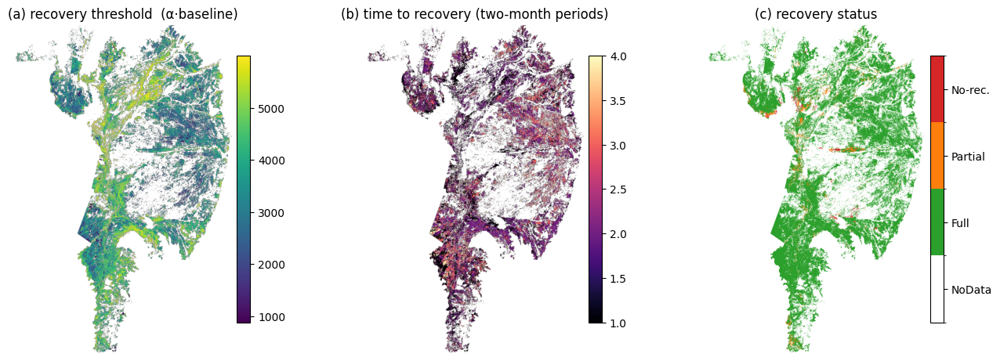

In [ ]:
# @title === P2 — TTR (α·baseline, TTR e status) — figura 1×3 por métrica NBR ===
# Requisitos prévios no ambiente: REF_FP, YMS, MB 300m (frac/mode), leitores de NDVI/EVI/NBR/VOD (sem ÷10000)
# Saídas: ttr_threshold_{MET}.tif | ttr_time_{MET}_bimestres.tif | ttr_status_{MET}.tif | fig_ttr_{MET}_1x3.png

import numpy as np, yaml, warnings
import rasterio as rio
from rasterio.windows import Window
from rasterio.features import rasterize
from rasterio.warp import Resampling, reproject
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm, ListedColormap, BoundaryNorm
from pathlib import Path

# -----------------------------
# Parâmetros
# -----------------------------
METRIC    = "NBR"     # <- mude para "NDVI", "EVI", "NBR" ou "VOD"
ALPHA     = 0.90      # threshold = ALPHA * baseline
N_PRE     = 6         # baseline = mediana dos 6 bimestres anteriores
MAX_POST  = 18        # janela máx. de busca por recuperação (36 meses)
FRACTION_TH = 0.25
USE_MODE    = True
EPS       = 1e-6

# -----------------------------
# Pastas/arquivos
# -----------------------------
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR / "outputs"
REC_DIR  = OUT_DIR / "recovery_nb3"
MB_DIR   = OUT_DIR  / "mb_bi_300m_cache"
OPT_SB_DIR = OUT_DIR / "opt_singleband_300m_cache"        # ndvi/evi/nbr_{ym}_300m.tif
VOD_DIR    = OUT_DIR / "vod_bi_300m_aligned_cache"        # vod_{ym}_300m_aligned.tif
CONFIG   = yaml.safe_load(open(BASE_DIR/"config.yaml"))
BOUNDARY = Path(CONFIG["boundary_path"])
REC_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# Grade/Perfil + máscara Pantanal
# -----------------------------
# use um raster 300 m conhecido como referência
ref_guess = REC_DIR/"recovery_time_VOD_bimestres.tif"
assert ref_guess.exists(), "Rode os mosaicos de recuperação (NB3) ao menos para VOD."
REF_FP = ref_guess

with rio.open(REF_FP) as ref:
    H, W = ref.height, ref.width
    TF, CRS = ref.transform, ref.crs
    PROFILE_F32 = ref.meta.copy()
PROFILE_F32.update(count=1, dtype="float32", nodata=np.nan,
                   compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

gdf = gpd.read_file(BOUNDARY).to_crs(CRS)
MASK = rasterize([(g,1) for g in gdf.geometry if g is not None and not g.is_empty],
                 out_shape=(H,W), transform=TF, fill=0, dtype="uint8").astype(bool)

# -----------------------------
# Leitores por métrica (sem ÷10000)
# -----------------------------
BAND_IDX = {"NDVI":1, "EVI":2, "NBR":3}

def _opt_stack_path(ym: str) -> Path|None:
    for root in [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]:
        for folder in ("Pantanal_TippingPoints_optical","Pantanal_TippingPoints_optical_merged"):
            a = root/folder/f"opt_{ym}.tif"
            b = root/folder/f"opt_{ym}_merged.tif"
            if a.exists(): return a
            if b.exists(): return b
    return None

def _read_opt(metric: str, ym: str, window=None):
    sb = OPT_SB_DIR / f"{metric.lower()}_{ym}_300m.tif"
    if sb.exists():
        with rio.open(sb) as ds: return ds.read(1, window=window).astype("float32")
    src = _opt_stack_path(ym); assert src, f"Óptico não encontrado para {ym}"
    with rio.open(src) as ds: return ds.read(BAND_IDX[metric], window=window).astype("float32")

def _read_vod(ym: str, window=None):
    p = VOD_DIR / f"vod_{ym}_300m_aligned.tif"
    assert p.exists(), f"VOD alinhado não encontrado: {p}"
    with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")

def _read_metric(metric: str, ym: str, window=None):
    return _read_vod(ym, window) if metric=="VOD" else _read_opt(metric, ym, window)

def mb_frac(ym): return MB_DIR/f"mb_bi_{ym}_300m_frac.tif"
def mb_mode(ym): return MB_DIR/f"mb_bi_{ym}_300m_mode.tif"

# -----------------------------
# Sequência bimestral (fallback, caso YMS não exista no escopo)
# -----------------------------
try:
    YMS
except NameError:
    def seq_bi(a,b):
        y,m=int(a[:4]),int(a[4:6]); ye,me=int(b[:4]),int(b[4:6])
        out=[]
        while (y<ye) or (y==ye and m<=me):
            out.append(f"{y}{m:02d}"); m+=2
            if m>12: y+=1; m-=12
        return out
    YMS = seq_bi("198709","202111")

# -----------------------------
# 1) Primeiro fogo: índice t0 no vetor YMS
# -----------------------------
first_fire = np.full((H,W), -1, dtype=np.int32)
for t, ym in enumerate(YMS):
    with rio.open(mb_frac(ym)) as df, rio.open(mb_mode(ym)) as dm:
        FR = df.read(1).astype("float32")
        MD = dm.read(1).astype("uint8")
    fire = (FR >= FRACTION_TH)
    if USE_MODE: fire &= (MD == 1)
    newly = (first_fire < 0) & fire
    first_fire[newly] = t
first_fire[~MASK] = -1

# -----------------------------
# 2) baseline, threshold, TTR e status
#    status codes: 1=full, 2=partial, 3=no-recovery, 0=NoData/fora
# -----------------------------
baseline = np.full((H,W), np.nan, "f4")
thr      = np.full((H,W), np.nan, "f4")
ttr_map  = np.full((H,W), np.nan, "f4")
status   = np.zeros((H,W), dtype="uint8")

TILE = 1024
for r0 in range(0, H, TILE):
    for c0 in range(0, W, TILE):
        h = min(TILE, H-r0); w = min(TILE, W-c0)
        win = Window(col_off=c0, row_off=r0, width=w, height=h)

        # Carrega séries da métrica na janela
        X = np.stack([_read_metric(METRIC, ym, window=win) for ym in YMS], axis=0)  # T×h×w
        FF = first_fire[r0:r0+h, c0:c0+w]

        rr, cc = np.where(FF >= 0)
        for r, c in zip(rr, cc):
            t0 = int(FF[r,c])
            if t0 < N_PRE:  # sem baseline mínimo
                continue
            s = X[:, r, c].astype("float32")

            pre = s[t0-N_PRE : t0]
            if not np.isfinite(pre).any():
                continue
            base = float(np.nanmedian(pre))
            if not np.isfinite(base) or abs(base) <= EPS:
                continue

            target = ALPHA * base
            baseline[r0+r, c0+c] = base
            thr[r0+r, c0+c]      = target

            end  = min(len(s), t0+1+MAX_POST)
            post = s[t0+1 : end]

            # TTR = 1ª posição do pós-fogo que atinge o limiar
            ttr = np.nan
            hit = False
            for i, val in enumerate(post, start=1):
                if np.isfinite(val) and (val >= target):
                    ttr = float(i); hit = True; break
            if hit:
                ttr_map[r0+r, c0+c] = ttr
                status[r0+r, c0+c]  = 1  # full
            else:
                # Se tem AO MENOS UM valor pós-fogo finito, mas nunca atingiu → partial
                has_post = np.isfinite(post).any()
                status[r0+r, c0+c] = 2 if has_post else 3  # partial ou no-recovery

# Fora do Pantanal -> 0
status[~MASK] = 0

# -----------------------------
# 3) Salvar GeoTIFFs
# -----------------------------
def _save_f32(fp, arr):
    with rio.open(REF_FP, "w", **PROFILE_F32) as dst: dst.write(arr.astype("float32"), 1)

_save_f32(REC_DIR/f"ttr_threshold_{METRIC}.tif", thr)
_save_f32(REC_DIR/f"ttr_time_{METRIC}_bimestres.tif", ttr_map)

# status com paleta categórica
with rio.open(REF_FP) as ref:
    prof = ref.meta.copy()
prof.update(count=1, dtype="uint8", nodata=0, compress="lzw", tiled=True,
            blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
with rio.open(REC_DIR/f"ttr_status_{METRIC}.tif", "w", **prof) as dst:
    dst.write(status, 1)

print("✔ Gravados em:", REC_DIR)

# -----------------------------
# 4) Figura 1×3 (threshold • TTR • status)
# -----------------------------
fig, axs = plt.subplots(1, 3, figsize=(13.5, 4.5), constrained_layout=True)

# (a) threshold (α·baseline)
A = thr
if np.isfinite(A).any():
    vmin, vmax = np.nanpercentile(A, [2, 98])
    im = axs[0].imshow(A, vmin=vmin, vmax=vmax, cmap="viridis")
else:
    im = axs[0].imshow(A, cmap="viridis")
axs[0].set_title("(a) recovery threshold  (α·baseline)")
axs[0].axis("off")
cb0 = fig.colorbar(im, ax=axs[0], fraction=0.046, pad=0.02)

# (b) TTR (bimestres)
B = ttr_map
if np.isfinite(B).any():
    vmax = np.nanpercentile(B, 95)
    vmax = max(3.0, float(vmax))
    im = axs[1].imshow(B, vmin=1.0, vmax=vmax, cmap="magma")
else:
    im = axs[1].imshow(B, cmap="magma")
axs[1].set_title("(b) time to recovery (two-month periods)")
axs[1].axis("off")
cb1 = fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.02)

# (c) status (categórico) — CLIP PANTANAL
C = status.copy()                 # 0=NoData/fora, 1=full, 2=partial, 3=no-recovery
Cm = np.ma.masked_where(~MASK, C) # mascara fora do Pantanal

cmap = ListedColormap(["#ffffff", "#2ca02c", "#ff7f0e", "#d62728"])  # branco, verde, laranja, vermelho
cmap.set_bad((1,1,1,0))  # transparente fora
norm = BoundaryNorm([-0.5,0.5,1.5,2.5,3.5], cmap.N)

im = axs[2].imshow(Cm, cmap=cmap, norm=norm)
axs[2].set_title("(c) recovery status")
axs[2].axis("off")
cb2 = fig.colorbar(im, ax=axs[2], fraction=0.046, pad=0.02, ticks=[0,1,2,3])
cb2.ax.set_yticklabels(["NoData", "Full", "Partial", "No-rec."])


out_png = REC_DIR / f"fig_ttr_{METRIC}_1x3.png"
fig.savefig(out_png, dpi=300)
print("✔ Figura salva em:", out_png)

# Pequenas estatísticas para o texto
n_full    = int(np.sum(status==1))
n_partial = int(np.sum(status==2))
n_norec   = int(np.sum(status==3))
n_valid   = n_full + n_partial + n_norec
print(f"{METRIC} — válidos={n_valid} | full={n_full} ({100*n_full/max(1,n_valid):.1f}%) | "
      f"partial={n_partial} ({100*n_partial/max(1,n_valid):.1f}%) | "
      f"no-rec={n_norec} ({100*n_norec/max(1,n_valid):.1f}%)")


✔ Gravados em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3
✔ Figura salva em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/fig_ttr_VOD_1x3.png
VOD — válidos=853599 | full=694989 (81.4%) | partial=150508 (17.6%) | no-rec=8102 (0.9%)


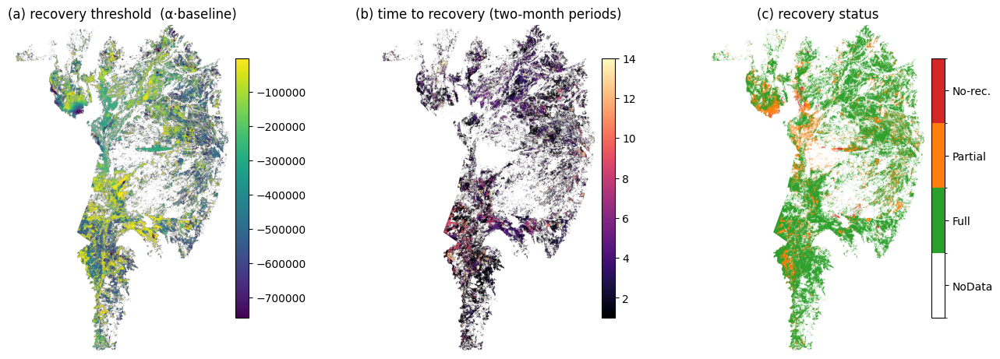

In [ ]:
# @title === P2 — TTR (α·baseline, TTR e status) — figura 1×3 por métrica VOD ===
# Requisitos prévios no ambiente: REF_FP, YMS, MB 300m (frac/mode), leitores de NDVI/EVI/NBR/VOD (sem ÷10000)
# Saídas: ttr_threshold_{MET}.tif | ttr_time_{MET}_bimestres.tif | ttr_status_{MET}.tif | fig_ttr_{MET}_1x3.png

import numpy as np, yaml, warnings
import rasterio as rio
from rasterio.windows import Window
from rasterio.features import rasterize
from rasterio.warp import Resampling, reproject
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm, ListedColormap, BoundaryNorm
from pathlib import Path

# -----------------------------
# Parâmetros
# -----------------------------
METRIC    = "VOD"     # <- mude para "NDVI", "EVI", "NBR" ou "VOD"
ALPHA     = 0.90      # threshold = ALPHA * baseline
N_PRE     = 6         # baseline = mediana dos 6 bimestres anteriores
MAX_POST  = 18        # janela máx. de busca por recuperação (36 meses)
FRACTION_TH = 0.25
USE_MODE    = True
EPS       = 1e-6

# -----------------------------
# Pastas/arquivos
# -----------------------------
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR / "outputs"
REC_DIR  = OUT_DIR / "recovery_nb3"
MB_DIR   = OUT_DIR  / "mb_bi_300m_cache"
OPT_SB_DIR = OUT_DIR / "opt_singleband_300m_cache"        # ndvi/evi/nbr_{ym}_300m.tif
VOD_DIR    = OUT_DIR / "vod_bi_300m_aligned_cache"        # vod_{ym}_300m_aligned.tif
CONFIG   = yaml.safe_load(open(BASE_DIR/"config.yaml"))
BOUNDARY = Path(CONFIG["boundary_path"])
REC_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# Grade/Perfil + máscara Pantanal
# -----------------------------
# use um raster 300 m conhecido como referência
ref_guess = REC_DIR/"recovery_time_VOD_bimestres.tif"
assert ref_guess.exists(), "Rode os mosaicos de recuperação (NB3) ao menos para VOD."
REF_FP = ref_guess

with rio.open(REF_FP) as ref:
    H, W = ref.height, ref.width
    TF, CRS = ref.transform, ref.crs
    PROFILE_F32 = ref.meta.copy()
PROFILE_F32.update(count=1, dtype="float32", nodata=np.nan,
                   compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

gdf = gpd.read_file(BOUNDARY).to_crs(CRS)
MASK = rasterize([(g,1) for g in gdf.geometry if g is not None and not g.is_empty],
                 out_shape=(H,W), transform=TF, fill=0, dtype="uint8").astype(bool)

# -----------------------------
# Leitores por métrica (sem ÷10000)
# -----------------------------
BAND_IDX = {"NDVI":1, "EVI":2, "NBR":3}

def _opt_stack_path(ym: str) -> Path|None:
    for root in [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]:
        for folder in ("Pantanal_TippingPoints_optical","Pantanal_TippingPoints_optical_merged"):
            a = root/folder/f"opt_{ym}.tif"
            b = root/folder/f"opt_{ym}_merged.tif"
            if a.exists(): return a
            if b.exists(): return b
    return None

def _read_opt(metric: str, ym: str, window=None):
    sb = OPT_SB_DIR / f"{metric.lower()}_{ym}_300m.tif"
    if sb.exists():
        with rio.open(sb) as ds: return ds.read(1, window=window).astype("float32")
    src = _opt_stack_path(ym); assert src, f"Óptico não encontrado para {ym}"
    with rio.open(src) as ds: return ds.read(BAND_IDX[metric], window=window).astype("float32")

def _read_vod(ym: str, window=None):
    p = VOD_DIR / f"vod_{ym}_300m_aligned.tif"
    assert p.exists(), f"VOD alinhado não encontrado: {p}"
    with rio.open(p) as ds: return ds.read(1, window=window).astype("float32")

def _read_metric(metric: str, ym: str, window=None):
    return _read_vod(ym, window) if metric=="VOD" else _read_opt(metric, ym, window)

def mb_frac(ym): return MB_DIR/f"mb_bi_{ym}_300m_frac.tif"
def mb_mode(ym): return MB_DIR/f"mb_bi_{ym}_300m_mode.tif"

# -----------------------------
# Sequência bimestral (fallback, caso YMS não exista no escopo)
# -----------------------------
try:
    YMS
except NameError:
    def seq_bi(a,b):
        y,m=int(a[:4]),int(a[4:6]); ye,me=int(b[:4]),int(b[4:6])
        out=[]
        while (y<ye) or (y==ye and m<=me):
            out.append(f"{y}{m:02d}"); m+=2
            if m>12: y+=1; m-=12
        return out
    YMS = seq_bi("198709","202111")

# -----------------------------
# 1) Primeiro fogo: índice t0 no vetor YMS
# -----------------------------
first_fire = np.full((H,W), -1, dtype=np.int32)
for t, ym in enumerate(YMS):
    with rio.open(mb_frac(ym)) as df, rio.open(mb_mode(ym)) as dm:
        FR = df.read(1).astype("float32")
        MD = dm.read(1).astype("uint8")
    fire = (FR >= FRACTION_TH)
    if USE_MODE: fire &= (MD == 1)
    newly = (first_fire < 0) & fire
    first_fire[newly] = t
first_fire[~MASK] = -1

# -----------------------------
# 2) baseline, threshold, TTR e status
#    status codes: 1=full, 2=partial, 3=no-recovery, 0=NoData/fora
# -----------------------------
baseline = np.full((H,W), np.nan, "f4")
thr      = np.full((H,W), np.nan, "f4")
ttr_map  = np.full((H,W), np.nan, "f4")
status   = np.zeros((H,W), dtype="uint8")

TILE = 1024
for r0 in range(0, H, TILE):
    for c0 in range(0, W, TILE):
        h = min(TILE, H-r0); w = min(TILE, W-c0)
        win = Window(col_off=c0, row_off=r0, width=w, height=h)

        # Carrega séries da métrica na janela
        X = np.stack([_read_metric(METRIC, ym, window=win) for ym in YMS], axis=0)  # T×h×w
        FF = first_fire[r0:r0+h, c0:c0+w]

        rr, cc = np.where(FF >= 0)
        for r, c in zip(rr, cc):
            t0 = int(FF[r,c])
            if t0 < N_PRE:  # sem baseline mínimo
                continue
            s = X[:, r, c].astype("float32")

            pre = s[t0-N_PRE : t0]
            if not np.isfinite(pre).any():
                continue
            base = float(np.nanmedian(pre))
            if not np.isfinite(base) or abs(base) <= EPS:
                continue

            target = ALPHA * base
            baseline[r0+r, c0+c] = base
            thr[r0+r, c0+c]      = target

            end  = min(len(s), t0+1+MAX_POST)
            post = s[t0+1 : end]

            # TTR = 1ª posição do pós-fogo que atinge o limiar
            ttr = np.nan
            hit = False
            for i, val in enumerate(post, start=1):
                if np.isfinite(val) and (val >= target):
                    ttr = float(i); hit = True; break
            if hit:
                ttr_map[r0+r, c0+c] = ttr
                status[r0+r, c0+c]  = 1  # full
            else:
                # Se tem AO MENOS UM valor pós-fogo finito, mas nunca atingiu → partial
                has_post = np.isfinite(post).any()
                status[r0+r, c0+c] = 2 if has_post else 3  # partial ou no-recovery

# Fora do Pantanal -> 0
status[~MASK] = 0

# -----------------------------
# 3) Salvar GeoTIFFs
# -----------------------------
def _save_f32(fp, arr):
    with rio.open(REF_FP, "w", **PROFILE_F32) as dst: dst.write(arr.astype("float32"), 1)

_save_f32(REC_DIR/f"ttr_threshold_{METRIC}.tif", thr)
_save_f32(REC_DIR/f"ttr_time_{METRIC}_bimestres.tif", ttr_map)

# status com paleta categórica
with rio.open(REF_FP) as ref:
    prof = ref.meta.copy()
prof.update(count=1, dtype="uint8", nodata=0, compress="lzw", tiled=True,
            blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
with rio.open(REC_DIR/f"ttr_status_{METRIC}.tif", "w", **prof) as dst:
    dst.write(status, 1)

print("✔ Gravados em:", REC_DIR)

# -----------------------------
# 4) Figura 1×3 (threshold • TTR • status)
# -----------------------------
fig, axs = plt.subplots(1, 3, figsize=(13.5, 4.5), constrained_layout=True)

# (a) threshold (α·baseline)
A = thr
if np.isfinite(A).any():
    vmin, vmax = np.nanpercentile(A, [2, 98])
    im = axs[0].imshow(A, vmin=vmin, vmax=vmax, cmap="viridis")
else:
    im = axs[0].imshow(A, cmap="viridis")
axs[0].set_title("(a) recovery threshold  (α·baseline)")
axs[0].axis("off")
cb0 = fig.colorbar(im, ax=axs[0], fraction=0.046, pad=0.02)

# (b) TTR (bimestres)
B = ttr_map
if np.isfinite(B).any():
    vmax = np.nanpercentile(B, 95)
    vmax = max(3.0, float(vmax))
    im = axs[1].imshow(B, vmin=1.0, vmax=vmax, cmap="magma")
else:
    im = axs[1].imshow(B, cmap="magma")
axs[1].set_title("(b) time to recovery (two-month periods)")
axs[1].axis("off")
cb1 = fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.02)

# (c) status (categórico) — CLIP PANTANAL
C = status.copy()                 # 0=NoData/fora, 1=full, 2=partial, 3=no-recovery
Cm = np.ma.masked_where(~MASK, C) # mascara fora do Pantanal

cmap = ListedColormap(["#ffffff", "#2ca02c", "#ff7f0e", "#d62728"])  # branco, verde, laranja, vermelho
cmap.set_bad((1,1,1,0))  # transparente fora
norm = BoundaryNorm([-0.5,0.5,1.5,2.5,3.5], cmap.N)

im = axs[2].imshow(Cm, cmap=cmap, norm=norm)
axs[2].set_title("(c) recovery status")
axs[2].axis("off")
cb2 = fig.colorbar(im, ax=axs[2], fraction=0.046, pad=0.02, ticks=[0,1,2,3])
cb2.ax.set_yticklabels(["NoData", "Full", "Partial", "No-rec."])


out_png = REC_DIR / f"fig_ttr_{METRIC}_1x3.png"
fig.savefig(out_png, dpi=300)
print("✔ Figura salva em:", out_png)

# Pequenas estatísticas para o texto
n_full    = int(np.sum(status==1))
n_partial = int(np.sum(status==2))
n_norec   = int(np.sum(status==3))
n_valid   = n_full + n_partial + n_norec
print(f"{METRIC} — válidos={n_valid} | full={n_full} ({100*n_full/max(1,n_valid):.1f}%) | "
      f"partial={n_partial} ({100*n_partial/max(1,n_valid):.1f}%) | "
      f"no-rec={n_norec} ({100*n_norec/max(1,n_valid):.1f}%)")


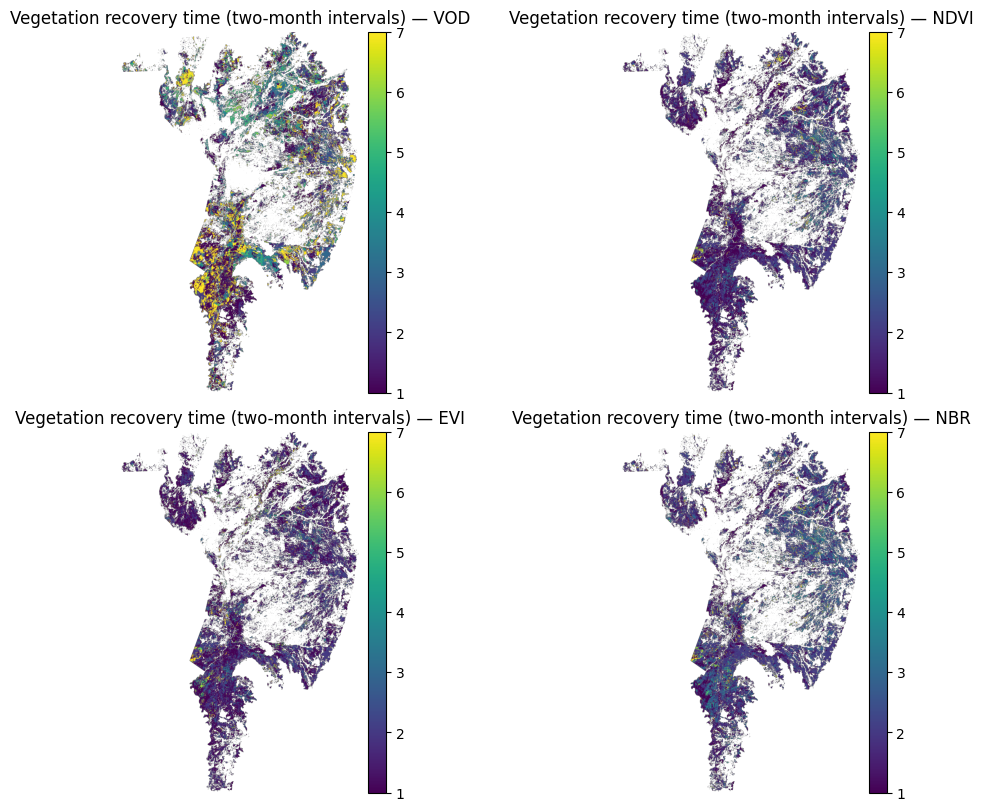

In [ ]:
# @title === C-plot (1x4 ou 2x2) — comparar tempos de recuperação (NDVI, EVI, NBR, VOD) ===
import numpy as np, matplotlib.pyplot as plt
import rasterio as rio
from pathlib import Path
from math import ceil

# escolha o layout aqui: "1x4" ou "2x2"
LAYOUT = "2x2"   # mude para "2x2" se preferir

# quais mapas plotar e em qual ordem
base_names = {
    "NDVI": REC_DIR / "recovery_time_NDVI_bimestres.tif",
    "EVI" : REC_DIR / "recovery_time_EVI_bimestres.tif",
    "NBR" : REC_DIR / "recovery_time_NBR_bimestres.tif",
    "VOD" : REC_DIR / "recovery_time_VOD_bimestres.tif",
}
order = ["VOD", "NDVI", "EVI", "NBR"]  # troque se quiser outra ordem/conjunto

# carregar o que existir
stack, labels = [], []
for k in order:
    fp = base_names.get(k)
    if fp and Path(fp).exists():
        with rio.open(fp) as ds:
            arr = ds.read(1).astype("float32")
        stack.append(arr); labels.append(k)
    else:
        print(f"(i) {k}: arquivo não encontrado, pulando.")

if not stack:
    print("Nenhum raster encontrado para plotar.")
else:
    # vmax comum (p95) para todos os mapas
    all_vals = np.concatenate([a[np.isfinite(a)] for a in stack if np.isfinite(a).any()]) \
               if any(np.isfinite(a).any() for a in stack) else np.array([10.0])
    vmax = float(np.percentile(all_vals, 95)) if all_vals.size else 10.0
    vmax = max(3.0, vmax)

    n = len(stack)
    if LAYOUT == "1x4":
        nrows, ncols = 1, n  # uma linha com n colunas (até 4)
        figsize = (4*n, 4)
    elif LAYOUT == "2x2":
        nrows, ncols = 2, 2
        # se houver menos de 4 mapas, ajusta as “posições” usadas
        figsize = (10, 8)
    else:
        raise ValueError("LAYOUT inválido. Use '1x4' ou '2x2'.")

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, constrained_layout=True)
    axes = np.atleast_1d(axes).ravel()

    # garante que não desenhamos mais eixos do que mapas
    for ax in axes: ax.axis("off")
    for ax, arr, lab in zip(axes[:n], stack, labels):
        im = ax.imshow(arr, vmin=1, vmax=vmax)
        ax.set_title(f"Vegetation recovery time (two-month intervals) — {lab}")
        ax.axis("off")
        cb = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.02)
        #cb.set_label("bimestres")

    plt.show()



In [ ]:
# @title Carrega mosaicos de TTR e monta um DataFrame longo (pixel-level) com colunas: metric, ttr
import numpy as np, pandas as pd, rasterio as rio
from pathlib import Path

BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
REC_DIR  = BASE_DIR / "outputs" / "recovery_nb3"

# arquivos esperados (gerados na Célula C: Mosaicos finais…)
mosaics = {
    "VOD":  REC_DIR / "recovery_time_VOD_bimestres.tif",
    "NDVI": REC_DIR / "recovery_time_NDVI_bimestres.tif",
    "EVI":  REC_DIR / "recovery_time_EVI_bimestres.tif",
    "NBR":  REC_DIR / "recovery_time_NBR_bimestres.tif",
}

# lê cada raster e acumula no DF
records = []
for met, fp in mosaics.items():
    assert fp.exists(), f"Arquivo não encontrado: {fp}"
    with rio.open(fp) as ds:
        a = ds.read(1).astype("float32")
    v = a[np.isfinite(a)]
    # limitamos 1..18 (ignora eventuais outliers)
    v = v[(v >= 1) & (v <= 18)]
    records.append(pd.DataFrame({"metric": met, "ttr": v}))

df_ttr = pd.concat(records, ignore_index=True)
print(df_ttr.groupby("metric")["ttr"].describe().round(2))


           count  mean   std  min  25%  50%  75%   max
metric                                                
EVI     844169.0  1.87  1.48  1.0  1.0  1.0  2.0  18.0
NBR     831045.0  2.25  1.50  1.0  1.0  2.0  3.0  18.0
NDVI    843191.0  1.92  1.29  1.0  1.0  2.0  2.0  18.0
VOD     694989.0  3.88  3.98  1.0  1.0  2.0  5.0  18.0


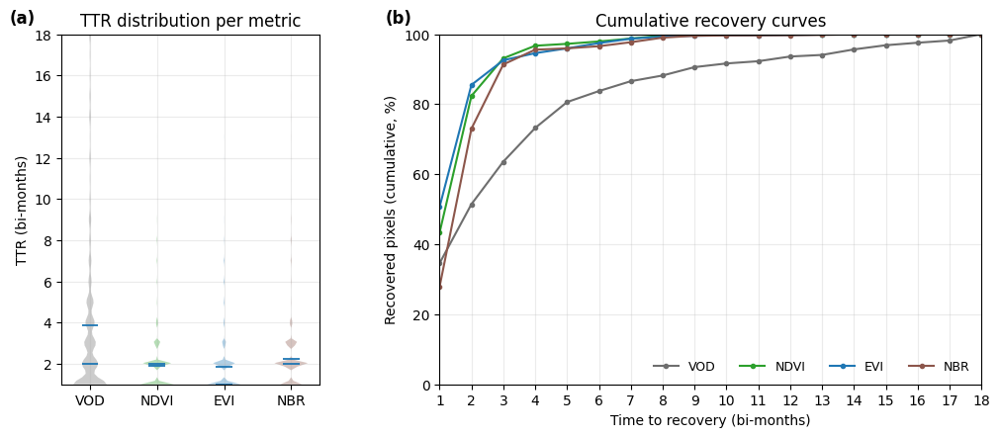

In [ ]:
# @title Painel 1x2: (a) TTR distribution per metric  |  (b) Cumulative recovery curves
import numpy as np, matplotlib.pyplot as plt, rasterio as rio
from matplotlib.gridspec import GridSpec
from pathlib import Path

BASE = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3")
FILES = {
    "VOD" : BASE/"recovery_time_VOD_bimestres.tif",
    "NDVI": BASE/"recovery_time_NDVI_bimestres.tif",
    "EVI" : BASE/"recovery_time_EVI_bimestres.tif",
    "NBR" : BASE/"recovery_time_NBR_bimestres.tif",
}
METRICS = ["VOD","NDVI","EVI","NBR"]
COLORS  = {"VOD":"#6e6e6e","NDVI":"#2ca02c","EVI":"#1f77b4","NBR":"#8c564b"}  # cinza, verde, azul, marrom

def read_vals(fp: Path):
    with rio.open(fp) as ds:
        a = ds.read(1).astype("float32")
    a = a[np.isfinite(a)]
    return a[(a>=1) & (a<=18)]

vals = {m: read_vals(FILES[m]) for m in METRICS}

# --- prepara CDFs ---
k = np.arange(1,19)
cdf = {}
for m in METRICS:
    h, _ = np.histogram(vals[m], bins=np.arange(0.5,18.5+1e-9,1))
    h = h / max(h.sum(), 1)
    cdf[m] = 100*np.cumsum(h)

# ================== PLOT ==================
fig = plt.figure(figsize=(12,4.6))
gs  = GridSpec(nrows=1, ncols=2, width_ratios=[1, 2.1], wspace=0.30)

# (a) TTR distribution per metric (violins)
axA = fig.add_subplot(gs[0,0])
data = [vals[m] for m in METRICS]
parts = axA.violinplot(data, showmeans=True, showmedians=True, showextrema=False)
# cores por métrica
for body, m in zip(parts['bodies'], METRICS):
    body.set_facecolor(COLORS[m]); body.set_alpha(0.35); body.set_edgecolor("none")
for kline in ("cmeans","cmedians"):
    parts[kline].set_linewidth(1.3)
axA.set_xticks(range(1,len(METRICS)+1))
axA.set_xticklabels(METRICS)
axA.set_ylabel("TTR (bi-months)")
axA.set_ylim(1,18)
axA.grid(alpha=0.25)
axA.set_title("TTR distribution per metric")
axA.text(-0.10, 1.02, "(a)", transform=axA.transAxes, ha="right", va="bottom",
         fontsize=12, fontweight="bold")

# (b) Cumulative recovery curves
axB = fig.add_subplot(gs[0,1])
for m in METRICS:
    axB.plot(k, cdf[m], marker='o', markersize=3, linewidth=1.5, label=m, color=COLORS[m])
axB.set_xlim(1,18); axB.set_ylim(0,100)
axB.set_xticks(k)
axB.set_xlabel("Time to recovery (bi-months)")
axB.set_ylabel("Recovered pixels (cumulative, %)")
axB.grid(alpha=0.25)
axB.legend(ncol=4, frameon=False, fontsize=9, loc="lower right")
axB.set_title("Cumulative recovery curves")
axB.text(-0.05, 1.02, "(b)", transform=axB.transAxes, ha="right", va="bottom",
         fontsize=12, fontweight="bold")

plt.show()

# # opcional: salvar
# fig.savefig("/content/figure_TTR_violin_plus_CDF.png", dpi=300, bbox_inches="tight")



In [ ]:
# @title T0 — Setup comparações (carrega mosaicos clipados e máscara)
import numpy as np, pandas as pd, geopandas as gpd, rasterio as rio, os
from rasterio.features import rasterize
from pathlib import Path
import matplotlib.pyplot as plt

COMPARE_DIR = OUT_DIR / "compare_nb3"
COMPARE_DIR.mkdir(parents=True, exist_ok=True)

METRICS_ALL = ["VOD","NDVI","EVI","NBR"]
MOSAICS = {m: REC_DIR / f"recovery_time_{m}_bimestres.tif" for m in METRICS_ALL}

# Checagem de existência
for m,fp in MOSAICS.items():
    assert Path(fp).exists(), f"Mosaico não encontrado para {m}: {fp}"

# Lê grade/CRS do REF_FP
with rio.open(REF_FP) as ref:
    H,W = ref.height, ref.width
    tfm, crs = ref.transform, ref.crs

# Máscara do Pantanal na grade 300 m
gdf = gpd.read_file(BOUNDARY_PATH).to_crs(crs)
MASK = rasterize(
    [(geom,1) for geom in gdf.geometry if geom and not geom.is_empty],
    out_shape=(H, W), transform=tfm, fill=0, dtype="uint8"
).astype(bool)

# Função para abrir mosaico (já está clipado, mas reforçamos a máscara)
def open_mosaic(metric: str):
    with rio.open(MOSAICS[metric]) as ds:
        A = ds.read(1).astype("float32")
    return np.where(MASK, A, np.nan).astype("float32")

# Carrega todos (na RAM; ok para 300 m do Pantanal)
ARR = {m: open_mosaic(m) for m in METRICS_ALL}
for m,a in ARR.items():
    print(f"{m}: válidos no Pantanal = {np.isfinite(a).sum()} px")

# (Opcional) shapefile de sub-regiões — defina o caminho se quiser habilitar análises regionais
SUBREGION_SHP = None  # ex.: Path("/content/drive/MyDrive/Pantanal_subregioes.gpkg")
SUBREGION_ID_FIELD = "name"  # ajuste conforme atributo do seu shapefile



VOD: válidos no Pantanal = 694989 px
NDVI: válidos no Pantanal = 843191 px
EVI: válidos no Pantanal = 844169 px
NBR: válidos no Pantanal = 831045 px


In [ ]:
# @title T1 — Diferenças (métricas − VOD): rasters + estatísticas + CSVs
import numpy as np, pandas as pd, rasterio as rio

def save_float32_like(ref_fp: Path, out_fp: Path, arr: np.ndarray):
    with rio.open(REF_FP) as ref:
        prof = ref.meta.copy()
        prof.update(count=1, dtype="float32", nodata=np.nan,
                    compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
        with rio.open(out_fp, "w", **prof) as dst:
            dst.write(arr.astype("float32"), 1)

summ_rows = []
for m in ["NDVI","EVI","NBR"]:
    vod = ARR["VOD"]; met = ARR[m]
    both = np.isfinite(vod) & np.isfinite(met)
    diff = np.full(vod.shape, np.nan, "f4")
    diff[both] = met[both] - vod[both]   # >0: óptico mais lento; <0: óptico mais rápido

    out_fp = COMPARE_DIR / f"diff_{m}_minus_VOD_bimestres.tif"
    if not out_fp.exists():
        save_float32_like(REF_FP, out_fp, diff)
    print(f"✔ Diferença salva: {out_fp.name}")

    vals = diff[np.isfinite(diff)]
    row = {
        "metric": m, "N": int(vals.size),
        "mean": float(np.mean(vals)) if vals.size else np.nan,
        "std": float(np.std(vals)) if vals.size else np.nan,
        "p25": float(np.percentile(vals, 25)) if vals.size else np.nan,
        "median": float(np.median(vals)) if vals.size else np.nan,
        "p75": float(np.percentile(vals, 75)) if vals.size else np.nan,
        "min": float(np.min(vals)) if vals.size else np.nan,
        "max": float(np.max(vals)) if vals.size else np.nan,
    }
    summ_rows.append(row)

pd.DataFrame(summ_rows).to_csv(COMPARE_DIR/"summary_diffs_vs_VOD.csv", index=False)
print("✔ CSV resumo de diferenças:", COMPARE_DIR/"summary_diffs_vs_VOD.csv")



✔ Diferença salva: diff_NDVI_minus_VOD_bimestres.tif
✔ Diferença salva: diff_EVI_minus_VOD_bimestres.tif
✔ Diferença salva: diff_NBR_minus_VOD_bimestres.tif
✔ CSV resumo de diferenças: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/summary_diffs_vs_VOD.csv


✔ Figura salva em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/plots_diff_indices_minus_VOD.png
✔ Estatísticas rápidas em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/summary_diffs_vs_VOD_quick_stats.csv


,Map,N,Median,p10,p90,Min,Max
0,NDVI − VOD,783952,-1.0,-9.0,2.0,-17.0,17.0
1,EVI − VOD,784429,-1.0,-9.0,1.0,-17.0,17.0
2,NBR − VOD,777822,0.0,-8.0,2.0,-17.0,17.0


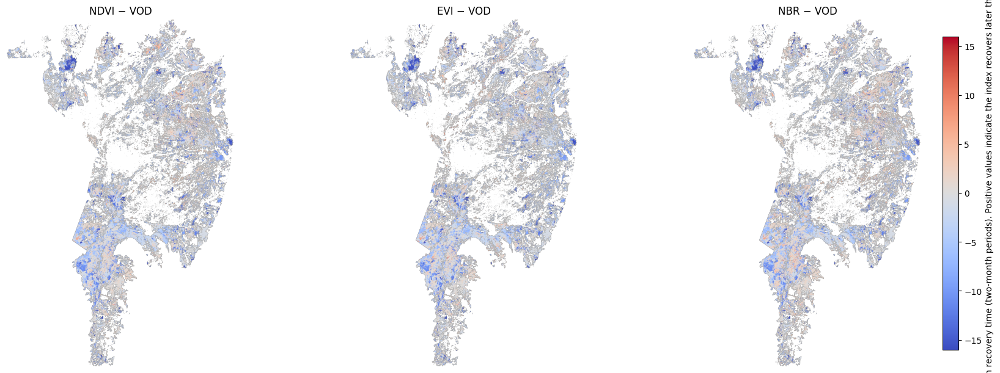

In [ ]:
# @title PLOT — Diferenças de tempo de recuperação (Índice − VOD), clip Pantanal + PNG
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
import geopandas as gpd
from rasterio.features import rasterize
from matplotlib.colors import TwoSlopeNorm
from pathlib import Path

# caminhos de entrada/saída
CMP_DIR = OUT_DIR / "compare_nb3"
diff_specs = [
    ("NDVI − VOD", CMP_DIR / "diff_NDVI_minus_VOD_bimestres.tif"),
    ("EVI − VOD",  CMP_DIR / "diff_EVI_minus_VOD_bimestres.tif"),
    ("NBR − VOD",  CMP_DIR / "diff_NBR_minus_VOD_bimestres.tif"),
]

# util: ler e clipar pelo Pantanal na grade do próprio raster
def read_clip(fp: Path):
    assert fp.exists(), f"Arquivo não encontrado: {fp}"
    with rio.open(fp) as ds:
        A   = ds.read(1).astype("float32")
        H,W = ds.height, ds.width
        tfm = ds.transform
        crs = ds.crs
    # máscara Pantanal
    gdf  = gpd.read_file(BOUNDARY_PATH).to_crs(crs)
    mask = rasterize(
        [(geom, 1) for geom in gdf.geometry if geom is not None and not geom.is_empty],
        out_shape=(H, W), transform=tfm, fill=0, dtype="uint8"
    ).astype(bool)
    A = np.where(mask, A, np.nan)
    return A

# carregar, clipar e calcular limites simétricos (com base no p98 do |valor|)
arrays, titles = [], []
all_abs = []
for title, fp in diff_specs:
    arr = read_clip(fp)
    arrays.append(arr); titles.append(title)
    if np.isfinite(arr).any():
        all_abs.append(np.nanpercentile(np.abs(arr), 98))

# limite simétrico comum
if len(all_abs) == 0:
    raise RuntimeError("Nenhum valor finito encontrado nas diferenças para plotar.")
v = float(max(all_abs))
v = max(v, 1.0)  # pelo menos ±1 bimestre para evitar faixa muito estreita
norm = TwoSlopeNorm(vmin=-v, vcenter=0.0, vmax=v)

# plot 1×3
fig, axs = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)
for ax, A, title in zip(axs, arrays, titles):
    im = ax.imshow(A, norm=norm, cmap="coolwarm")
    ax.set_title(title)
    ax.axis("off")

cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.9, pad=0.02)
cbar.set_label("Difference in recovery time (two-month periods). Positive values indicate the index recovers later than VOD.")

# salvar figura
png_fp = CMP_DIR / "plots_diff_indices_minus_VOD.png"
fig.savefig(png_fp, dpi=200)
print("✔ Figura salva em:", png_fp)

# resumo rápido por raster
import pandas as pd
rows = []
for (title, _), A in zip(diff_specs, arrays):
    vfin = A[np.isfinite(A)]
    rows.append({
        "Map": title,
        "N": int(vfin.size),
        "Median": float(np.median(vfin)) if vfin.size else np.nan,
        "p10": float(np.percentile(vfin, 10)) if vfin.size else np.nan,
        "p90": float(np.percentile(vfin, 90)) if vfin.size else np.nan,
        "Min": float(np.min(vfin)) if vfin.size else np.nan,
        "Max": float(np.max(vfin)) if vfin.size else np.nan,
    })
df = pd.DataFrame(rows)
disp_csv = CMP_DIR / "summary_diffs_vs_VOD_quick_stats.csv"
df.to_csv(disp_csv, index=False)
print("✔ Estatísticas rápidas em:", disp_csv)
df


In [ ]:
# @title === A) Lead/Lag vs VOD — classes, mapa e resumo
import numpy as np, pandas as pd, matplotlib.pyplot as plt, rasterio as rio
from pathlib import Path
from matplotlib.colors import ListedColormap

CMP_DIR = OUT_DIR / "compare_nb3"
DIFF_FPS = {
    "NDVI": CMP_DIR / "diff_NDVI_minus_VOD_bimestres.tif",
    "EVI" : CMP_DIR / "diff_EVI_minus_VOD_bimestres.tif",
    "NBR" : CMP_DIR / "diff_NBR_minus_VOD_bimestres.tif",
}
EPS = 0.25  # tolerância p/ "empate" (~meio bimestre)

classes = {}
summ_rows = []
for m, fp in DIFF_FPS.items():
    assert fp.exists(), f"Diff não encontrado: {fp}"
    with rio.open(fp) as ds:
        A = ds.read(1).astype("float32")
    v = A[np.isfinite(A)]
    if v.size == 0:
        classes[m] = None
        continue
    lead  = (A >  EPS)     # índice recupera depois do VOD
    tie   = (np.abs(A) <= EPS)
    lag   = (A < -EPS)     # índice recupera antes do VOD
    C = np.full(A.shape, np.nan, "f4")
    C[lead] = 1; C[tie] = 0; C[lag] = -1
    classes[m] = C

    n = v.size
    row = {
        "metric": m,
        "N": int(n),
        "lead(%)":  100*float(np.mean(lead[np.isfinite(A)])),
        "tie(%)":   100*float(np.mean(tie[np.isfinite(A)])),
        "lag(%)":   100*float(np.mean(lag[np.isfinite(A)])),
        "median_diff": float(np.median(v)),
        "p25": float(np.percentile(v,25)),
        "p75": float(np.percentile(v,75)),
    }
    summ_rows.append(row)

df = pd.DataFrame(summ_rows)
df.to_csv(CMP_DIR/"lead_lag_summary_vs_VOD.csv", index=False)
print("✔ Tabela:", CMP_DIR/"lead_lag_summary_vs_VOD.csv")
df


✔ Tabela: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/lead_lag_summary_vs_VOD.csv


,metric,N,lead(%),tie(%),lag(%),median_diff,p25,p75
0,NDVI,783952,25.277185,22.753944,51.968871,-1.0,-3.0,1.0
1,EVI,784429,21.608202,24.551489,53.840309,-1.0,-3.0,0.0
2,NBR,777822,30.792906,20.966751,48.240343,0.0,-3.0,1.0


✔ Figura: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/lead_lag_classes_indices_vs_VOD.png


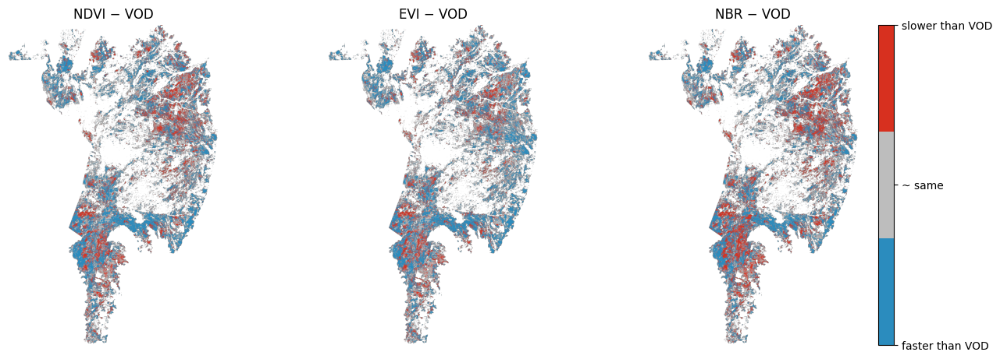

In [ ]:
# @title  Mapa 1×3 das classes (lag/tie/lead)
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
fig, axs = plt.subplots(1, 3, figsize=(14,4.5), constrained_layout=True)
cm = ListedColormap(["#2b8cbe", "#bdbdbd", "#d7301f"])  # lag=azul, tie=cinza, lead=vermelho
titles = ["NDVI − VOD", "EVI − VOD", "NBR − VOD"]
for ax, t in zip(axs, titles):
    m = t.split(" ")[0]
    C = classes[m]
    if C is None:
        ax.text(0.5,0.5,"sem dados", ha="center", va="center"); ax.axis("off"); continue
    im = ax.imshow(C, vmin=-1, vmax=1, cmap=cm)
    ax.set_title(t); ax.axis("off")
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), ticks=[-1,0,1], pad=0.02)
cbar.ax.set_yticklabels(["faster than VOD","~ same","slower than VOD"])
png = CMP_DIR/"lead_lag_classes_indices_vs_VOD.png"
fig.savefig(png, dpi=200)
print("✔ Figura:", png)


✔ Figura (mapas): /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/plot_consistency_signDelta_maps.png
✔ Figura (barras): /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/plot_consistency_signDelta_bars.png
✔ Tabela: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/consistency_signDelta_vs_VOD_quick.csv


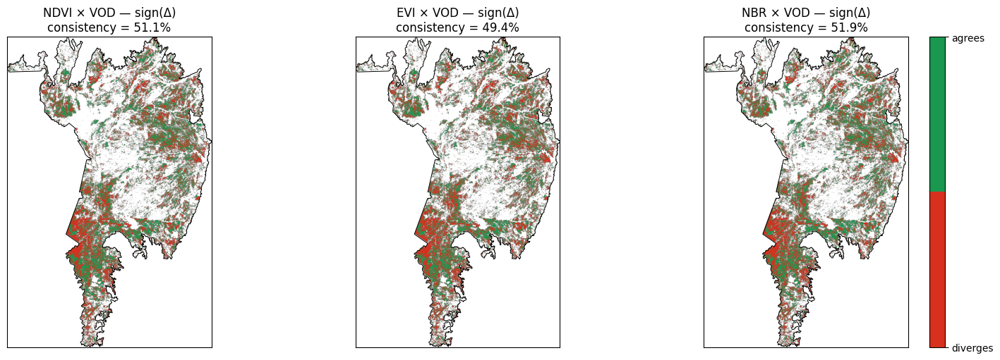

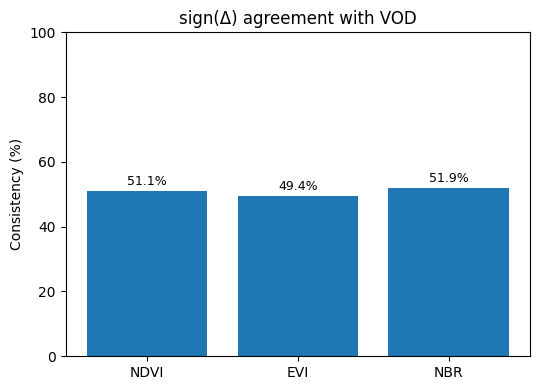

In [ ]:
# @title === PLOT — Consistência do impacto (sign(Δ) índice vs VOD) ===
import numpy as np, matplotlib.pyplot as plt, rasterio as rio, geopandas as gpd
from rasterio.features import rasterize
from matplotlib.colors import ListedColormap
from pathlib import Path
import pandas as pd

CMP_DIR   = OUT_DIR / "compare_nb3"
BOUNDARY_PATH = CONFIG["boundary_path"]

items = [
    ("NDVI", CMP_DIR / "consistency_signDelta_NDVI_with_VOD.tif"),
    ("EVI",  CMP_DIR / "consistency_signDelta_EVI_with_VOD.tif"),
    ("NBR",  CMP_DIR / "consistency_signDelta_NBR_with_VOD.tif"),
]

# Abrir um raster de referência para extent/CRS
with rio.open(REF_FP) as ref:
    H, W  = ref.height, ref.width
    tfm   = ref.transform
    crs   = ref.crs
    xmin, ymax = tfm.c, tfm.f
    xmax = xmin + W * tfm.a
    ymin = ymax + H * tfm.e
extent = (xmin, xmax, ymin, ymax)

# Máscara do Pantanal (só para reforço visual)
gdf  = gpd.read_file(BOUNDARY_PATH).to_crs(crs)

# Colormap binário: 0 (diverge) = vermelho; 1 (consiste) = verde
cmap = ListedColormap(["#d7301f", "#1a9850"])

# Carregar arrays e percentuais
arrays, labels, rates = [], [], []
for lab, fp in items:
    assert fp.exists(), f"Não encontrei {fp}"
    with rio.open(fp) as ds:
        A = ds.read(1).astype("float32")
    arrays.append(A); labels.append(lab)

    v = A[np.isfinite(A)]
    rate = 100.0 * float(np.mean(v)) if v.size else np.nan   # média de {0,1} = taxa de consistência
    rates.append(rate)

# Figura 1: mapas 1×3
fig, axs = plt.subplots(1, 3, figsize=(16,5), constrained_layout=True)
for ax, A, lab, rate in zip(axs, arrays, labels, rates):
    im = ax.imshow(A, vmin=0, vmax=1, cmap=cmap, extent=extent, origin="upper")
    try:
        gdf.boundary.plot(ax=ax, edgecolor="black", linewidth=0.7)
    except Exception:
        pass
    ax.set_title(f"{lab} × VOD — sign(Δ)\nconsistency = {rate:.1f}%")
    ax.set_xticks([]); ax.set_yticks([])
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), ticks=[0,1], pad=0.02)
cbar.ax.set_yticklabels(["diverges", "agrees"])
png_map = CMP_DIR / "plot_consistency_signDelta_maps.png"
fig.savefig(png_map, dpi=200)
print("✔ Figura (mapas):", png_map)

# Figura 2: barras (percentual de consistência)
fig2, ax2 = plt.subplots(figsize=(5.5,4))
ax2.bar(labels, rates)
ax2.set_ylim(0, 100)
ax2.set_ylabel("Consistency (%)")
ax2.set_title("sign(Δ) agreement with VOD")
for i,(lab,rate) in enumerate(zip(labels, rates)):
    ax2.text(i, rate+1, f"{rate:.1f}%", ha="center", va="bottom", fontsize=9)
png_bar = CMP_DIR / "plot_consistency_signDelta_bars.png"
fig2.tight_layout()
fig2.savefig(png_bar, dpi=200)
print("✔ Figura (barras):", png_bar)

# CSV rápido para registro
pd.DataFrame({"metric": labels, "consistency_percent": rates}).to_csv(
    CMP_DIR/"consistency_signDelta_vs_VOD_quick.csv", index=False
)
print("✔ Tabela:", CMP_DIR/"consistency_signDelta_vs_VOD_quick.csv")



/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


✔ Figura 3×3 salva em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/fig_recovery_triptych_3x3.png
Consistência (% que concorda com VOD): {'NDVI': '51.1%', 'EVI': '49.4%', 'NBR': '51.9%'}


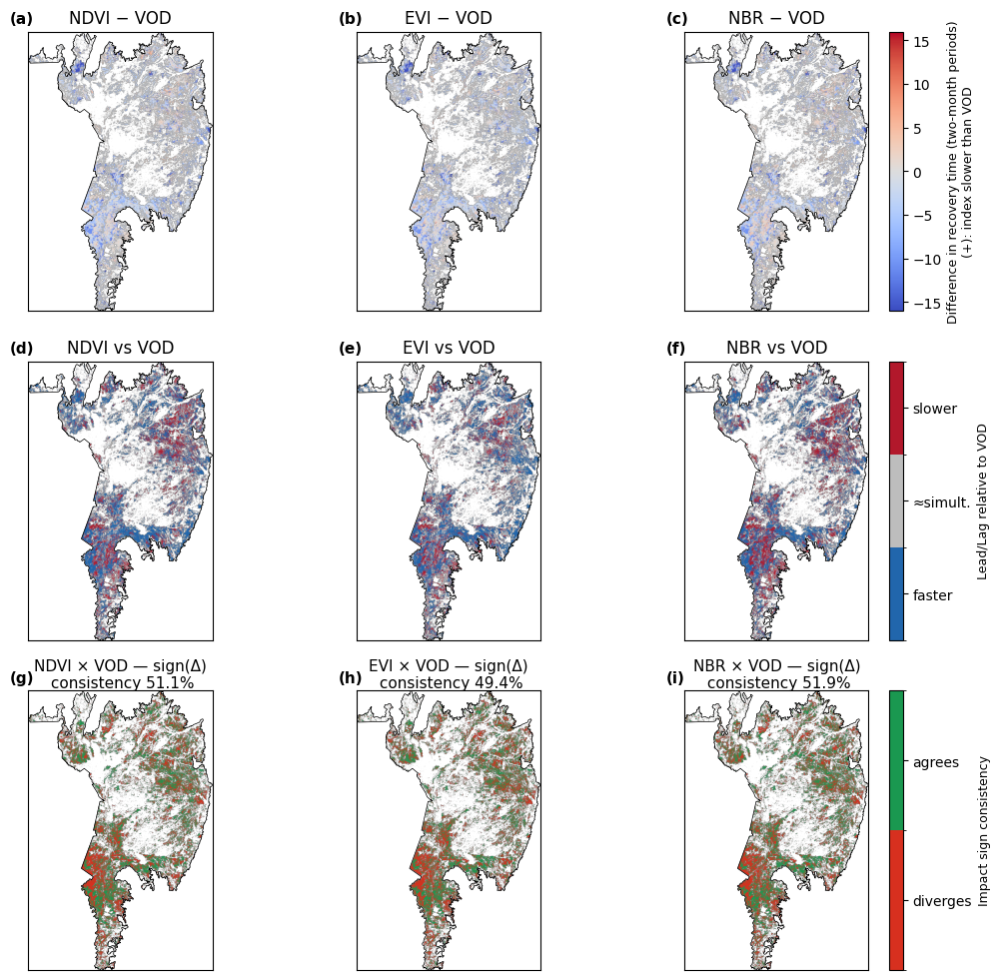

In [ ]:
# @title === FIG — Triptych 3×3 (com mais espaço, letras fora e % de consistência) ===
import numpy as np, matplotlib.pyplot as plt, rasterio as rio, geopandas as gpd, glob, warnings, yaml
from matplotlib.colors import TwoSlopeNorm, ListedColormap, BoundaryNorm
from matplotlib.cm import ScalarMappable
from rasterio.features import rasterize
from pathlib import Path

BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR  = BASE_DIR/"outputs"
CMP_DIR  = OUT_DIR/"compare_nb3"
REC_DIR  = OUT_DIR/"recovery_nb3"
CONFIG   = yaml.safe_load(open(BASE_DIR/"config.yaml"))
BOUNDARY_PATH = CONFIG["boundary_path"]

METRICS = ["NDVI","EVI","NBR"]

# --- grade/máscara/extent ---
ref_fp = REC_DIR/"recovery_time_VOD_bimestres.tif"
with rio.open(ref_fp) as ref:
    H,W  = ref.height, ref.width
    TF   = ref.transform
    CRS  = ref.crs
xmin, ymax = TF.c, TF.f
xmax = xmin + W*TF.a
ymin = ymax + H*TF.e
extent = (xmin, xmax, ymin, ymax)

gdf = gpd.read_file(BOUNDARY_PATH).to_crs(CRS)
MASK = rasterize([(geom,1) for geom in gdf.geometry if geom is not None and not geom.is_empty],
                 out_shape=(H,W), transform=TF, fill=0, dtype="uint8").astype(bool)

def read_clip(fp: Path):
    with rio.open(fp) as ds:
        A = ds.read(1).astype("float32")
    return np.where(MASK, A, np.nan).astype("float32")

def find_first(*patterns):
    for pat in patterns:
        hits = sorted(glob.glob(str(pat)))
        if hits: return Path(hits[0])
    return None

# ----- carregar rasters -----
diff_maps, leadlag_maps, consis_maps, consis_pct = {}, {}, {}, {}

# (1) Diferença
for m in METRICS:
    fp = CMP_DIR/f"diff_{m}_minus_VOD_bimestres.tif"
    assert fp.exists(), f"Falta diferença {m}: {fp}"
    diff_maps[m] = read_clip(fp)

# (2) Lead/Lag classes {-1,0,+1}
for m in METRICS:
    fp = find_first(CMP_DIR/f"leadlag_{m}_vs_VOD.tif",
                    CMP_DIR/f"*lead*{m}*VOD*.tif",
                    CMP_DIR/f"lead_lag_{m}_vs_VOD.tif")
    if not fp:
        warnings.warn(f"[{m}] lead/lag class raster não encontrado — preenchendo com NaN.")
        leadlag_maps[m] = np.full((H,W), np.nan, "f4")
    else:
        leadlag_maps[m] = read_clip(fp)

# (3) Consistência do sinal de Δ {0,1} + % (sobre válidos)
for m in METRICS:
    fp = CMP_DIR/f"consistency_signDelta_{m}_with_VOD.tif"
    assert fp.exists(), f"Falta consistência {m}: {fp}"
    A = read_clip(fp)
    consis_maps[m] = A
    val = np.isfinite(A)
    pct = 100.0 * ( (A==1) & val ).sum() / max(1, val.sum())
    consis_pct[m] = pct

# ----- escalas por linha -----
# L1: diferença (simétrica, 0-centro)
abs98 = [np.nanpercentile(np.abs(diff_maps[m][np.isfinite(diff_maps[m])]), 98)
         for m in METRICS if np.isfinite(diff_maps[m]).any()]
v = max(abs98) if abs98 else 2.0
v = max(v, 1.0)
norm_diff = TwoSlopeNorm(vmin=-v, vcenter=0.0, vmax=v)
cmap_diff = "coolwarm"

# L2: lead/lag
cmap_ll   = ListedColormap(["#2166ac", "#bdbdbd", "#b2182b"])  # faster, ~simult., slower
norm_ll   = BoundaryNorm([-1.5,-0.5,0.5,1.5], cmap_ll.N)

# L3: consistência
cmap_cs   = ListedColormap(["#d7301f", "#1a9850"])  # diverges, agrees
norm_cs   = BoundaryNorm([-0.5,0.5,1.5], cmap_cs.N)

# ----- figura -----
fig, axes = plt.subplots(3, 3, figsize=(13.2, 12.2),
                         gridspec_kw={'hspace':0.18, 'wspace':0.06})

letters = [f"({c})" for c in "abcdefghi"]
def put_letter(ax, s):
    ax.text(-0.1, 1.02, s, transform=ax.transAxes,
            ha="left", va="bottom", fontsize=11, fontweight="bold",
            clip_on=False)

# linha 1 — Diferença
for j, m in enumerate(METRICS):
    ax = axes[0, j]
    im = ax.imshow(diff_maps[m], norm=norm_diff, cmap=cmap_diff,
                   extent=extent, origin="upper")
    try: gdf.boundary.plot(ax=ax, edgecolor="black", linewidth=0.5)
    except: pass
    ax.set_title(f"{m} − VOD", fontsize=12)
    ax.set_xticks([]); ax.set_yticks([])
    put_letter(ax, letters[j])

cb1 = fig.colorbar(ScalarMappable(norm=norm_diff, cmap=cmap_diff),
                   ax=axes[0,:].ravel().tolist(), location="right",
                   fraction=0.035, pad=0.02)
cb1.set_label("Difference in recovery time (two-month periods)\n(+): index slower than VOD", fontsize=9)

# linha 2 — Lead/Lag
for j, m in enumerate(METRICS):
    ax = axes[1, j]
    im = ax.imshow(leadlag_maps[m], cmap=cmap_ll, norm=norm_ll,
                   extent=extent, origin="upper")
    try: gdf.boundary.plot(ax=ax, edgecolor="black", linewidth=0.5)
    except: pass
    ax.set_title(f"{m} vs VOD", fontsize=12)
    ax.set_xticks([]); ax.set_yticks([])
    put_letter(ax, letters[3+j])

cb2 = fig.colorbar(ScalarMappable(norm=norm_ll, cmap=cmap_ll),
                   ax=axes[1,:].ravel().tolist(), location="right",
                   fraction=0.035, pad=0.02, ticks=[-1,0,1])
cb2.ax.set_yticklabels(["faster", "≈simult.", "slower"])
cb2.set_label("Lead/Lag relative to VOD", fontsize=9)

# linha 3 — Consistência (com % no título)
for j, m in enumerate(METRICS):
    ax = axes[2, j]
    im = ax.imshow(consis_maps[m], cmap=cmap_cs, norm=norm_cs,
                   extent=extent, origin="upper")
    try: gdf.boundary.plot(ax=ax, edgecolor="black", linewidth=0.5)
    except: pass
    ax.set_title(f"{m} × VOD — sign(Δ)\n consistency {consis_pct[m]:.1f}%", fontsize=11, pad=2)
    ax.set_xticks([]); ax.set_yticks([])
    put_letter(ax, letters[6+j])

cb3 = fig.colorbar(ScalarMappable(norm=norm_cs, cmap=cmap_cs),
                   ax=axes[2,:].ravel().tolist(), location="right",
                   fraction=0.035, pad=0.02, ticks=[0,1])
cb3.ax.set_yticklabels(["diverges", "agrees"])
cb3.set_label("Impact sign consistency", fontsize=9)

out_png = CMP_DIR/"fig_recovery_triptych_3x3.png"
fig.savefig(out_png, dpi=300)
print("✔ Figura 3×3 salva em:", out_png)
print("Consistência (% que concorda com VOD):",
      {m: f"{consis_pct[m]:.1f}%" for m in METRICS})



In [ ]:
# Paths base
from pathlib import Path
import numpy as np, pandas as pd, rasterio as rio

REC_DIR     = OUT_DIR / "recovery_nb3"
COMPARE_DIR = OUT_DIR / "compare_nb3"; COMPARE_DIR.mkdir(parents=True, exist_ok=True)

fp_VOD  = REC_DIR / "recovery_time_VOD_bimestres.tif"
fp_NDVI = REC_DIR / "recovery_time_NDVI_bimestres.tif"
fp_EVI  = REC_DIR / "recovery_time_EVI_bimestres.tif"
fp_NBR  = REC_DIR / "recovery_time_NBR_bimestres.tif"

# máscara de evento confirmado (criada antes nas análises de severidade "strict MapBiomas")
fp_EVT  = COMPARE_DIR / "RDNBR_EVT.tif"   # ajuste se você salvou em outro lugar
assert Path(fp_EVT).exists(), f"RDNBR_EVT não encontrado: {fp_EVT}"

def open_f32(fp):
    with rio.open(fp) as ds: return ds.read(1).astype("float32")

VOD  = open_f32(fp_VOD)
NDVI = open_f32(fp_NDVI)
EVI  = open_f32(fp_EVI)
NBR  = open_f32(fp_NBR)
RDNBR_EVT = open_f32(fp_EVT)

# Pixels de queima confirmada (MapBiomas frac≥0.25 & mode==1) — definidos quando montamos o EVT
M_confirmed = np.isfinite(RDNBR_EVT)

print("Pix. confirmados (MapBiomas strict):", int(M_confirmed.sum()))





Pix. confirmados (MapBiomas strict): 1161106


In [ ]:
rows=[]
for name, A in [("NDVI", NDVI), ("EVI", EVI), ("NBR", NBR)]:
    m = M_confirmed & np.isfinite(VOD) & np.isfinite(A)
    x, y = VOD[m], A[m]
    if x.size < 10:
        rows.append({"pair": f"{name} vs VOD", "pearson_r": np.nan, "spearman_r": np.nan, "n": int(x.size)})
    else:
        from scipy.stats import pearsonr, spearmanr
        pr,_ = pearsonr(x, y); sr,_ = spearmanr(x, y)
        rows.append({"pair": f"{name} vs VOD", "pearson_r": float(pr), "spearman_r": float(sr), "n": int(x.size)})

df_corr = pd.DataFrame(rows)
df_corr.to_csv(COMPARE_DIR/"spatial_correlations_vs_VOD_CONFIRMED.csv", index=False)
df_corr


,pair,pearson_r,spearman_r,n
0,NDVI vs VOD,-0.011938,-0.018992,599590
1,EVI vs VOD,0.043228,0.034200,600004
2,NBR vs VOD,0.005370,-0.008578,594160


In [ ]:
def masked_vals(A):
    m = M_confirmed & np.isfinite(A); return A[m]

rows=[]
diff_stack=[]
for mname, A in [("NDVI", NDVI), ("EVI", EVI), ("NBR", NBR)]:
    m = M_confirmed & np.isfinite(VOD) & np.isfinite(A)
    D = np.full_like(VOD, np.nan, dtype="float32")
    D[m] = (A[m] - VOD[m])  # >0: índice recupera depois do VOD; <0: antes
    diff_stack.append(D)

    v = D[np.isfinite(D)]
    rows.append({
        "Index": mname, "N": int(v.size),
        "Δ_mean": float(np.mean(v)) if v.size else np.nan,
        "Δ_median": float(np.median(v)) if v.size else np.nan,
        "Dmin": float(np.min(v)) if v.size else np.nan,
        "Dmax": float(np.max(v)) if v.size else np.nan,
        "pct_faster(<0)": float((v<0).mean()*100) if v.size else np.nan,
        "pct_slower(>0)": float((v>0).mean()*100) if v.size else np.nan,
        "pct_tie(=0)":    float((v==0).mean()*100) if v.size else np.nan,
    })

pd.DataFrame(rows).to_csv(COMPARE_DIR/"leadlag_summary_CONFIRMED.csv", index=False)

# DMAX/DMIN (entre índices), já no grid de REF_FP
stack = np.stack(diff_stack, axis=0)  # (3,H,W)
DMAX = np.nanmax(stack, axis=0)
DMIN = np.nanmin(stack, axis=0)

with rio.open(REF_FP) as ref:
    prof = ref.meta.copy(); prof.update(count=1, dtype="float32", nodata=np.nan, compress="lzw", tiled=True)
    with rio.open(COMPARE_DIR/"diff_DMAX_vs_VOD_bimestres_CONFIRMED.tif","w",**prof) as dst: dst.write(DMAX,1)
    with rio.open(COMPARE_DIR/"diff_DMIN_vs_VOD_bimestres_CONFIRMED.tif","w",**prof) as dst: dst.write(DMIN,1)


/tmp/ipython-input-285142665.py:28: RuntimeWarning: All-NaN slice encountered
  DMAX = np.nanmax(stack, axis=0)
/tmp/ipython-input-285142665.py:29: RuntimeWarning: All-NaN slice encountered
  DMIN = np.nanmin(stack, axis=0)


In [ ]:
#@title Métricas
import math
import numpy as _np
np = _np              # garante que `np` é mesmo o NumPy
assert hasattr(np, "sqrt")

def binarize(A, tau):
    B = np.full_like(A, np.nan, "f4")
    m = np.isfinite(A) & M_confirmed
    B[m] = (A[m] <= float(tau)).astype("f4")
    return B

def confusion(ref, pred):
    m = np.isfinite(ref) & np.isfinite(pred)
    r = ref[m].astype(bool); p = pred[m].astype(bool)
    TP = int(( p &  r).sum()); TN = int((~p & ~r).sum())
    FP = int(( p & ~r).sum());  FN = int((~p &  r).sum())
    return TN,FP,FN,TP, int(m.sum())

def metrics(TN, FP, FN, TP):
    # Converte para float para evitar dtypes esquisitos
    TN = float(TN); FP = float(FP); FN = float(FN); TP = float(TP)
    eps = 1e-12

    acc = (TP + TN) / max(TP + TN + FP + FN, eps)
    prec = TP / max(TP + FP, eps)
    rec  = TP / max(TP + FN, eps)
    f1   = 2 * prec * rec / max(prec + rec, eps)

    # MCC robusto (sem np.sqrt; evita ufunc em tipos estranhos)
    denom_prod = (TP + FP) * (TP + FN) * (TN + FP) * (TN + FN)
    if denom_prod <= 0:
        mcc = float("nan")
    else:
        mcc = ((TP * TN) - (FP * FN)) / math.sqrt(denom_prod)

    return acc, prec, rec, f1, mcc

THRS=[6,12,18]
rows=[]
for tau in THRS:
    ref = binarize(VOD, tau)
    for name, A in [("NDVI",NDVI),("EVI",EVI),("NBR",NBR)]:
        pred = binarize(A, tau)
        TN,FP,FN,TP,N = confusion(ref,pred)
        acc,prec,rec,f1,mcc = metrics(TN,FP,FN,TP)
        rows.append({
            "index":name, "tau_bimesters":tau, "N":N,
            "TN":TN,"FP":FP,"FN":FN,"TP":TP,
            "accuracy":acc,"precision":prec,"recall":rec,"F1":f1,"MCC":mcc
        })

df_conf = pd.DataFrame(rows)
df_conf.to_csv(COMPARE_DIR/"confusion_recovery_thresholds_CONFIRMED.csv", index=False)
df_conf


,index,tau_bimesters,N,TN,FP,FN,TP,accuracy,precision,recall,F1,MCC
0,NDVI,6,599590,2200,105625,13099,478666,0.801991,0.819225,0.973363,0.889667,-0.015181
1,EVI,6,600004,4802,103015,12081,480106,0.808175,0.823339,0.975454,0.892965,0.046417
2,NBR,6,594160,3311,104000,19925,466924,0.791428,0.817839,0.959074,0.882843,-0.019988
3,NDVI,12,599590,35,41576,528,557451,0.929779,0.930594,0.999054,0.963610,-0.000872
4,EVI,12,600004,119,41481,1213,557191,0.928844,0.930712,0.997828,0.963102,0.003715
5,NBR,12,594160,177,41415,1816,550752,0.927240,0.930062,0.996714,0.962235,0.004277
6,NDVI,18,599590,0,0,0,599590,1.000000,1.000000,1.000000,1.000000,NaN
7,EVI,18,600004,0,0,0,600004,1.000000,1.000000,1.000000,1.000000,NaN
8,NBR,18,594160,0,0,0,594160,1.000000,1.000000,1.000000,1.000000,NaN


In [ ]:
# @title Resumo Δ (Index−VOD) + ROC AUC + ACC/PREC/RECALL/F1/MCC (τ=12) — apenas queimadas confirmadas
import numpy as np, pandas as pd, rasterio as rio
from pathlib import Path

# ========================# @title Resumo Δ (Index−VOD) + ROC AUC + ACC/PREC/RECALL/F1/MCC (τ=12) — apenas queimadas confirmadas
import numpy as np, pandas as pd, rasterio as rio
from pathlib import Path

# ========================
# 1) Localização de arquivos
# ========================
CANDIDATE_DIRS = []
if 'REC_DIR' in globals():
    CANDIDATE_DIRS += [Path(REC_DIR), Path(REC_DIR)/"mosaics"]
if 'OUT_DIR' in globals():
    od = Path(OUT_DIR)
    CANDIDATE_DIRS += [
        od/"recovery_nb3", od/"recovery_nb3/mosaics",
        od/"index/outputs/recovery_nb3", od/"index/outputs/recovery_nb3/mosaics"
    ]

# fallback comum do projeto
CANDIDATE_DIRS += [
    Path("/content/drive/MyDrive/Pantanal_Tipping_Points/index/outputs/recovery_nb3"),
    Path("/content/drive/MyDrive/Pantanal_Tipping_Points/index/outputs/recovery_nb3/mosaics"),
    Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3"),  # caminho antigo
    Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/recovery_nb3/mosaics")
]

def find_first(*names):
    """Procura o primeiro arquivo existente entre dirs candidatos + nomes."""
    for d in CANDIDATE_DIRS:
        for n in names:
            p = d / n
            if p.exists():
                return p
    return None

# ---- tenta achar os 4 mosaicos de TTR ----
fp_vod  = find_first("recovery_time_VOD_bimestres.tif")
fp_ndvi = find_first("recovery_time_NDVI_bimestres.tif")
fp_evi  = find_first("recovery_time_EVI_bimestres.tif")
fp_nbr  = find_first("recovery_time_NBR_bimestres.tif")

missing = [("VOD",fp_vod),("NDVI",fp_ndvi),("EVI",fp_evi),("NBR",fp_nbr)]
missing = [k for k,p in missing if p is None]
if missing:
    raise FileNotFoundError(
        "Não encontrei os mosaicos TTR para: %s.\nTente rodar antes a célula de mosaico (C) ou ajuste CANDIDATE_DIRS." % ", ".join(missing)
    )

print("Arquivos TTR encontrados:")
for name, fp in [("VOD",fp_vod),("NDVI",fp_ndvi),("EVI",fp_evi),("NBR",fp_nbr)]:
    print(f" - {name}: {fp}")

# ---- máscara de queimadas confirmadas (burn_fraction>=0.25 & mode==1) no evento
# Agora com suporte a arquivos no padrão mb_bi_YYYYMM_300m_{frac,mode}.tif
import re

mask_candidates = [
    ("FRAC", [
        "burn_fraction_event_300m.tif",
        "burn_fraction_EVT_300m.tif",
        "burn_frac_event_300m.tif",
        "burn_fraction_event.tif",
        "event_burn_fraction_300m.tif",
        "burn_fraction_event_300m_clip.tif",
    ]),
    ("MODE", [
        "burn_mode_event_300m.tif",
        "burn_mode_EVT_300m.tif",
        "burn_mode_event.tif",
        "event_burn_mode_300m.tif",
        "burn_mode_event_300m_clip.tif",
    ]),
]

found = {}
for kind, names in mask_candidates:
    for nm in names:
        p = find_first(nm)
        if p is not None:
            found[kind] = p
            break

# --- Se não encontrou os nomes "event", procurar pares mb_bi_YYYYMM_300m_{frac,mode}.tif ---
if ("FRAC" not in found) or ("MODE" not in found):
    frac_list, mode_list = [], []
    for d in CANDIDATE_DIRS:
        if d.exists():
            frac_list += list(d.glob("*_300m_frac.tif")) + list(d.glob("mb_bi_*_300m_frac.tif"))
            mode_list += list(d.glob("*_300m_mode.tif")) + list(d.glob("mb_bi_*_300m_mode.tif"))
    # mapear por chave base (antes de _300m_...)
    key_re = re.compile(r"(.+?)_300m_(frac|mode)\.tif$")
    frac_map, mode_map = {}, {}
    for p in frac_list:
        m = key_re.search(p.name)
        if m: frac_map[m.group(1)] = p
    for p in mode_list:
        m = key_re.search(p.name)
        if m: mode_map[m.group(1)] = p
    common = sorted(set(frac_map.keys()) & set(mode_map.keys()))
    if common:
        # escolhe o último na ordem lexicográfica (ex.: maior YYYYMM)
        key = common[-1]
        found["FRAC"] = frac_map[key]
        found["MODE"] = mode_map[key]
        print(f"✔ Detectado par FRAC/MODE no padrão mb_bi_*: base='{key}' → {found['FRAC'].name} / {found['MODE'].name}")

M_confirmed = None
if ("FRAC" in found) and ("MODE" in found):
    with rio.open(found["FRAC"]) as ds: FR = ds.read(1).astype("float32")
    with rio.open(found["MODE"]) as ds: MD = ds.read(1).astype("float32")
    M_confirmed = (FR >= 0.25) & (MD == 1)
    print(f"✔ Usando máscara confirmada: FRAC={found['FRAC'].name}, MODE={found['MODE'].name}")
else:
    # Fallback 1: tentar um raster de frequência de queimadas (>=1) como proxy
    freq_fp = find_first(
        "burn_frequency_300m_clip.tif", "burn_frequency_300m.tif",
        "burn_frequency_clip.tif", "burn_frequency.tif",
        "burn_freq_300m.tif"
    )
    if freq_fp is not None:
        with rio.open(freq_fp) as ds: FREQ = ds.read(1).astype("float32")
        M_confirmed = np.isfinite(FREQ) & (FREQ >= 1)
        print(f"⚠️ FRAC/MODE não encontrados. Usando proxy FREQ>=1: {freq_fp.name}")
    else:
        print("⚠️ FRAC/MODE e FREQUENCY não encontrados. Usando máscara mínima (pixéis válidos).")
        M_confirmed = None

# ---- leitura dos TTRs ----

with rio.open(fp_vod) as ds:  V = ds.read(1).astype("float32")
with rio.open(fp_ndvi) as ds: N = ds.read(1).astype("float32")
with rio.open(fp_evi) as ds:  E = ds.read(1).astype("float32")
with rio.open(fp_nbr) as ds:  B = ds.read(1).astype("float32")

# ========================
# 2) Funções auxiliares
# ========================
def delta_stats(idx_arr, mask):
    both = np.isfinite(idx_arr) & np.isfinite(V) & mask
    d = (idx_arr[both] - V[both]).astype("float32")
    if d.size == 0:
        return dict(N=0, Delta_mean=np.nan, Delta_median=np.nan, Dmin=np.nan, Dmax=np.nan)
    return dict(N=int(d.size),
                Delta_mean=float(np.nanmean(d)),
                Delta_median=float(np.nanmedian(d)),
                Dmin=float(np.nanmin(d)),
                Dmax=float(np.nanmax(d)))

def auc_trap(x, y):
    x = np.asarray(x, "f8"); y = np.asarray(y, "f8")
    m = np.isfinite(x) & np.isfinite(y)
    if m.sum() < 2:
        return float("nan")
    order = np.argsort(x[m])
    return float(np.trapz(y[m][order], x[m][order]))

def roc_auc_vs_vod(idx_arr, mask, tau_ref=12):
    # classe-verdade: VOD<=tau_ref (recuperação até tau_ref bimestres)
    m = np.isfinite(idx_arr) & np.isfinite(V) & mask
    if m.sum() == 0:
        return float("nan")
    y_true = (V[m] <= float(tau_ref)).astype(np.uint8)
    TPR, FPR = [], []
    for t in range(1, 19):
        y_pred = (idx_arr[m] <= float(t)).astype(np.uint8)
        TP = int(((y_pred==1) & (y_true==1)).sum())
        TN = int(((y_pred==0) & (y_true==0)).sum())
        FP = int(((y_pred==1) & (y_true==0)).sum())
        FN = int(((y_pred==0) & (y_true==1)).sum())
        TPR.append( TP / max(TP+FN, 1) )
        FPR.append( FP / max(FP+TN, 1) )
    return auc_trap(np.array(FPR), np.array(TPR))

# Métricas binárias com proteção contra divisão por zero
from math import sqrt

def binary_metrics(TP, FP, FN, TN):
    total = TP + FP + FN + TN
    acc = (TP + TN) / total if total else np.nan
    prec = TP / (TP + FP) if (TP + FP) else np.nan
    rec = TP / (TP + FN) if (TP + FN) else np.nan
    f1 = (2*prec*rec)/(prec+rec) if (prec is not np.nan and rec is not np.nan and (prec+rec)) else np.nan
    denom = sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN))
    mcc = ((TP*TN) - (FP*FN)) / denom if denom else np.nan
    return acc, prec, rec, f1, mcc

# Varre thresholds (1..18) para cada índice e pega o que maximiza F1 (empate -> menor t)
# Classe-verdade: V<=tau_ref

def best_threshold_and_metrics(idx_arr, mask, tau_ref=12):
    m = np.isfinite(idx_arr) & np.isfinite(V) & mask
    if m.sum() == 0:
        return dict(thr=np.nan, ACC=np.nan, PREC=np.nan, RECALL=np.nan, F1=np.nan, MCC=np.nan,
                    TP=0,FP=0,FN=0,TN=0)
    y_true = (V[m] <= float(tau_ref)).astype(np.uint8)
    best = dict(score=-1, thr=None, ACC=np.nan, PREC=np.nan, RECALL=np.nan, F1=np.nan, MCC=np.nan,
                TP=0,FP=0,FN=0,TN=0)
    for t in range(1, 19):
        y_pred = (idx_arr[m] <= float(t)).astype(np.uint8)
        TP = int(((y_pred==1) & (y_true==1)).sum())
        TN = int(((y_pred==0) & (y_true==0)).sum())
        FP = int(((y_pred==1) & (y_true==0)).sum())
        FN = int(((y_pred==0) & (y_true==1)).sum())
        acc, prec, rec, f1, mcc = binary_metrics(TP, FP, FN, TN)
        score = -1 if np.isnan(f1) else f1
        if (score > best['score']) or (score == best['score'] and best['thr'] is not None and t < best['thr']):
            best.update(dict(score=score, thr=t, ACC=acc, PREC=prec, RECALL=rec, F1=f1, MCC=mcc,
                             TP=TP,FP=FP,FN=FN,TN=TN))
    return best

# ========================
# 3) Consolidação da tabela
# ========================
rows = []
for name, A in [("NDVI", N), ("EVI", E), ("NBR", B)]:
    stats = delta_stats(A, M_confirmed)
    auc12 = roc_auc_vs_vod(A, M_confirmed, tau_ref=12)
    best = best_threshold_and_metrics(A, M_confirmed, tau_ref=12)
    rows.append({
        "Index": name,
        "N": stats["N"],
        "thr*": best["thr"],
        "ACC": best["ACC"],
        "PREC": best["PREC"],
        "RECALL": best["RECALL"],
        "F1": best["F1"],
        "MCC": best["MCC"],
        "Δ_mean": stats["Delta_mean"],
        "Δ_median": stats["Delta_median"],
        "Dmin": stats["Dmin"],
        "Dmax": stats["Dmax"],
        "ROC_AUC(τ=12)": auc12,
        "TP": best["TP"],
        "FP": best["FP"],
        "FN": best["FN"],
        "TN": best["TN"],
    })

cols_order = [
    "Index","N","thr*","ACC","PREC","RECALL","F1","MCC",
    "Δ_mean","Δ_median","Dmin","Dmax","ROC_AUC(τ=12)",
    "TP","FP","FN","TN"
]

df = pd.DataFrame(rows)[cols_order].sort_values("Index").reset_index(drop=True)

# arredonda para 2 casas onde é float
float_cols = [c for c in df.columns if c not in ("Index","N","thr*","TP","FP","FN","TN")]
for c in float_cols:
    df[c] = df[c].astype(float).round(2)

display(df)

# ========================
# 4) Salva CSV
# ========================
out_dir = (Path(OUT_DIR) if 'OUT_DIR' in globals() else Path('.')).joinpath('compare_nb3')
out_dir.mkdir(parents=True, exist_ok=True)
out_csv = out_dir / 'summary_metrics_confirmedBurns_tau12.csv'
df.to_csv(out_csv, index=False)
print("✔ Tabela salva em:", out_csv)





In [ ]:
# @title T3 — Matriz de confusão (≤6/12/18) e Lead/Lag (rasters + CSVs)
import numpy as np, pandas as pd, rasterio as rio

def confusion_counts(y_true, y_pred):
    # y_true/y_pred booleanos
    TP = int(( y_true &  y_pred).sum())
    TN = int((~y_true & ~y_pred).sum())
    FP = int((~y_true &  y_pred).sum())
    FN = int(( y_true & ~y_pred).sum())
    return TP, TN, FP, FN

def metrics_from_counts(TP, TN, FP, FN):
    tot = TP+TN+FP+FN
    acc = (TP+TN)/tot if tot else np.nan
    prec= TP/(TP+FP) if (TP+FP) else np.nan
    rec = TP/(TP+FN) if (TP+FN) else np.nan
    f1  = 2*prec*rec/(prec+rec) if (prec>0 and rec>0) else np.nan
    return acc, prec, rec, f1

THRS = [6,12,18]  # bimestres
rows=[]
for m in ["NDVI","EVI","NBR"]:
    vod = ARR["VOD"]; met = ARR[m]
    both = np.isfinite(vod) & np.isfinite(met)
    for thr in THRS:
        yT = (vod[both] <= thr)   # "recuperou até thr" no VOD
        yP = (met[both] <= thr)   # idem na métrica
        TP,TN,FP,FN = confusion_counts(yT, yP)
        acc,prec,rec,f1 = metrics_from_counts(TP,TN,FP,FN)
        rows.append({
            "pair": f"{m}~VOD", "threshold_bimestres": thr,
            "N": int(both.sum()), "TP":TP,"TN":TN,"FP":FP,"FN":FN,
            "accuracy":acc,"precision":prec,"recall":rec,"F1":f1
        })
df_conf = pd.DataFrame(rows)
df_conf.to_csv(COMPARE_DIR/"confusion_recovery_thresholds.csv", index=False)
df_conf

# --- Lead/Lag rasters: (métrica − VOD)
def save_float32_like(out_fp: Path, arr: np.ndarray):
    with rio.open(REF_FP) as ref:
        prof = ref.meta.copy()
        prof.update(count=1, dtype="float32", nodata=np.nan,
                    compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
        with rio.open(out_fp, "w", **prof) as dst:
            dst.write(arr.astype("float32"), 1)

rows=[]
for m in ["NDVI","EVI","NBR"]:
    vod = ARR["VOD"]; met = ARR[m]
    both = np.isfinite(vod) & np.isfinite(met)
    LL = np.full(vod.shape, np.nan, "f4")
    LL[both] = met[both] - vod[both]  # >0: óptico mais lento; <0: óptico mais rápido

    out_fp = COMPARE_DIR / f"leadlag_{m}_minus_VOD_bimestres.tif"
    if not out_fp.exists():
        save_float32_like(out_fp, LL)

    vals = LL[np.isfinite(LL)]
    rows.append({
        "pair": f"{m}~VOD",
        "N": int(vals.size),
        "mean": float(np.mean(vals)) if vals.size else np.nan,
        "std": float(np.std(vals)) if vals.size else np.nan,
        "p25": float(np.percentile(vals,25)) if vals.size else np.nan,
        "median": float(np.median(vals)) if vals.size else np.nan,
        "p75": float(np.percentile(vals,75)) if vals.size else np.nan,
        "min": float(np.min(vals)) if vals.size else np.nan,
        "max": float(np.max(vals)) if vals.size else np.nan,
        "pct_optical_faster(<0)": float( (vals<0).mean()*100 ) if vals.size else np.nan,
        "pct_optical_slower(>0)": float( (vals>0).mean()*100 ) if vals.size else np.nan,
        "pct_tie(==0)":           float( (vals==0).mean()*100 ) if vals.size else np.nan,
    })

pd.DataFrame(rows).to_csv(COMPARE_DIR/"leadlag_summary.csv", index=False)
print("✔ Lead/Lag rasters e CSVs gravados em:", COMPARE_DIR)



✔ Lead/Lag rasters e CSVs gravados em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3


✔ Confusion CSV saved: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/confusion_vs_VOD_tau6.csv


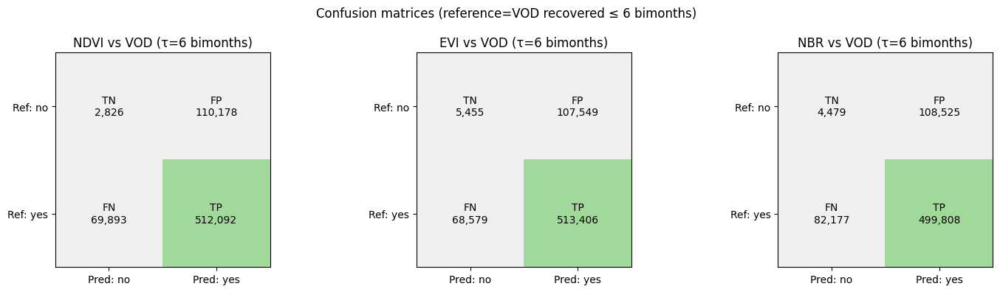

✔ Confusion CSV saved: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/confusion_vs_VOD_tau12.csv


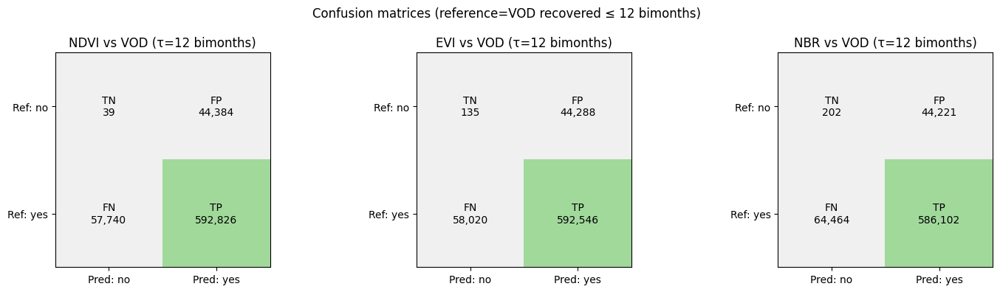

✔ Confusion CSV saved: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/confusion_vs_VOD_tau18.csv


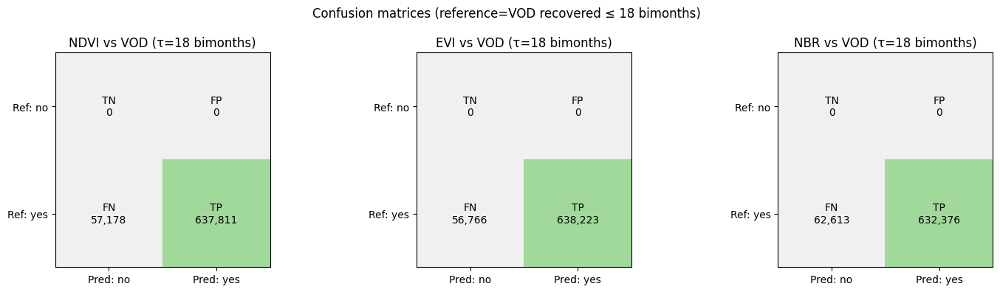

In [ ]:
# @title T3b — Confusion matrices vs VOD at τ∈{6,12,18} + heatmaps & CSVs
import numpy as np, pandas as pd, matplotlib.pyplot as plt
import rasterio as rio
from pathlib import Path
from matplotlib.colors import ListedColormap

COMPARE_DIR = OUT_DIR / "compare_nb3"
COMPARE_DIR.mkdir(parents=True, exist_ok=True)

def open_recovery(metric: str):
    fp = REC_DIR / f"recovery_time_{metric}_bimestres.tif"
    assert fp.exists(), f"Missing recovery raster: {fp}"
    with rio.open(fp) as ds:
        A = ds.read(1)
        tfm, crs = ds.transform, ds.crs
        H, W = ds.height, ds.width
    return A, (H, W, tfm, crs)

# carrega VOD + índices
A_vod, geo = open_recovery("VOD")
A_ndvi, _  = open_recovery("NDVI")
A_evi,  _  = open_recovery("EVI")
A_nbr,  _  = open_recovery("NBR")

# máscara válida: onde ao menos VOD é finito (dentro do Pantanal e recuperou)
valid = np.isfinite(A_vod)

def confusion_counts(ref_rec, pred_rec):
    """
    ref_rec, pred_rec: booleanos (True=recuperou ≤τ ; False=caso contrário) apenas onde valid==True
    Retorna dict TN, FP, FN, TP.
    """
    TN = int((~ref_rec & ~pred_rec).sum())
    FP = int((~ref_rec &  pred_rec).sum())
    FN = int(( ref_rec & ~pred_rec).sum())
    TP = int(( ref_rec &  pred_rec).sum())
    return {"TN": TN, "FP": FP, "FN": FN, "TP": TP}

def plot_confusion(ax, C, title):
    # C ordem [[TN, FP],[FN, TP]]
    im = ax.imshow(C, cmap=ListedColormap(["#f0f0f0","#fee0d2","#deebf7","#a1d99b"]), vmin=0)
    # anotações
    labels = np.array([["TN","FP"],["FN","TP"]])
    for i in range(2):
        for j in range(2):
            ax.text(j, i, f"{labels[i,j]}\n{C[i,j]:,}", ha="center", va="center", fontsize=10)
    ax.set_xticks([0,1]); ax.set_yticks([0,1])
    ax.set_xticklabels(["Pred: no","Pred: yes"]); ax.set_yticklabels(["Ref: no","Ref: yes"])
    ax.set_title(title)
    ax.grid(False)

# laços por limiar e por índice
THRESHOLDS = [6, 12, 18]
for tau in THRESHOLDS:
    # referência (VOD): recuperou ≤ τ ?
    ref = np.isfinite(A_vod) & (A_vod <= tau)

    results = {}
    mats = {}

    for name, A_idx in [("NDVI", A_ndvi), ("EVI", A_evi), ("NBR", A_nbr)]:
        pred = np.isfinite(A_idx) & (A_idx <= tau)

        # considerar apenas onde VOD é válido (e o índice tem dado ou não)
        ref_tau  = ref[valid]
        pred_tau = pred[valid]

        counts = confusion_counts(ref_tau, pred_tau)
        TN, FP, FN, TP = counts["TN"], counts["FP"], counts["FN"], counts["TP"]
        mats[name] = np.array([[TN, FP],[FN, TP]], dtype=int)
        # métricas rápidas
        acc = (TP + TN) / max(1, (TP+TN+FP+FN))
        prec = TP / max(1, (TP+FP))
        rec  = TP / max(1, (TP+FN))
        f1   = 2*prec*rec / max(1e-9, (prec+rec))
        results[name] = {
            "tau_bimesters": tau, "TN": TN, "FP": FP, "FN": FN, "TP": TP,
            "accuracy": acc, "precision": prec, "recall": rec, "f1": f1,
            "support_ref_yes": int(ref_tau.sum()),
            "support_ref_no":  int((~ref_tau).sum())
        }

    # salvar CSV por τ
    df = pd.DataFrame.from_dict(results, orient="index").reset_index().rename(columns={"index":"index"})
    csv_fp = COMPARE_DIR / f"confusion_vs_VOD_tau{tau}.csv"
    df.to_csv(csv_fp, index=False)
    print(f"✔ Confusion CSV saved: {csv_fp}")

    # plot 1×3 heatmaps (NDVI, EVI, NBR)
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))
    for ax, name in zip(axs, ["NDVI","EVI","NBR"]):
        plot_confusion(ax, mats[name], title=f"{name} vs VOD (τ={tau} bimonths)")
    plt.suptitle(f"Confusion matrices (reference=VOD recovered ≤ {tau} bimonths)")
    plt.tight_layout()
    plt.show()


In [ ]:
# @title M0 — Imports e paths (métricas)
import os, json, math
from pathlib import Path
import numpy as np
import pandas as pd
import rasterio as rio
import matplotlib.pyplot as plt

COMPARE_DIR = OUT_DIR / "compare_nb3"
COMPARE_DIR.mkdir(parents=True, exist_ok=True)

fp_VOD  = REC_DIR / "recovery_time_VOD_bimestres.tif"
fp_NDVI = REC_DIR / "recovery_time_NDVI_bimestres.tif"
fp_EVI  = REC_DIR / "recovery_time_EVI_bimestres.tif"
fp_NBR  = REC_DIR / "recovery_time_NBR_bimestres.tif"

for p in [fp_VOD, fp_NDVI, fp_EVI, fp_NBR]:
    assert p.exists(), f"Missing raster: {p}"


In [ ]:
# @title M1 — Funções de binarização e métricas (confusão, MCC, ROC/PR)
def binarize_recovery(A, tau):
    """1 se A ≤ tau (recuperou até tau bimestres), 0 se A > tau, NaN se A for NaN."""
    B = np.full_like(A, np.nan, dtype="float32")
    finite = np.isfinite(A)
    B[finite] = (A[finite] <= float(tau)).astype("float32")
    return B

def confusion_from_bin(ref, pred):
    """
    ref, pred em {0,1} com NaN ignorado. Retorna TN, FP, FN, TP.
    """
    m = np.isfinite(ref) & np.isfinite(pred)
    r = ref[m].astype(bool)
    p = pred[m].astype(bool)
    TP = int(np.sum( p &  r))
    TN = int(np.sum(~p & ~r))
    FP = int(np.sum( p & ~r))
    FN = int(np.sum(~p &  r))
    return TN, FP, FN, TP, int(np.sum(m))

def metrics_from_conf(TN, FP, FN, TP):
    eps = 1e-12
    acc = (TP+TN)/max(TP+TN+FP+FN, eps)
    prec= TP/max(TP+FP, eps)
    rec = TP/max(TP+FN, eps)            # TPR / recall
    spec= TN/max(TN+FP, eps)            # TNR / specificity
    f1  = 2*prec*rec/max(prec+rec, eps)
    # MCC:
    denom = math.sqrt(max((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN), eps))
    mcc = ((TP*TN)-(FP*FN))/denom
    return {"accuracy":acc,"precision":prec,"recall":rec,"specificity":spec,"f1":f1,"mcc":mcc}

def roc_pr_vs_reference(A_ref, A_idx, tau_ref):
    """
    Varia o limiar do índice (1..18 bimestres), mantendo VOD (ref) binário fixo em tau_ref.
    Retorna DataFrame com threshold, TPR, FPR, Precision, Recall e MCC.
    """
    ref_bin = binarize_recovery(A_ref, tau_ref)
    rows=[]
    # thresholds do índice: 1..18 bimestres (ajuste se quiser)
    for t in range(1, 19):
        pred_bin = binarize_recovery(A_idx, t)
        TN, FP, FN, TP, N = confusion_from_bin(ref_bin, pred_bin)
        m = metrics_from_conf(TN, FP, FN, TP)
        FPR = FP / max(FP+TN, 1e-12)
        rows.append({
            "threshold": t, "N": N,
            "TP": TP, "TN": TN, "FP": FP, "FN": FN,
            "TPR": m["recall"], "FPR": FPR,
            "Precision": m["precision"], "Recall": m["recall"],
            "F1": m["f1"], "MCC": m["mcc"], "Accuracy": m["accuracy"]
        })
    return pd.DataFrame(rows)

def auc_trap(x, y):
    """AUC simples por regra do trapézio (x deve vir ordenado)."""
    x = np.array(x, dtype="float64"); y = np.array(y, dtype="float64")
    # remove NaNs e ordena por x
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if len(x) < 2: return np.nan
    order = np.argsort(x)
    x, y = x[order], y[order]
    return float(np.trapz(y, x))


In [ ]:
# @title M2 — Carregar rasters e montar vetores (apenas pixels válidos no VOD)
with rio.open(fp_VOD) as ds:
    VOD = ds.read(1).astype("float32")
with rio.open(fp_NDVI) as ds:
    NDVI = ds.read(1).astype("float32")
with rio.open(fp_EVI) as ds:
    EVI = ds.read(1).astype("float32")
with rio.open(fp_NBR) as ds:
    NBR = ds.read(1).astype("float32")

# Considerar universo onde VOD é finito (pois é a referência)
M = np.isfinite(VOD)
print("Valid (VOD):", int(M.sum()))

# Subconjuntos alinhados
V = VOD[M]
N = NDVI[M]
E = EVI[M]
B = NBR[M]


Valid (VOD): 694989


In [ ]:
# @title M3 — Tabelas de métricas (ROC/PR sweep) e MCC no τ_ref
TAUS_REF = [6, 12, 18]  # você pode ajustar
all_tables = []

for tau in TAUS_REF:
    df_ndvi = roc_pr_vs_reference(V, N, tau)
    df_ndvi["index"] = "NDVI"; df_ndvi["tau_ref"] = tau
    df_evi  = roc_pr_vs_reference(V, E, tau)
    df_evi["index"]  = "EVI";  df_evi["tau_ref"]  = tau
    df_nbr  = roc_pr_vs_reference(V, B, tau)
    df_nbr["index"]  = "NBR";  df_nbr["tau_ref"]  = tau

    # AUCs (ROC e PR)
    aucs = []
    for label, df in [("NDVI", df_ndvi), ("EVI", df_evi), ("NBR", df_nbr)]:
        auc_roc = auc_trap(df["FPR"].values, df["TPR"].values)
        auc_pr  = auc_trap(df["Recall"].values, df["Precision"].values)
        best_row = df.loc[df["MCC"].idxmax()]
        aucs.append({
            "index": label, "tau_ref": tau,
            "AUC_ROC": auc_roc, "AUC_PR": auc_pr,
            "best_threshold": int(best_row["threshold"]),
            "best_MCC": float(best_row["MCC"]),
            "best_F1":  float(best_row["F1"]),
            "best_accuracy": float(best_row["Accuracy"])
        })
    aucs = pd.DataFrame(aucs)
    aucs.to_csv(COMPARE_DIR/f"metrics_auc_summary_tau{tau}.csv", index=False)

    df_all = pd.concat([df_ndvi, df_evi, df_nbr], ignore_index=True)
    df_all.to_csv(COMPARE_DIR/f"metrics_sweep_tau{tau}.csv", index=False)
    all_tables.append(aucs)

summary_all = pd.concat(all_tables, ignore_index=True)
summary_all.to_csv(COMPARE_DIR/"metrics_auc_summary_ALL.csv", index=False)
summary_all


/tmp/ipython-input-2508055867.py:65: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-2508055867.py:65: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-2508055867.py:65: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-2508055867.py:65: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-2508055867.py:65: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return fl

,index,tau_ref,AUC_ROC,AUC_PR,best_threshold,best_MCC,best_F1,best_accuracy
0,NDVI,6,0.436660,0.453571,1,0.052164,0.590524,0.481897
1,EVI,6,0.445609,0.393860,1,0.085649,0.654539,0.539166
2,NBR,6,0.498981,0.584571,1,0.072028,0.447000,0.386651
3,NDVI,12,0.465564,0.516155,1,0.050530,0.608185,0.462466
4,EVI,12,0.443107,0.451366,1,0.054858,0.668630,0.522654
5,NBR,12,0.539639,0.664760,1,0.059434,0.448846,0.329861
6,NDVI,18,0.000000,0.558449,1,0.000000,0.612605,0.441551
7,EVI,18,0.000000,0.489895,1,0.000000,0.675589,0.510105
8,NBR,18,0.000000,0.713903,1,0.000000,0.444908,0.286097


Alinhado: diff_NDVI_minus_VOD_bimestres.tif → shape=(2448, 1612), finite=783952
Alinhado: diff_EVI_minus_VOD_bimestres.tif → shape=(2448, 1612), finite=784429
Alinhado: diff_NBR_minus_VOD_bimestres.tif → shape=(2448, 1612), finite=777822


/tmp/ipython-input-862308683.py:65: RuntimeWarning: All-NaN slice encountered
  dmax = np.nanmax(stack, axis=0)          # maior (mais positivo) atraso vs VOD
/tmp/ipython-input-862308683.py:67: RuntimeWarning: All-NaN slice encountered
  dmin = np.nanmin(stack, axis=0)


✔ DMAX salvo em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/diff_DMAX_vs_VOD_bimestres.tif
✔ DMIN salvo em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/diff_DMIN_vs_VOD_bimestres.tif


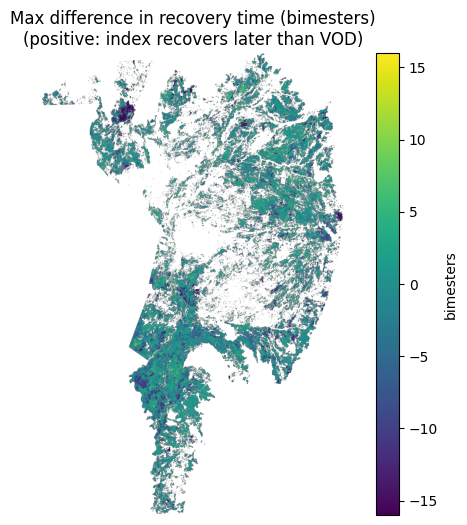

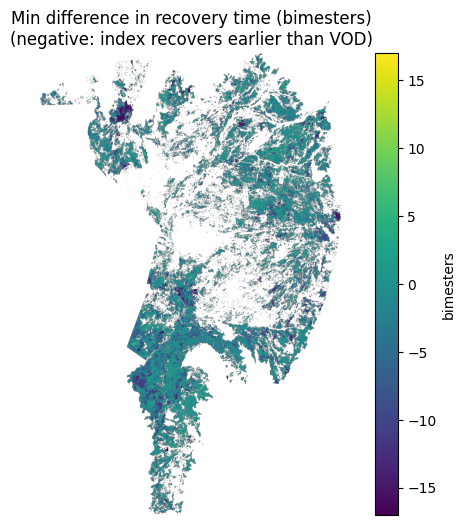

In [ ]:
# @title === NB3-EXTRA PATCH — Alinhar diffs a REF_FP e recomputar Dmax ===
import numpy as np, rasterio as rio, geopandas as gpd
from rasterio.warp import reproject, Resampling
from rasterio.features import rasterize
from pathlib import Path
import matplotlib.pyplot as plt

# Caminhos base (ajuste se necessário)
COMPARE_DIR = OUT_DIR / "compare_nb3"
diff_files = [
    COMPARE_DIR / "diff_NDVI_minus_VOD_bimestres.tif",
    COMPARE_DIR / "diff_EVI_minus_VOD_bimestres.tif",
    COMPARE_DIR / "diff_NBR_minus_VOD_bimestres.tif",
]

# 1) Abrir REF e preparar máscara do Pantanal
with rio.open(REF_FP) as ref:
    ref_profile = ref.meta.copy()
    ref_profile.update(count=1, dtype="float32", nodata=np.nan,
                       compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
    H, W = ref.height, ref.width
    ref_tfm = ref.transform
    ref_crs = ref.crs

# máscara do Pantanal na grade REF
gdf = gpd.read_file(BOUNDARY_PATH).to_crs(ref_crs)
mask = rasterize(
    [(geom, 1) for geom in gdf.geometry if geom and not geom.is_empty],
    out_shape=(H, W), transform=ref_tfm, fill=0, dtype="uint8"
).astype(bool)

def read_aligned_to_ref(fp: Path) -> np.ndarray:
    """Lê um raster e alinha (reprojeta/reamostra) para a grade do REF_FP."""
    if not fp.exists():
        # retorna tudo NaN se o arquivo não existir
        return np.full((H, W), np.nan, dtype="float32")
    with rio.open(fp) as src:
        arr = src.read(1).astype("float32")
        # tratar nodata explícito
        if src.nodata is not None:
            arr = np.where(arr == src.nodata, np.nan, arr)
        dst = np.full((H, W), np.nan, dtype="float32")
        reproject(
            source=arr, destination=dst,
            src_transform=src.transform, src_crs=src.crs,
            dst_transform=ref_tfm,     dst_crs=ref_crs,
            src_nodata=np.nan, dst_nodata=np.nan,
            resampling=Resampling.bilinear
        )
    # aplica clip do Pantanal
    dst = np.where(mask, dst, np.nan).astype("float32")
    return dst

# 2) Carrega e alinha todos os diffs
aligned_diffs = []
names = []
for fp in diff_files:
    arr = read_aligned_to_ref(fp)
    aligned_diffs.append(arr)
    names.append(fp.name)
    print(f"Alinhado: {fp.name} → shape={arr.shape}, finite={np.isfinite(arr).sum()}")

# 3) Dmax (máxima diferença, ignorando NaNs)
stack = np.stack(aligned_diffs, axis=0)  # shape: (3, H, W)
dmax = np.nanmax(stack, axis=0)          # maior (mais positivo) atraso vs VOD
# Também pode ser interessante o mínimo (mais negativo) — recupera antes do VOD:
dmin = np.nanmin(stack, axis=0)

# 4) Salvar GeoTIFFs alinhados
dmax_fp = COMPARE_DIR / "diff_DMAX_vs_VOD_bimestres.tif"
dmin_fp = COMPARE_DIR / "diff_DMIN_vs_VOD_bimestres.tif"
with rio.open(dmax_fp, "w", **ref_profile) as dst: dst.write(dmax, 1)
with rio.open(dmin_fp, "w", **ref_profile) as dst: dst.write(dmin, 1)
print("✔ DMAX salvo em:", dmax_fp)
print("✔ DMIN salvo em:", dmin_fp)

# 5) Plots rápidos (em inglês, pronto p/ artigo)
plt.figure(figsize=(8,6))
vmax = np.nanpercentile(np.abs(dmax), 99) if np.isfinite(dmax).any() else 5
plt.imshow(dmax, vmin=-vmax, vmax=vmax)
plt.title("Max difference in recovery time (bimesters)\n(positive: index recovers later than VOD)")
plt.colorbar(label="bimesters")
plt.axis("off")
plt.show()

plt.figure(figsize=(8,6))
vmax2 = np.nanpercentile(np.abs(dmin), 99) if np.isfinite(dmin).any() else 5
plt.imshow(dmin, vmin=-vmax2, vmax=vmax2)
plt.title("Min difference in recovery time (bimesters)\n(negative: index recovers earlier than VOD)")
plt.colorbar(label="bimesters")
plt.axis("off")
plt.show()



In [ ]:
# @title  === MASTER TABLE — Dmin/Dmax + Δ stats + metrics at τ=6,12,18 ===
import pandas as pd
from pathlib import Path

BASE_DIR    = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
OUT_DIR     = BASE_DIR / "outputs"
COMPARE_DIR = OUT_DIR / "compare_nb3"
COMPARE_DIR.mkdir(parents=True, exist_ok=True)

# insumos já gerados nas células anteriores
df_ll   = pd.read_csv(COMPARE_DIR/"leadlag_summary.csv")                # tem Dmin/Dmax e % faster/slower/tie
df_conf = pd.read_csv(COMPARE_DIR/"confusion_recovery_thresholds.csv")  # tem accuracy/precision/recall/F1 por τ

def pretty_pair(x):  # "NDVI~VOD" -> "NDVI"
    return x.split("~")[0].split()[0]

# bloco A — Dmin/Dmax e deltas
A = df_ll.copy()
A["Index"]    = A["pair"].apply(pretty_pair)
A = A.set_index("Index")[["mean","median","min","max","pct_optical_faster(<0)","pct_optical_slower(>0)","pct_tie(==0)"]]
A = A.rename(columns={
    "mean":"Δ_mean", "median":"Δ_median", "min":"Dmin", "max":"Dmax",
    "pct_optical_faster(<0)":"pct_faster(<0)", "pct_optical_slower(>0)":"pct_slower(>0)", "pct_tie(==0)":"pct_tie(=0)"
})

# bloco B — métricas por τ
B = df_conf.copy()
B["Index"] = B["pair"].apply(pretty_pair)
keep = B[["Index","threshold_bimestres","accuracy","precision","recall","F1"]]
tables = []
for tau in [6,12,18]:
    sub = keep[keep["threshold_bimestres"]==tau].set_index("Index")[["accuracy","precision","recall","F1"]]
    sub = sub.rename(columns={c:f"tau{tau}_{c}" for c in sub.columns})
    tables.append(sub)
Bwide = pd.concat(tables, axis=1)

# juntar
master = A.join(Bwide, how="outer").reindex(["NDVI","EVI","NBR"])
# formatação amigável (duas casas nas métricas; uma casa em Δ/Dmin/Dmax)
fmt_cols_1dec = ["Δ_mean","Δ_median","Dmin","Dmax","pct_faster(<0)","pct_slower(>0)","pct_tie(=0)"]
for c in fmt_cols_1dec:
    if c in master: master[c] = master[c].map(lambda v: f"{v:.1f}" if pd.notnull(v) else "—")
for c in master.columns:
    if c.startswith("tau"):
        master[c] = master[c].map(lambda v: f"{v:.3f}" if pd.notnull(v) else "—")

out_csv = COMPARE_DIR/"table_for_article_metrics.csv"
master.reset_index().rename(columns={"index":"Index"}).to_csv(out_csv, index=False)
print("✔ CSV salvo:", out_csv)
master


✔ CSV salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/table_for_article_metrics.csv


,Δ_mean,Δ_median,Dmin,Dmax,pct_faster(<0),pct_slower(>0),pct_tie(=0),tau6_accuracy,tau6_precision,tau6_recall,tau6_F1,tau12_accuracy,tau12_precision,tau12_recall,tau12_F1,tau18_accuracy,tau18_precision,tau18_recall,tau18_F1
Index,,,,,,,,,,,,,,,,,,,
NDVI,-2.1,-1.0,-17.0,17.0,52.0,25.3,22.8,0.802,0.817,0.977,0.890,0.926,0.926,0.999,0.961,1.000,1.000,1.000,1.000
EVI,-2.1,-1.0,-17.0,17.0,53.8,21.6,24.6,0.806,0.821,0.976,0.892,0.924,0.926,0.998,0.961,1.000,1.000,1.000,1.000
NBR,-1.8,0.0,-17.0,17.0,48.2,30.8,21.0,0.792,0.816,0.964,0.883,0.923,0.926,0.997,0.960,1.000,1.000,1.000,1.000


In [ ]:
# @title DIAG: distribuição de TTR e balanço para um τ (ex.: 6, 12, 18)
import numpy as np, pandas as pd, rasterio as rio
from pathlib import Path

BASE = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs")
REC  = BASE / "recovery_nb3"

def read_ttr(name):
    with rio.open(REC / f"recovery_time_{name}_bimestres.tif") as ds:
        return ds.read(1).astype("float32")

V = read_ttr("VOD")
N = read_ttr("NDVI"); E = read_ttr("EVI"); B = read_ttr("NBR")

def diag_tau(tau=12):
    M = np.isfinite(V)
    v = V[M]
    pos = (v <= tau).sum()
    neg = (v >  tau).sum()
    print(f"VOD @ τ={tau}: positivos={pos:,} ({pos/len(v):.1%}) | negativos={neg:,} ({neg/len(v):.1%})")

    # quantos thresholds do índice realmente mudam a predição?
    def unique_threshold_steps(A):
        A = A[M]
        steps = []
        last = None
        for t in range(1, 19):
            pred = (A <= t)
            key  = pred.mean()  # proporção positiva
            if (last is None) or (abs(key-last) > 1e-9):
                steps.append((t, float(key)))
                last = key
        return steps

    for name, A in [("NDVI",N), ("EVI",E), ("NBR",B)]:
        steps = unique_threshold_steps(A)
        print(f"{name}: thresholds úteis = {len(steps)}  → amostras: {[(t, round(p,3)) for t,p in steps[:6]]}{' ...' if len(steps)>6 else ''}")

diag_tau(tau=12)  # mude para 6/18 se quiser


VOD @ τ=12: positivos=650,566 (93.6%) | negativos=44,423 (6.4%)
NDVI: thresholds úteis = 18  → amostras: [(1, 0.405), (2, 0.75), (3, 0.855), (4, 0.882), (5, 0.888), (6, 0.895)] ...
EVI: thresholds úteis = 18  → amostras: [(1, 0.468), (2, 0.781), (3, 0.848), (4, 0.866), (5, 0.879), (6, 0.893)] ...
NBR: thresholds úteis = 18  → amostras: [(1, 0.26), (2, 0.663), (3, 0.832), (4, 0.866), (5, 0.869), (6, 0.875)] ...


In [ ]:
# @title --- PATCH REF_FP robusto para a grade 300 m (óptico) ---
from pathlib import Path
import glob, rasterio as rio

# Procura em "MyDrive" e "My Drive", nas pastas com e sem sufixo _merged
ROOTS = [Path("/content/drive/MyDrive"), Path("/content/drive/My Drive")]
CAND_FOLDERS = []
for r in ROOTS:
    CAND_FOLDERS += [
        r / "Pantanal_TippingPoints_optical",
        r / "Pantanal_TippingPoints_optical_merged",
    ]

# varre por arquivos opt_YYYYMM(.tif | _merged.tif)
cands = []
for d in CAND_FOLDERS:
    cands += glob.glob(str(d / "opt_??????.tif"))
    cands += glob.glob(str(d / "opt_??????_merged.tif"))

# filtra apenas os georreferenciados e escolhe um para referência
REF_FP = None
for fp in sorted(cands):
    try:
        with rio.open(fp) as ds:
            if ds.crs is not None and ds.transform is not None:
                REF_FP = fp
                break
    except Exception:
        pass

assert REF_FP is not None, (
    "Não encontrei um 'opt_YYYYMM.tif' georreferenciado nas pastas "
    f"{[str(p) for p in CAND_FOLDERS]}. Verifique se montou o Drive e se os ópticos estão lá."
)

with rio.open(REF_FP) as ref:
    H, W = ref.height, ref.width
    print("✔ REF_FP =", REF_FP)
    print(f"   shape=({H},{W}) | CRS={ref.crs} | res≈({abs(ref.transform.a):.2f} m, {abs(ref.transform.e):.2f} m)")


✔ REF_FP = /content/drive/My Drive/Pantanal_TippingPoints_optical/opt_198509.tif
   shape=(2448,1612) | CRS=EPSG:31983 | res≈(300.00 m, 300.00 m)


In [ ]:
# @title  PATCH — Fixar REF_FP e alinhar apenas tiles desalinhados de recovery_nb3
from pathlib import Path
import numpy as np, rasterio as rio
from rasterio.warp import reproject, Resampling

# 1) REF_FP informado por você (com espaço em "My Drive" — ok em Python)
REF_FP = "/content/drive/My Drive/Pantanal_TippingPoints_optical/opt_198509.tif"
assert Path(REF_FP).exists(), f"REF_FP não encontrado: {REF_FP}"

with rio.open(REF_FP) as ref:
    REF_META = ref.meta.copy()
    REF_CRS  = ref.crs
    REF_TFM  = ref.transform
    H, W     = ref.height, ref.width
print(f"✔ REF_FP = {REF_FP}")
print(f"   shape=({H},{W}) | CRS={REF_CRS} | res≈({abs(REF_TFM.a):.2f} m, {abs(REF_TFM.e):.2f} m)")

# 2) Pasta a corrigir
BASE_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index")
REC_DIR  = BASE_DIR / "outputs" / "recovery_nb3"
assert REC_DIR.exists(), f"Pasta não existe: {REC_DIR}"

# 3) Teste de alinhamento
def is_aligned(fp: Path) -> bool:
    try:
        with rio.open(fp) as ds:
            same_size = (ds.height == H and ds.width == W)
            same_crs  = (str(ds.crs) == str(REF_CRS))
            same_tfm  = np.allclose(
                np.array(ds.transform)[:6],  # a,b,c,d,e,f
                np.array(REF_TFM)[:6],
                atol=1e-6
            )
        return (same_size and same_crs and same_tfm)
    except Exception:
        return False

# 4) Realinhar (reprojetar) apenas os desalinhados
fixed, skipped, total = 0, 0, 0
for fp in sorted(REC_DIR.glob("rec_*_x???_y???.tif")):
    total += 1
    if is_aligned(fp):
        continue
    try:
        with rio.open(fp) as src:
            arr = src.read(1).astype("float32")
            src_tfm, src_crs = src.transform, src.crs

        # destino alinhado à grade REF
        dst = np.full((H, W), np.nan, dtype="float32")
        reproject(
            source=arr, destination=dst,
            src_transform=src_tfm, src_crs=src_crs,
            dst_transform=REF_TFM, dst_crs=REF_CRS,
            src_nodata=src.nodata if src.nodata is not None else np.nan,
            dst_nodata=np.nan,
            resampling=Resampling.bilinear
        )

        prof = REF_META.copy()
        prof.update(count=1, dtype="float32", nodata=np.nan,
                    compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")

        tmp = fp.with_suffix(".align.tmp.tif")
        with rio.open(tmp, "w", **prof) as dst_ds:
            dst_ds.write(dst, 1)

        # troca atômica
        tmp.replace(fp)
        fixed += 1
        print(f"✔ realinhado: {fp.name}")
    except Exception as e:
        skipped += 1
        print(f"(!) falha ao realinhar {fp.name}: {e}")

print(f"\nResumo: verificados={total} | realinhados={fixed} | falhas={skipped}")

# 5) (Opcional) Exportar variáveis para uso posterior nas próximas células
globals().update({
    "REF_META": REF_META, "REF_CRS": REF_CRS, "REF_TFM": REF_TFM,
    "BASE_DIR": BASE_DIR, "REC_DIR": REC_DIR
})



✔ REF_FP = /content/drive/My Drive/Pantanal_TippingPoints_optical/opt_198509.tif
   shape=(2448,1612) | CRS=EPSG:31983 | res≈(300.00 m, 300.00 m)

Resumo: verificados=24 | realinhados=0 | falhas=0


✔ RDNBR@evento (estrito) salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/RDNBR_EVT_strict.tif
Cortes RdNBR@evento (estrito): Q25=0.299 | Q50=0.519 | Q75=0.831


/tmp/ipython-input-2124319724.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=(0.02, 0.02, 0.98, 0.93))  # limite superior do layout (↓ de 0.90→0.93)


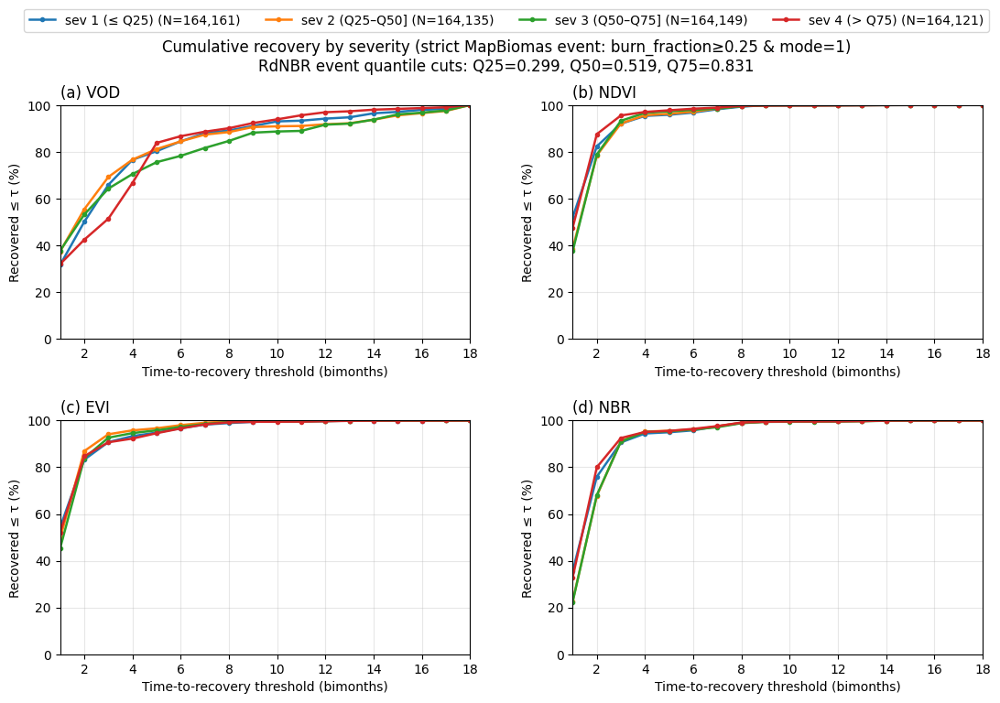

In [ ]:
# @title NB3 — Severidade por quantis (evento confirmado: frac≥0.25 & mode==1) + curvas 2×2

import numpy as np, rasterio as rio, matplotlib.pyplot as plt
from rasterio.warp import reproject, Resampling
from pathlib import Path
import re

OUT_DIR = Path("/content/drive/MyDrive/Pantanal_TippingPoints/index/outputs")
REC_DIR = OUT_DIR / "recovery_nb3"
CMP_DIR = OUT_DIR / "compare_nb3"; CMP_DIR.mkdir(parents=True, exist_ok=True)
F1_DIR  = OUT_DIR / "fase1_events_300m"  # RdNBR contínuo por bimestre

# --- util: lista YMS a partir dos arquivos rdnbr_YYYYMM.tif
def list_yms_from_rdnbr():
    yms = []
    pat = re.compile(r"rdnbr_(\d{6})\.tif$")
    for p in sorted(F1_DIR.glob("rdnbr_*.tif")):
        m = pat.search(p.name)
        if m: yms.append(m.group(1))
    return sorted(yms)

YMS = list_yms_from_rdnbr()
assert len(YMS) > 0, "Nenhum rdnbr_YYYYMM.tif encontrado em fase1_events_300m."

# --- grade de referência
ref_fp = REC_DIR / "recovery_time_VOD_bimestres.tif"
assert ref_fp.exists(), f"Faltando: {ref_fp}"
with rio.open(ref_fp) as ref:
    REF_META = ref.meta.copy()
    H, W = ref.height, ref.width
    REF_TFM = ref.transform
    REF_CRS = ref.crs
    ref_vod = ref.read(1).astype("float32")

# --- leitores alinhados à grade REF
def read_aligned(fp):
    with rio.open(fp) as src:
        a = src.read(1).astype("float32")
        # alinhar se necessário
        same_grid = (
            src.height==H and src.width==W and
            src.transform==REF_TFM and str(src.crs)==str(REF_CRS)
        )
        if same_grid:
            return a
        dst = np.full((H,W), np.nan, "f4")
        reproject(
            source=a, destination=dst,
            src_transform=src.transform, src_crs=src.crs,
            dst_transform=REF_TFM,     dst_crs=REF_CRS,
            src_nodata=np.nan, dst_nodata=np.nan,
            resampling=Resampling.bilinear
        )
        return dst

def read_frac_mode(ym):
    # usa sua função já existente (preferível)
    try:
        p_frac, p_mode = build_mb300_from_30m(ym, force=False)
        frac = read_aligned(p_frac)
        mode = read_aligned(p_mode).astype("float32")
    except NameError:
        raise RuntimeError("build_mb300_from_30m(ym) não está no escopo. Rode a célula onde ela é definida.")
    return frac, mode

# --- 1) RDNBR@evento (estrito) — primeiro bimestre com frac≥0.25 & mode==1
R_evt = np.full((H,W), np.nan, "f4")
taken = np.zeros((H,W), dtype=bool)

FRACTION_TH = 0.25  # seu critério
for ym in YMS:
    # máscaras de evento confirmadas pelo MapBiomas no bimestre ym
    frac, mode = read_frac_mode(ym)
    cond_fire = (frac >= FRACTION_TH) & (mode == 1)
    need = cond_fire & (~taken)

    if not need.any():
        continue

    # RdNBR contínuo do mesmo bimestre
    fp_r = F1_DIR / f"rdnbr_{ym}.tif"
    if not fp_r.exists():
        continue
    rdn = read_aligned(fp_r)

    # gravar somente onde ainda não tomamos evento
    val = rdn.astype("float32")
    R_evt[need] = val[need]
    taken[need] = True

# salvar para reuso
rdn_evt_fp = CMP_DIR / "RDNBR_EVT_strict.tif"
meta = REF_META.copy()
meta.update(count=1, dtype="float32", nodata=np.nan,
            compress="lzw", tiled=True, blockxsize=512, blockysize=512, BIGTIFF="IF_SAFER")
with rio.open(rdn_evt_fp, "w", **meta) as ds:
    ds.write(R_evt, 1)
print(f"✔ RDNBR@evento (estrito) salvo: {rdn_evt_fp}")

# --- 2) Cortes por quantis do RdNBR@evento (apenas onde VOD tem TTR)
M_base = np.isfinite(R_evt) & np.isfinite(ref_vod)
vals = R_evt[M_base]
assert vals.size > 0, "Sem pixels válidos após o filtro estrito (verifique FRAC/MODE e RdNBR)."

q25, q50, q75 = np.percentile(vals, [25,50,75])
print(f"Cortes RdNBR@evento (estrito): Q25={q25:.3f} | Q50={q50:.3f} | Q75={q75:.3f}")

SEV = {
    "sev 1 (≤ Q25)":   M_base & (R_evt <= q25),
    "sev 2 (Q25–Q50]": M_base & (R_evt >  q25) & (R_evt <= q50),
    "sev 3 (Q50–Q75]": M_base & (R_evt >  q50) & (R_evt <= q75),
    "sev 4 (> Q75)":   M_base & (R_evt >  q75),
}

# --- 3) Abrir TTR de todas as métricas
def open_ttr(metric):
    fp = REC_DIR / f"recovery_time_{metric}_bimestres.tif"
    with rio.open(fp) as ds: return ds.read(1).astype("float32")
ARR = {m: open_ttr(m) for m in ["VOD","NDVI","EVI","NBR"]}

# --- 4) Curvas cumulativas e plot 2×2 (com mais espaço no topo)
fig, axs = plt.subplots(
    2, 2, figsize=(13, 8),
    constrained_layout=False,              # desliga pra controlarmos manualmente
    gridspec_kw={"hspace": 0.35, "wspace": 0.25}  # mais respiro entre painéis
)
axs = axs.ravel()

legend_handles = None
for ax, m in zip(axs, metrics):
    A = ARR[m]
    for lab, mk in SEV.items():
        T, P, N = cum_curve(A, mk)
        line = ax.plot(T, P, marker="o", ms=3, lw=1.8, label=f"{lab} (N={N:,})")[0]
        legend_handles = legend_handles or [line]  # pega apenas 1ª leva de handles
    ax.set_xlim(1, 18); ax.set_ylim(0, 100)
    ax.set_xticks([2,4,6,8,10,12,14,16,18])
    ax.set_ylabel("Recovered ≤ τ (%)")
    ax.set_xlabel("Time-to-recovery threshold (bimonths)")
    ax.grid(True, alpha=0.3)
    ax.set_title(titles[m], loc="left", fontsize=12)

# legenda fora dos eixos, acima dos painéis
fig.legend(
    labels=[f"{k} (N={int((SEV[k] & np.isfinite(ARR['VOD'])).sum()):,})" for k in SEV.keys()],
    handles=[axs[0].lines[i] for i in range(len(SEV))],
    loc="upper center", bbox_to_anchor=(0.5, 1), ncol=4, frameon=True
)

# título geral, mais alto
fig.suptitle(
    "Cumulative recovery by severity (strict MapBiomas event: burn_fraction≥0.25 & mode=1)\n"
    f"RdNBR event quantile cuts: Q25={q25:.3f}, Q50={q50:.3f}, Q75={q75:.3f}",
    y=0.95, fontsize=12
)

## menos respiro entre linhas/colunas
for ax in axs: ax.margins(x=0.01, y=0.02)
plt.tight_layout(rect=(0.02, 0.02, 0.98, 0.93))  # limite superior do layout (↓ de 0.90→0.93)
# opcional: ajuste fino global
fig.subplots_adjust(hspace=0.2, wspace=0.22, top=0.86)
plt.show()





In [ ]:
# @title Hotspots de não-recuperação (cruzando first_fire e TTR) — com checkpoints e tqdm
from pathlib import Path
import numpy as np, rasterio as rio
from rasterio.features import shapes
import geopandas as gpd
from shapely.geometry import shape
import pandas as pd
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

# ----------------- Parâmetros / caminhos -----------------
ROOT = Path('/content/drive/MyDrive/Pantanal_TippingPoints').resolve()
REC_DIR = ROOT/'index/outputs/recovery_nb3'                 # onde estão first_fire_*.tif e recovery_time_*_bimestres.tif
OUT_DIR = ROOT/'index'/'outputs'/'compare_nb3'
OUT_DIR.mkdir(parents=True, exist_ok=True)

INDICES = ['NDVI','EVI','NBR','VOD']
MIN_POLY_PIXELS = 25        # filtro de área mínima p/ vetor (≈ 25 px = ~0.225 km² em 300 m) — ajuste se quiser

# ----------------- [1/6] Carregar first_fire -----------------
print("✓ [1/6] Lendo first_fire…")
ff_fp = None
for cand in sorted(REC_DIR.glob('first_fire_*.tif')):
    ff_fp = cand; break
assert ff_fp is not None, "first_fire_*.tif não encontrado em recovery_nb3."

with rio.open(ff_fp) as ds:
    FF = ds.read(1).astype('float64')
    meta = ds.meta.copy()
    crs = ds.crs
    transform = ds.transform
nod = meta.get('nodata', None)
if nod is not None:
    FF[FF==nod] = np.nan

burned_any = np.isfinite(FF) & (FF>0)  # queimou pelo menos uma vez
valid_grid = np.ones_like(burned_any, dtype=bool)  # usa toda a grade como denominador "total" (exceto NaNs futuros)

print(f"   → queimados: {burned_any.sum():,d} pixels")

# ----------------- [2/6] Criar máscaras de não-recuperação por índice -----------------
print("✓ [2/6] Gerando máscaras por índice…")
union_mask = np.zeros_like(burned_any, dtype=bool)
per_index_rows = []

for idx in tqdm(INDICES):
    ttr_fp = REC_DIR/f'recovery_time_{idx}_bimestres.tif'
    assert ttr_fp.exists(), f'Arquivo ausente: {ttr_fp.name}'
    with rio.open(ttr_fp) as ds:
        TTR = ds.read(1).astype('float64')
        meta_ttr = ds.meta.copy()
        if ds.nodata is not None:
            TTR[TTR==ds.nodata] = np.nan

    # critério: queimou e (sem TTR ou TTR>18)
    nonrec = burned_any & ( ~np.isfinite(TTR) | (TTR>18) )
    union_mask |= nonrec

    # salvar GeoTIFF uint8
    out_tif = OUT_DIR/f'hotspots_nonrec_{idx}.tif'
    meta_u8 = meta_ttr.copy()
    meta_u8.update(count=1, dtype='uint8', nodata=0, compress='lzw')
    with rio.open(out_tif, 'w', **meta_u8) as dst:
        dst.write(nonrec.astype('uint8'), 1)
    print(f"   → {idx}: {nonrec.sum():,d} px não-recuperados | salvo: {out_tif.name}")

    # frações
    frac_burned = (nonrec.sum() / max(burned_any.sum(), 1)) if burned_any.any() else np.nan
    frac_total  = (nonrec.sum() / valid_grid.sum())
    per_index_rows.append(dict(index=idx,
                               nonrec_px=int(nonrec.sum()),
                               frac_among_burned=frac_burned,
                               frac_of_total=frac_total))

# ----------------- [3/6] Salvar união -----------------
print("✓ [3/6] Salvando união (qualquer índice)…")
union_tif = OUT_DIR/'hotspots_nonrec_UNION.tif'
meta_u8 = meta.copy()
meta_u8.update(count=1, dtype='uint8', nodata=0, compress='lzw')
with rio.open(union_tif, 'w', **meta_u8) as dst:
    dst.write(union_mask.astype('uint8'), 1)
print(f"   → união: {union_mask.sum():,d} px | salvo: {union_tif.name}")

# ----------------- [4/6] Frações (csv) -----------------
print("✓ [4/6] Calculando frações…")
rows = per_index_rows + [dict(index='UNION',
                              nonrec_px=int(union_mask.sum()),
                              frac_among_burned=(union_mask.sum()/max(burned_any.sum(),1)) if burned_any.any() else np.nan,
                              frac_of_total=(union_mask.sum()/valid_grid.sum()))]
fra_df = pd.DataFrame(rows).sort_values(['index'])
fra_csv = OUT_DIR/'hotspots_fractions.csv'
fra_df.to_csv(fra_csv, index=False)
print("   → Frações salvas em:", fra_csv)

# ----------------- [5/6] Vetorização (máscara união) -----------------
print("✓ [5/6] Vetorizando (máscara união)…")
geoms = []
if union_mask.any():
    for geom, val in shapes(union_mask.astype('uint8'), mask=union_mask, transform=transform):
        if val == 1:
            geoms.append(shape(geom))

    if geoms:
        # vetor 'value' com mesmo tamanho das geometrias
        values = [1] * len(geoms)
        gdf = gpd.GeoDataFrame({'value': values}, geometry=geoms, crs=crs)

        # reparar geometrias inválidas (se houver)
        if not gdf.is_valid.all():
            gdf['geometry'] = gdf.buffer(0)

        # filtro de área mínima (se CRS projetado)
        if gdf.crs and gdf.crs.is_projected:
            pix_area = abs(transform.a) * abs(transform.e)   # m² por pixel
            min_area = MIN_POLY_PIXELS * pix_area
            gdf = gdf[gdf.area >= min_area].copy()

        # (opcional) dissolver para reduzir fragmentação
        gdf = gdf.dissolve(by='value', as_index=False)

        poly_fp = OUT_DIR/'hotspots_nonrec_UNION.geojson'
        gdf.to_file(poly_fp, driver='GeoJSON')
        print("   → Polígonos salvos:", poly_fp)
    else:
        print("   → Nenhum polígono a salvar (união vazia).")
else:
    print("   → União vazia; nada a vetorizar.")

# ----------------- [6/6] Heatmap rápido -----------------
print("✓ [6/6] Heatmap…")
plt.figure(figsize=(7,6))
plt.imshow(np.where(union_mask, 1, np.nan))
plt.title('Hotspots de não-recuperação (união de índices)')
plt.axis('off')
png_fp = OUT_DIR/'hotspots_nonrec_UNION_heatmap.png'
plt.savefig(png_fp, dpi=180, bbox_inches='tight'); plt.close()
print("   → PNG salvo:", png_fp)


✓ [1/6] Lendo first_fire…
   → queimados: 949,064 pixels
✓ [2/6] Gerando máscaras por índice…


  0%|          | 0/4 [00:00<?, ?it/s]

   → NDVI: 105,873 px não-recuperados | salvo: hotspots_nonrec_NDVI.tif
   → EVI: 104,895 px não-recuperados | salvo: hotspots_nonrec_EVI.tif
   → NBR: 118,019 px não-recuperados | salvo: hotspots_nonrec_NBR.tif
   → VOD: 254,075 px não-recuperados | salvo: hotspots_nonrec_VOD.tif
✓ [3/6] Salvando união (qualquer índice)…
   → união: 317,269 px | salvo: hotspots_nonrec_UNION.tif
✓ [4/6] Calculando frações…
   → Frações salvas em: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_fractions.csv
✓ [5/6] Vetorizando (máscara união)…
   → Polígonos salvos: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_nonrec_UNION.geojson
✓ [6/6] Heatmap…
   → PNG salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_nonrec_UNION_heatmap.png


In [ ]:
# @title A) Setup e leitura do ano do primeiro fogo (com checkpoints)
from pathlib import Path
import numpy as np, rasterio as rio
from rasterio.errors import NotGeoreferencedWarning
import warnings, math, sys, json, pandas as pd
from tqdm.auto import tqdm

warnings.filterwarnings("ignore", category=NotGeoreferencedWarning)

ROOT = Path('/content/drive/MyDrive/Pantanal_TippingPoints').resolve()
IN_DIR  = ROOT/'index'/'outputs'/'recovery_nb3'
OUT_DIR = ROOT/'index'/'outputs'/'compare_nb3'/'hotspots_by_year'
OUT_DIR.mkdir(parents=True, exist_ok=True)

FIRST_FIRE_FP = IN_DIR/'first_fire_yyyymm.tif'
REC_FP = {k: IN_DIR/f'recovery_time_{k}_bimestres.tif' for k in ['NDVI','EVI','NBR','VOD']}

print("✓ [1/3] Verificando arquivos…")
assert FIRST_FIRE_FP.exists(), f"first_fire_yyyymm.tif não encontrado em {FIRST_FIRE_FP}"
for k,fp in REC_FP.items():
    assert fp.exists(), f"{fp} não encontrado."

print("✓ [2/3] Lendo first_fire_yyyymm.tif…")
with rio.open(FIRST_FIRE_FP) as ds:
    FF = ds.read(1).astype('float32')
    meta = ds.meta.copy()
    transform, crs = ds.transform, ds.crs

# Extrai ANO como floor(yyyymm/100)
print("✓ [3/3] Convertendo YYYYMM → YEAR…")
YEAR = np.where(np.isfinite(FF), np.floor_divide(FF.astype(np.int64), 100), np.nan).astype('float32')

# Faixa de anos observados
years = np.unique(YEAR[np.isfinite(YEAR)])
years = years.astype(int)
print(f"→ Anos observados no first_fire: {years.min()}–{years.max()} | total={len(years)}")

# Por rigor/censura: remover 2019–2021 dos resumos (sem impedir o mapa/union)
CENSORED_YEARS = {2019, 2020, 2021}
years_valid = np.array([y for y in years if y not in CENSORED_YEARS], dtype=int)
print(f"→ Anos considerados para contagem (sem censura): {years_valid.min()}–{years_valid.max()} | excluídos: {sorted(CENSORED_YEARS)}")

# Salva um GeoTIFF com o "ano do primeiro fogo" (opcional; útil para inspeção)
year_fp = OUT_DIR/'first_fire_year.tif'
meta_year = meta.copy()
meta_year.update(dtype='float32', nodata=np.nan)
with rio.open(year_fp, 'w', **meta_year) as dst:
    dst.write(YEAR, 1)
print("✔ YEAR salvo para conferência:", year_fp)





✓ [1/3] Verificando arquivos…
✓ [2/3] Lendo first_fire_yyyymm.tif…
✓ [3/3] Convertendo YYYYMM → YEAR…
→ Anos observados no first_fire: -100–2021 | total=36
→ Anos considerados para contagem (sem censura): -100–2018 | excluídos: [2019, 2020, 2021]
✔ YEAR salvo para conferência: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_by_year/first_fire_year.tif


In [ ]:
# @title B) Geração das máscaras de não recuperados por índice e contagem por ano (com tqdm e checkpoints)
import numpy as np, rasterio as rio
from tqdm.auto import tqdm
import pandas as pd

INDICES = ['NDVI','EVI','NBR','VOD']

print("✓ [1/5] Lendo TTRs por índice…")
TTR = {}
for idx in INDICES:
    with rio.open(REC_FP[idx]) as ds:
        TTR[idx] = ds.read(1).astype('float32')

# Regra de “não recuperado”: queimou & (TTR NaN ou TTR>18)
print("✓ [2/5] Construindo máscaras por índice…")
burn_mask = np.isfinite(YEAR)  # queimou em algum ano
NR = {}  # non-recovery mask por índice
for idx in INDICES:
    t = TTR[idx]
    nr = burn_mask & (~np.isfinite(t) | (t > 18))
    NR[idx] = nr
    # salva raster binário por índice
    out_fp = OUT_DIR/f'hotspots_nonrec_{idx}.tif'
    meta_out = meta.copy()
    meta_out.update(dtype='uint8', nodata=255)
    with rio.open(out_fp, 'w', **meta_out) as dst:
        dst.write(nr.astype('uint8'), 1)
    print(f"   → {idx}: {nr.sum():,} px não-recuperados | salvo: {out_fp}")

# União (qualquer índice)
print("✓ [3/5] União (qualquer índice não recuperado)…")
nr_union = np.zeros_like(burn_mask, dtype=bool)
for idx in INDICES:
    nr_union |= NR[idx]

union_fp = OUT_DIR/'hotspots_nonrec_UNION.tif'
meta_union = meta.copy()
meta_union.update(dtype='uint8', nodata=255)
with rio.open(union_fp, 'w', **meta_union) as dst:
    dst.write(nr_union.astype('uint8'), 1)
print("   → União: {:,} px | salvo: {}".format(int(nr_union.sum()), union_fp))

# Contagem anual por índice e união (excluindo anos censurados para as barras)
print("✓ [4/5] Contagens por ano (exclui 2019–2021)…")
rows = []
for y in tqdm(years_valid, total=len(years_valid)):
    sel_y = (YEAR == y)
    burned_y = burn_mask & sel_y
    total_burned_y = int(burned_y.sum())
    for idx in INDICES + ['UNION']:
        m = nr_union if idx=='UNION' else NR[idx]
        nonrec_y = int((m & sel_y).sum())
        rows.append(dict(year=y, index=idx, burned_px=total_burned_y, nonrec_px=nonrec_y))

tab = pd.DataFrame(rows).sort_values(['index','year'])
out_csv = OUT_DIR/'nonrecovery_counts_by_year.csv'
tab.to_csv(out_csv, index=False)
print("✔ Tabela anual salva:", out_csv)

# Pequeno resumo top-anos por união
print("✓ [5/5] Top anos (UNION) por não-recup.:")
print(tab[tab['index']=='UNION'].sort_values('nonrec_px', ascending=False).head(10))



✓ [1/5] Lendo TTRs por índice…
✓ [2/5] Construindo máscaras por índice…
   → NDVI: 3,102,985 px não-recuperados | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_by_year/hotspots_nonrec_NDVI.tif
   → EVI: 3,102,007 px não-recuperados | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_by_year/hotspots_nonrec_EVI.tif
   → NBR: 3,115,131 px não-recuperados | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_by_year/hotspots_nonrec_NBR.tif
   → VOD: 3,251,187 px não-recuperados | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_by_year/hotspots_nonrec_VOD.tif
✓ [3/5] União (qualquer índice não recuperado)…
   → União: 3,314,381 px | salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_by_year/hotspots_nonrec_UNION.tif
✓ [4/5] Contagens por ano (exclui 2019–2021)…


  0%|          | 0/33 [00:00<?, ?it/s]

✔ Tabela anual salva: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_by_year/nonrecovery_counts_by_year.csv
✓ [5/5] Top anos (UNION) por não-recup.:
     year  index  burned_px  nonrec_px
4    -100  UNION    2997112    2997112
14   1988  UNION     105781      67109
9    1987  UNION      36272      36272
39   1993  UNION      94980      34519
24   1990  UNION      36991      27761
29   1991  UNION      64084       4969
19   1989  UNION      10017       4270
154  2016  UNION       4303       3925
94   2004  UNION      15053       3886
149  2015  UNION       2124       2092


✓ [1/6] Abrindo rasters…
✓ [2/6] Checando amostras…
   não-recuperados: 317,269 | queimados: 949,064
✓ [3/6] Calculando fração local (uniform_filter)…
✓ [5/6] Plotando heatmap…


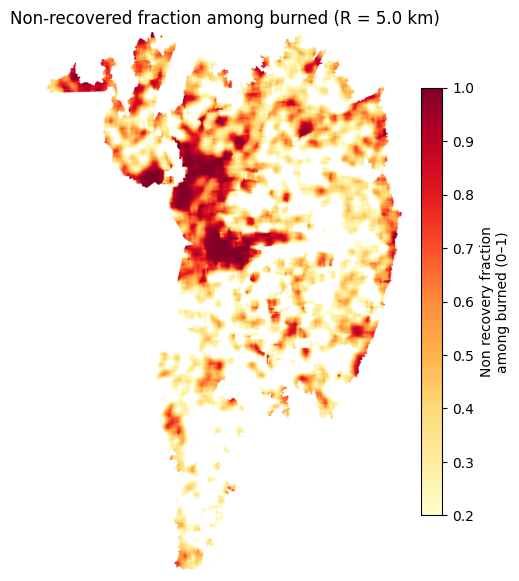

   → salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_fraction_R5km.png
✓ [6/6] Agregando por ano do primeiro fogo…


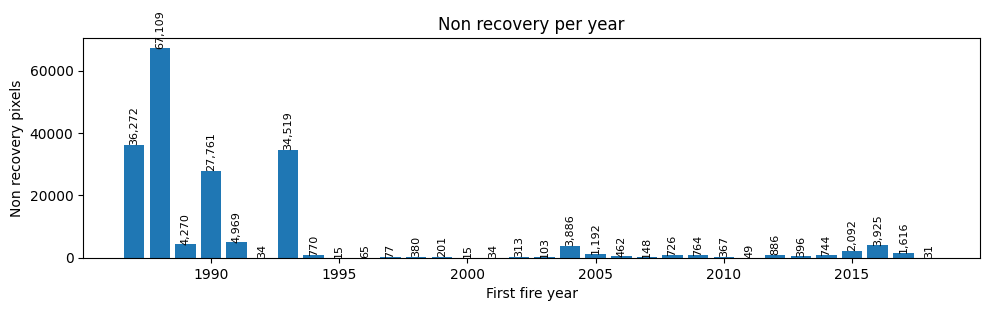

   → salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_nonrec_by_year.png
✓ Concluído. CSV salvo: /content/drive/MyDrive/Pantanal_TippingPoints/index/outputs/compare_nb3/hotspots_nonrec_by_year.csv


In [ ]:
# @title Hotspots de não-recuperação: fração local (YlOrRd) + barras por ano (com checkpoints)
import numpy as np, pandas as pd, math
import rasterio as rio
from rasterio.enums import Resampling
from rasterio.mask import mask as rio_mask
from rasterio.features import shapes
import geopandas as gpd
from shapely.geometry import shape, mapping
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter, generate_binary_structure

# ========== CONFIG ==========
ROOT = Path('/content/drive/MyDrive/Pantanal_TippingPoints').resolve()
OUT_DIR = ROOT/'index'/'outputs'/'compare_nb3'
OUT_DIR.mkdir(parents=True, exist_ok=True)

FIRST_FIRE_FP = ROOT/'index/outputs/recovery_nb3'/'first_fire_yyyymm.tif'
NONREC_UNION_FP = OUT_DIR/'hotspots_nonrec_UNION.tif'   # já gerado na etapa anterior
# Opção A (preferida): máscara raster 0/1 do Pantanal com MESMO grid (veloz)
PANTANAL_MASK_RASTER = ROOT/'region'/'pantanal_mask_300m.tif'   # mude se necessário
# Opção B: shapefile do Pantanal (usado se o raster acima não existir)
PANTANAL_SHP = ROOT/'Pantanal.shp'

# Janela para densidade (raio em km; p.ex., 5 km). Em 300 m/pixel: 5km ≈ 16-17 px
PIXEL_SIZE_M = 300.0
R_KM = 5.0
# ===========================

print("✓ [1/6] Abrindo rasters…")
with rio.open(NONREC_UNION_FP) as ds_nr:
    nr = ds_nr.read(1)
    meta = ds_nr.meta.copy()
    tfm  = ds_nr.transform
    crs  = ds_nr.crs
    px_m = abs(tfm.a)  # tamanho do pixel em metros (assumindo CRS projetado)
with rio.open(FIRST_FIRE_FP) as ds_ff:
    same_grid = (ds_ff.width==meta['width'] and ds_ff.height==meta['height'] and ds_ff.transform==tfm and ds_ff.crs==crs)
    if not same_grid:
        print("  └─ grids diferentes: reamostrando first_fire para a grade da máscara…")
        ff = ds_ff.read(
            1,
            out_shape=(meta['height'], meta['width']),
            resampling=Resampling.nearest
        )
    else:
        ff = ds_ff.read(1)

# máscaras básicas
M_valid = np.isfinite(nr)
M_nonrec = (nr==1) & M_valid

# "Queimados" = existe primeiro fogo válido (>0). Se raster estiver em YYYYMM, valores são >= 190001
M_burned = np.isfinite(ff) & (ff>0)

print("✓ [2/6] Checando amostras…")
print(f"   não-recuperados: {int(M_nonrec.sum()):,} | queimados: {int(M_burned.sum()):,}")

# ------------ FRAÇÃO LOCAL ENTRE QUEIMADOS (janela circular) ------------
print("✓ [3/6] Calculando fração local (uniform_filter)…")
# raio em pixels
r_px = max(1, int(round((R_KM*1000.0) / px_m)))
# usamos filtro uniforme separável em janela quadrada e mascaramos fora do círculo
win = (2*r_px+1)
# somatórios na janela
num = uniform_filter(M_nonrec.astype('f4'), size=win, mode='constant', cval=0)*win*win
den = uniform_filter(M_burned.astype('f4'), size=win, mode='constant', cval=0)*win*win
frac = np.divide(num, den, out=np.zeros_like(num, dtype='f4'), where=den>0)
frac = np.clip(frac, 0, 1)

# ✓ [4/6] Recortando pelo shapefile do Pantanal…
from rasterio.io import MemoryFile
from shapely.geometry import mapping

aoi = gpd.read_file(PANTANAL_SHP).to_crs(crs)
shapes_aoi = [mapping(g) for g in aoi.geometry]

# profile em float32 (aceita NaN)
prof = {
    'driver': 'GTiff',
    'height': meta['height'],
    'width':  meta['width'],
    'count':  1,
    'dtype':  'float32',
    'crs':    crs,
    'transform': tfm,
    'nodata': np.nan,
}

frac32 = frac.astype('float32', copy=False)

with MemoryFile() as mem:
    with mem.open(**prof) as ds_tmp:
        ds_tmp.write(frac32, 1)                # escreve a fração (0–1) em float32
    with mem.open() as ds_tmp_r:
        frac_clip, _ = rio_mask(
            ds_tmp_r, shapes_aoi, crop=True, filled=True, nodata=np.nan
        )

frac_clip = frac_clip[0]  # (H, W)

# ------------ PLOT HEATMAP (YlOrRd, 0–1) ------------
print("✓ [5/6] Plotando heatmap…")
# colormap YlOrRd com “under” branco (valores ==0 ficam brancos)
thr = 0.20  # tudo <0.20 ficará branco

arr = np.array(frac_clip, copy=True)
arr[arr < thr] = np.nan  # mascara os valores baixos

cmap = plt.cm.YlOrRd.copy()
cmap.set_bad('white')  # NaN = branco

fig, ax = plt.subplots(figsize=(6,7))
im = ax.imshow(arr, cmap=cmap, vmin=thr, vmax=1.0)
ax.set_axis_off()

cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Non recovery fraction\namong burned (0–1)')
plt.title(f'Non-recovered fraction among burned (R = {R_KM:.1f} km)')
plt.axis('off')
out_png_heat = OUT_DIR/f'hotspots_fraction_R{int(R_KM)}km.png'
plt.savefig(out_png_heat, dpi=220, bbox_inches='tight')
plt.show()
print("   → salvo:", out_png_heat)

# ------------ BARRAS POR ANO DO PRIMEIRO FOGO ------------
print("✓ [6/6] Agregando por ano do primeiro fogo…")
# extrai ano: se estiver em YYYYMM, usa //100; se já for ano, fica igual
year = np.where(ff>190000, (ff//100).astype('int32'), ff.astype('int32'))
mask_count = M_nonrec & M_burned & np.isfinite(year)
years, counts = np.unique(year[mask_count], return_counts=True)

# filtra anos plausíveis e remove caudas (opcional)
years_ok = (years>=1987) & (years<=2018)  # até 2018 (3 anos antes de 2021)
years, counts = years[years_ok], counts[years_ok]

# plot
plt.figure(figsize=(10,3.2))
plt.bar(years, counts)
for y, c in zip(years, counts):
    if c>0:
        plt.text(y, c, f"{c:,}", ha='center', va='bottom', fontsize=8, rotation=90)
plt.xlabel('First fire year')
plt.ylabel('Non recovery pixels')
plt.title('Non recovery per year')
plt.tight_layout()
out_png_bar = OUT_DIR/'hotspots_nonrec_by_year.png'
plt.savefig(out_png_bar, dpi=220)
plt.show()
print("   → salvo:", out_png_bar)

# checkpoint final
pd.DataFrame({'year':years, 'nonrec_px':counts}).to_csv(OUT_DIR/'hotspots_nonrec_by_year.csv', index=False)
print("✓ Concluído. CSV salvo:", OUT_DIR/'hotspots_nonrec_by_year.csv')

